# University of Michigan 
# Master of Applied Data Science
### SIAD 699: Capstone
Team: James Yoon (jamyoon), Mario Feliciano (felicma), and James Tuccori (jtuccori)

Date: April 2023
____
# Social Media Sentiment & Predicting Trading Signals 

#### We take the three years of extraxts , to then transform the data and create our twitter KPIs/Features. We then merged that data with the Binance dataframe, Alpaca News API, and Google trends.  Fom there we got our Merged Binance/Tweeter dataframe with 2208 hourly data points that we use for our training/testing for supervised and unsupervised

# Contents of Notebook


1.   **Key Installations and Libraries used**
2.   **Creating Hourly Binance Data**
3.  **Creating Twitter  Data**
4.   **Merging Binance and Twitter Dataframes**
5.    **Visualizations**
6.    **Documentation**

# 1. Key Installations and Libraries used

In [2]:
!pip install python-binance mplfinance
!pip install ta
!pip install tweepy
!pip install alpaca-trade-api
!pip install transformers
!pip install TextBlob
!pip install yfinance
!pip install mplcursors

     ---------------------------------------- 67.6/67.6 kB 3.6 MB/s eta 0:00:00
     ---------------------------------------- 73.1/73.1 kB ? eta 0:00:00
     ---------------------------------------- 1.7/1.7 MB 22.1 MB/s eta 0:00:00
     ---------------------------------------- 293.8/293.8 kB ? eta 0:00:00
     ------------------------------------- 341.8/341.8 kB 20.7 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for ta: filename=ta-0.10.2-py3-none-any.whl size=29088 sha256=767ffe4f0485d7fe662a1ea2e54d2260202cb74b10614c245cee5d26cea6bb6c
  Stored in directory: c:\users\mario\appdata\local\pip\cache\wheels\6a\76\03\7f785aaa50b9c6ec7e3fd105a62c1b2c45a034512d51e024a9
Successfully built ta


     -------------------------------------- 102.8/102.8 kB 6.2 MB/s eta 0:00:00


In [1]:
from binance import Client, ThreadedWebsocketManager, ThreadedDepthCacheManager
import pandas as pd
import mplfinance as mpf
import numpy as np

from datetime import datetime
import time

import tweepy
from textblob import TextBlob
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

#2. Creating Hourly Binance Data

Using the API Key and Secret key from binance, needs to be created with a Binance Account

In [2]:
#adding our API and Secret
# apikey = 'YKiGlhQS87UtYw1oiQ1mx2emOUVlzUtOP22egynlBvRwheYQoeVrH2NbpctrwlZO'
# secret = 'zeupnruobh1mG77pI64xiNeziaOtQfa7vqOfeR00bbRpJpEV6nLaaRa3StbewVTb'

apikey = 'Tei1cl6Qncsr03oPvcFN0eW5PfaYZGIf7ZtoX6TBKB7G8UvJTzQsYhB92vzi9NdN'
secret = 'kePezzaWGED3MYgzWYldFCfgNg69Tcm7vv1IEvFazKTKrT54fOyyTONualYiHnBF'


#Authenticating

client = Client(apikey, secret)

Using binance library to extract hourly bitcoin to usd price data from 9 September to 16 September 2021

In [3]:
#getting daily data
historical = client.get_historical_klines('BTCUSDT', Client.KLINE_INTERVAL_1HOUR, '1 Jan 2019')
Original_df_historical = pd.DataFrame(historical)
df_historical= Original_df_historical.copy()

df_historical.columns = ['Open Time', 'Open', 'High', 'Low', 'Close', 'Volume', 'Close Time', 'Quote Asset Volume', 
                    'Number of Trades', 'TB Base Volume', 'TB Quote Volume', 'Ignore']

#changing time to standard units
df_historical['Open Time'] = pd.to_datetime(df_historical['Open Time']/1000, unit='s')
df_historical['Close Time'] = pd.to_datetime(df_historical['Close Time']/1000, unit='s')
df_historical['Close Time'] = df_historical['Close Time'].values.astype('datetime64[h]')

#changing numbers to integer
numeric_columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Quote Asset Volume', 'TB Base Volume', 'TB Quote Volume']
df_historical[numeric_columns] = df_historical[numeric_columns].apply(pd.to_numeric, axis=1)


In [4]:
df_historical

,Open Time,Open,High,Low,Close,Volume,Close Time,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore
0,2019-01-01 00:00:00,3701.23,3713.00,3689.88,3700.31,686.367420,2019-01-01 00:00:00,2.539069e+06,5534,370.855314,1.371962e+06,0
1,2019-01-01 01:00:00,3700.20,3702.73,3684.22,3689.69,613.539115,2019-01-01 01:00:00,2.266700e+06,5086,320.644448,1.184519e+06,0
2,2019-01-01 02:00:00,3689.67,3695.95,3675.04,3690.00,895.302181,2019-01-01 02:00:00,3.302044e+06,6391,471.857118,1.740469e+06,0
3,2019-01-01 03:00:00,3690.00,3699.77,3685.78,3693.13,796.714818,2019-01-01 03:00:00,2.942422e+06,5709,459.948381,1.698857e+06,0
4,2019-01-01 04:00:00,3692.32,3720.00,3685.94,3692.71,1317.452909,2019-01-01 04:00:00,4.872937e+06,7908,770.995533,2.852106e+06,0
...,...,...,...,...,...,...,...,...,...,...,...,...
37121,2023-03-30 05:00:00,28587.63,28633.70,28491.39,28613.98,2288.371470,2023-03-30 05:00:00,6.535762e+07,51314,1180.010930,3.370695e+07,0
37122,2023-03-30 06:00:00,28613.97,28674.69,28566.67,28613.88,2552.167650,2023-03-30 06:00:00,7.302652e+07,54851,1201.460220,3.437935e+07,0
37123,2023-03-30 07:00:00,28613.89,28775.60,28579.43,28725.01,3479.455780,2023-03-30 07:00:00,9.977604e+07,69338,1848.476910,5.300206e+07,0
37124,2023-03-30 08:00:00,28725.00,28748.76,28568.54,28572.81,3140.643300,2023-03-30 08:00:00,9.001498e+07,62804,1278.120700,3.664118e+07,0


In [5]:
#seeting clouse time as the index
df_historical2_hourly =df_historical.set_index('Close Time')

Calculating the base three hour moving average

In [6]:
#calculating Moving average
# Example 2: 
numbers = df_historical2_hourly['Close']
window_size = 3

i = 0
moving_averages = []
for i in range(len(numbers)):
    try:
#         this_window = numbers[i : i + window_size]
        this_window = numbers[i - window_size: i]
#Get current window
        window_average = sum(this_window) / window_size
        moving_averages.append(window_average)
        i += 1
    except ValueError:
        print(NaN)
#print(moving_averages)

In [7]:
moving_averages

[0.0,
 0.0,
 0.0,
 3693.3333333333335,
 3690.94,
 3691.9466666666667,
 3695.26,
 3698.736666666666,
 3705.7766666666666,
 3711.3633333333332,
 3710.16,
 3709.9066666666663,
 3706.853333333334,
 3712.536666666667,
 3713.49,
 3710.486666666667,
 3699.023333333333,
 3691.56,
 3687.49,
 3679.7566666666667,
 3680.8199999999997,
 3691.713333333333,
 3707.9799999999996,
 3712.8033333333333,
 3738.85,
 3762.1200000000003,
 3781.72,
 3777.1000000000004,
 3777.7533333333336,
 3779.89,
 3776.476666666667,
 3769.3266666666664,
 3767.5499999999997,
 3770.32,
 3775.81,
 3781.4500000000003,
 3783.6566666666663,
 3789.4933333333333,
 3802.043333333333,
 3809.7999999999997,
 3812.7233333333334,
 3812.47,
 3816.2566666666667,
 3825.4533333333334,
 3825.483333333333,
 3834.2833333333333,
 3843.5533333333333,
 3855.933333333333,
 3859.1199999999994,
 3850.486666666667,
 3841.7666666666664,
 3833.403333333333,
 3837.0866666666666,
 3836.6299999999997,
 3833.6,
 3826.5,
 3824.596666666667,
 3818.13666666666

In [8]:
#Adding the moving averages column
df_historical2_hourly['3MovingAverage'] = moving_averages

In [9]:
#calculating Moving average
# Example 2: 
numbers = df_historical2_hourly['Close']
window_size = 5

i = 0
moving_averages = []
for i in range(len(numbers)):
    try:
#         this_window = numbers[i : i + window_size]
        this_window = numbers[i - window_size: i]
#Get current window
        window_average = sum(this_window) / window_size
        moving_averages.append(window_average)
        i += 1
    except ValueError:
        print(NaN)
#print(moving_averages)

In [10]:
moving_averages

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3693.168,
 3693.0939999999996,
 3695.868,
 3700.6339999999996,
 3705.3479999999995,
 3706.796,
 3709.422,
 3710.218,
 3710.852,
 3710.6980000000003,
 3710.4139999999998,
 3704.322,
 3701.522,
 3695.386,
 3684.082,
 3683.722,
 3691.0,
 3693.9339999999997,
 3698.91,
 3726.4559999999997,
 3742.714,
 3752.9139999999998,
 3767.928,
 3781.684,
 3777.5380000000005,
 3776.542,
 3774.2479999999996,
 3771.808,
 3772.082,
 3771.8,
 3774.792,
 3780.6800000000003,
 3784.9660000000003,
 3793.826,
 3801.0739999999996,
 3803.7299999999996,
 3811.114,
 3817.132,
 3817.7760000000003,
 3820.524,
 3830.068,
 3836.4259999999995,
 3844.3300000000004,
 3850.268,
 3851.428,
 3848.8199999999997,
 3844.178000000001,
 3840.12,
 3835.3259999999996,
 3834.046,
 3830.96,
 3830.042,
 3822.6760000000004,
 3816.9200000000005,
 3814.3479999999995,
 3811.042,
 3808.87,
 3811.3419999999996,
 3809.5200000000004,
 3808.5560000000005,
 3795.3559999999998,
 3781.4439999999995,
 3769.55,
 3761.4

In [11]:
#Adding the moving averages column
df_historical2_hourly['5MovingAverage'] = moving_averages

Binance hourly data with key coumns and 3 hour moving average added

In [12]:
df_historical2_hourly

,Open Time,Open,High,Low,Close,Volume,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage
Close Time,,,,,,,,,,,,,
2019-01-01 00:00:00,2019-01-01 00:00:00,3701.23,3713.00,3689.88,3700.31,686.367420,2.539069e+06,5534,370.855314,1.371962e+06,0,0.000000,0.000
2019-01-01 01:00:00,2019-01-01 01:00:00,3700.20,3702.73,3684.22,3689.69,613.539115,2.266700e+06,5086,320.644448,1.184519e+06,0,0.000000,0.000
2019-01-01 02:00:00,2019-01-01 02:00:00,3689.67,3695.95,3675.04,3690.00,895.302181,3.302044e+06,6391,471.857118,1.740469e+06,0,0.000000,0.000
2019-01-01 03:00:00,2019-01-01 03:00:00,3690.00,3699.77,3685.78,3693.13,796.714818,2.942422e+06,5709,459.948381,1.698857e+06,0,3693.333333,0.000
2019-01-01 04:00:00,2019-01-01 04:00:00,3692.32,3720.00,3685.94,3692.71,1317.452909,4.872937e+06,7908,770.995533,2.852106e+06,0,3690.940000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-30 05:00:00,2023-03-30 05:00:00,28587.63,28633.70,28491.39,28613.98,2288.371470,6.535762e+07,51314,1180.010930,3.370695e+07,0,28680.526667,28544.010
2023-03-30 06:00:00,2023-03-30 06:00:00,28613.97,28674.69,28566.67,28613.88,2552.167650,7.302652e+07,54851,1201.460220,3.437935e+07,0,28563.600000,28601.112
2023-03-30 07:00:00,2023-03-30 07:00:00,28613.89,28775.60,28579.43,28725.01,3479.455780,9.977604e+07,69338,1848.476910,5.300206e+07,0,28605.166667,28653.888


# 3. Creating Twitter  Database

## Training Data Hourly data from snscrap 1 Jan 2019 to Dec 2021

In [39]:
import os
print(os.getcwd())

G:\My Drive\Education\MAD\Winter 2020 program\31. CAPSTONE\Final Submission\train_extracts


In [41]:
import os

root_location = os.getcwd()
os.chdir(r'{}'.format(root_location))
# files = os.path.join("*.csv")

files = glob.glob('*.csv')

for f in files:
    print(f)


2019hourlyPC5.csv
2019hourlyPC4.csv
2019hourlyPC3.csv
2019hourlyPC2.csv
2019hourlyPC1.csv
2019hourlyPC6.csv
2019hourlyPC7.csv
2019hourlyPC8.csv
2019hourlyPC9.csv
2019hourlyPC10.csv
2019hourlyPC11.csv
2019hourlyPC12.csv
2020hourlyPC1.csv
2020hourlyPC2.csv
2020hourlyPC3.csv
2020hourlyPC4.csv
2020hourlyPC5.csv
2020hourlyPC6.csv
2020hourlyPC7.csv
2020hourlyPC8.csv
2020hourlyPC9.csv
2020hourlyPC10.csv
2020hourlyPC11.csv
2020hourlyPC12.csv
2021hourlyPC1.csv
2021hourlyPC2.csv
2021hourlyPC3.csv
2021hourlyPC4.csv
2021hourlyPC5.csv
2021hourlyPC6.csv
2021hourlyPC7.csv
2021hourlyPC8.csv
2021hourlyPC9.csv
2021hourlyPC10.csv
2021hourlyPC11.csv
2021hourlyPC12.csv


In [42]:
df170 = pd.concat(map(pd.read_csv, files))
df170

,Unnamed: 0,user,tweets,time,favorites,retweets,number_of_followers,following
0,0,coins_cat,"💰Bitcoinトランザクション状況💰\n\n🔧HashRate:5,789,713,348...",2019-05-01 00:59:58+00:00,1,0,163,0
1,1,MarketSwingPlay,��️ Exclusive: Business News - Judge approves...,2019-05-01 00:59:29+00:00,2,0,3065,3027
2,2,bitcoinemb,#Criptomoneda #Blockchain #BarlaRoma #Bitcoin ...,2019-05-01 00:59:25+00:00,1,0,11619,89
3,3,FxgolgoB,相場の雰囲気を掴む技術はリアルタイムで動くチャートを見続ける以外にはない。バックテストでは不...,2019-05-01 00:59:15+00:00,1,0,216,1
4,4,alejand98179334,Blockchain Capital Study Discovers 9 of 10 Ame...,2019-05-01 00:59:14+00:00,0,0,76,504
...,...,...,...,...,...,...,...,...
324919,324919,noahkaufmanmd,"@Frances_Coppola If #bitcoin succeeds, it like...",2020-12-31 23:30:18+00:00,0,0,10639,978
324920,324920,BlackLionKingSD,"@CashApp $blacklyon happy new year , we all wi...",2020-12-31 23:30:09+00:00,0,1,903,639
324921,324921,TempestRains7,@PeterSchiff the fact most bitcoiners dont eve...,2020-12-31 23:30:05+00:00,0,0,183,1945
324922,324922,crypto_buy_tips,+25.79% growth: How to Buy https://t.co/DEWadS...,2020-12-31 23:30:04+00:00,0,0,1360,171


In [46]:
len(df170)

11469925

In [47]:
df170.shape

(11469925, 8)

Adding function to calcuate sentiment as postive, negative, or neutral. This is later used to calculate our bullratio score

In [21]:
#adding function to calcuate sentiment as postive, negative, or neutral. This is later used to calculate our bullratio score
def getSentiment(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'

Adding our followers to following ratio, 2xretweet+Favorite, and using the textblob object, we calcuate the sentiment polarity score of each tweet. Where 0 is neutral, between 0 to 1 is considered a positive tweek, and between -1 to 0 is considered a negative tweet

In [50]:
df170['followers_following_ratio'] = df170['number_of_followers'] / df170['following']
df170['2x_retweets_+_favorites'] = 2 * df170['retweets'] + df170['favorites']
df170['polarity'] = df170['tweets'].apply(lambda Text: pd.Series(TextBlob(Text).sentiment.polarity))


Adding the sentiment column based on the polarity scores as either positive, negative, or neutral

In [51]:
df170['sentiment'] = df170['polarity'].apply(getSentiment)

We calculated our W1 Score, which was the LN(Followers/FOllowing ratio)+1 * LN(2xretweet + Favorites) * The polarity score fo the tweets

In [52]:
np.seterr(divide = 'ignore') 
df170['W1 Score'] = (np.log(df170['followers_following_ratio'])+1)* np.log(df170['2x_retweets_+_favorites'])*(df170['polarity'])
df170

,Unnamed: 0,user,tweets,time,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,sentiment,W1 Score
0,0,coins_cat,"💰Bitcoinトランザクション状況💰\n\n🔧HashRate:5,789,713,348...",2019-05-01 00:59:58+00:00,1,0,163,0,inf,1,0.000000,Neutral,NaN
1,1,MarketSwingPlay,��️ Exclusive: Business News - Judge approves...,2019-05-01 00:59:29+00:00,2,0,3065,3027,1.012554,2,-0.100000,Negative,-0.070179
2,2,bitcoinemb,#Criptomoneda #Blockchain #BarlaRoma #Bitcoin ...,2019-05-01 00:59:25+00:00,1,0,11619,89,130.550562,1,0.000000,Neutral,0.000000
3,3,FxgolgoB,相場の雰囲気を掴む技術はリアルタイムで動くチャートを見続ける以外にはない。バックテストでは不...,2019-05-01 00:59:15+00:00,1,0,216,1,216.000000,1,0.000000,Neutral,0.000000
4,4,alejand98179334,Blockchain Capital Study Discovers 9 of 10 Ame...,2019-05-01 00:59:14+00:00,0,0,76,504,0.150794,0,0.250000,Positive,inf
...,...,...,...,...,...,...,...,...,...,...,...,...,...
324919,324919,noahkaufmanmd,"@Frances_Coppola If #bitcoin succeeds, it like...",2020-12-31 23:30:18+00:00,0,0,10639,978,10.878323,0,0.327143,Positive,-inf
324920,324920,BlackLionKingSD,"@CashApp $blacklyon happy new year , we all wi...",2020-12-31 23:30:09+00:00,0,1,903,639,1.413146,2,0.437121,Positive,0.407769
324921,324921,TempestRains7,@PeterSchiff the fact most bitcoiners dont eve...,2020-12-31 23:30:05+00:00,0,0,183,1945,0.094087,0,0.500000,Positive,inf
324922,324922,crypto_buy_tips,+25.79% growth: How to Buy https://t.co/DEWadS...,2020-12-31 23:30:04+00:00,0,0,1360,171,7.953216,0,0.000000,Neutral,NaN


cleaning the data by removing all nan, and inf values, and replacing them with zero

In [53]:
df170 = df170.fillna(0)
df170.replace([np.inf, -np.inf, -0], 0, inplace=True)
df170

,Unnamed: 0,user,tweets,time,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,sentiment,W1 Score
0,0,coins_cat,"💰Bitcoinトランザクション状況💰\n\n🔧HashRate:5,789,713,348...",2019-05-01 00:59:58+00:00,1,0,163,0,0.000000,1,0.000000,Neutral,0.000000
1,1,MarketSwingPlay,��️ Exclusive: Business News - Judge approves...,2019-05-01 00:59:29+00:00,2,0,3065,3027,1.012554,2,-0.100000,Negative,-0.070179
2,2,bitcoinemb,#Criptomoneda #Blockchain #BarlaRoma #Bitcoin ...,2019-05-01 00:59:25+00:00,1,0,11619,89,130.550562,1,0.000000,Neutral,0.000000
3,3,FxgolgoB,相場の雰囲気を掴む技術はリアルタイムで動くチャートを見続ける以外にはない。バックテストでは不...,2019-05-01 00:59:15+00:00,1,0,216,1,216.000000,1,0.000000,Neutral,0.000000
4,4,alejand98179334,Blockchain Capital Study Discovers 9 of 10 Ame...,2019-05-01 00:59:14+00:00,0,0,76,504,0.150794,0,0.250000,Positive,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
324919,324919,noahkaufmanmd,"@Frances_Coppola If #bitcoin succeeds, it like...",2020-12-31 23:30:18+00:00,0,0,10639,978,10.878323,0,0.327143,Positive,0.000000
324920,324920,BlackLionKingSD,"@CashApp $blacklyon happy new year , we all wi...",2020-12-31 23:30:09+00:00,0,1,903,639,1.413146,2,0.437121,Positive,0.407769
324921,324921,TempestRains7,@PeterSchiff the fact most bitcoiners dont eve...,2020-12-31 23:30:05+00:00,0,0,183,1945,0.094087,0,0.500000,Positive,0.000000
324922,324922,crypto_buy_tips,+25.79% growth: How to Buy https://t.co/DEWadS...,2020-12-31 23:30:04+00:00,0,0,1360,171,7.953216,0,0.000000,Neutral,0.000000


Converting our time column to a date:time format so that we can aggregate, and then merge with the binance data

In [54]:
#Convert date into hourly
df170['time'] = pd.to_datetime(df170['time'])
df170['hour'] = df170['time'].dt.hour
df170['day'] = pd.to_datetime(df170['time'].dt.date)
df170['time'] = df170['day'] + pd.to_timedelta(df170['hour'], unit='h')
df170

,Unnamed: 0,user,tweets,time,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,sentiment,W1 Score,hour,day
0,0,coins_cat,"💰Bitcoinトランザクション状況💰\n\n🔧HashRate:5,789,713,348...",2019-05-01 00:00:00,1,0,163,0,0.000000,1,0.000000,Neutral,0.000000,0,2019-05-01
1,1,MarketSwingPlay,��️ Exclusive: Business News - Judge approves...,2019-05-01 00:00:00,2,0,3065,3027,1.012554,2,-0.100000,Negative,-0.070179,0,2019-05-01
2,2,bitcoinemb,#Criptomoneda #Blockchain #BarlaRoma #Bitcoin ...,2019-05-01 00:00:00,1,0,11619,89,130.550562,1,0.000000,Neutral,0.000000,0,2019-05-01
3,3,FxgolgoB,相場の雰囲気を掴む技術はリアルタイムで動くチャートを見続ける以外にはない。バックテストでは不...,2019-05-01 00:00:00,1,0,216,1,216.000000,1,0.000000,Neutral,0.000000,0,2019-05-01
4,4,alejand98179334,Blockchain Capital Study Discovers 9 of 10 Ame...,2019-05-01 00:00:00,0,0,76,504,0.150794,0,0.250000,Positive,0.000000,0,2019-05-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
324919,324919,noahkaufmanmd,"@Frances_Coppola If #bitcoin succeeds, it like...",2020-12-31 23:00:00,0,0,10639,978,10.878323,0,0.327143,Positive,0.000000,23,2020-12-31
324920,324920,BlackLionKingSD,"@CashApp $blacklyon happy new year , we all wi...",2020-12-31 23:00:00,0,1,903,639,1.413146,2,0.437121,Positive,0.407769,23,2020-12-31
324921,324921,TempestRains7,@PeterSchiff the fact most bitcoiners dont eve...,2020-12-31 23:00:00,0,0,183,1945,0.094087,0,0.500000,Positive,0.000000,23,2020-12-31
324922,324922,crypto_buy_tips,+25.79% growth: How to Buy https://t.co/DEWadS...,2020-12-31 23:00:00,0,0,1360,171,7.953216,0,0.000000,Neutral,0.000000,23,2020-12-31


We created a new dataframe by aggregating the 170K tweets using the grouby function by hour, and then calculating our bullratio score.

In [56]:
Bullratio_df = df170.groupby('time').sum()
Bullratio_df

,Unnamed: 0,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour
time,,,,,,,,,,
2019-01-01 01:00:00,231739,2294,366,15545485,1232984,28935.029100,3026,53.275669,7.665832,479
2019-01-01 02:00:00,347400,4023,553,8061095,985992,30666.000519,5129,44.644963,79.478154,882
2019-01-01 03:00:00,428797,509,111,1920377,779387,11992.690715,731,38.695688,37.212253,1152
2019-01-01 04:00:00,574913,761,113,3431649,1481817,42210.700280,987,42.054165,15.791159,1488
2019-01-01 05:00:00,716201,347,41,5970669,883614,31555.541522,429,32.400720,2.870940,1995
...,...,...,...,...,...,...,...,...,...,...
2021-11-30 20:00:00,131280870,1265,165,5955850,741351,13337.260507,1595,40.187037,56.756266,8400
2021-11-30 21:00:00,131457270,6048,1011,6788037,875306,76549.263526,8070,34.553635,45.028263,8820
2021-11-30 22:00:00,143880606,9901,1501,5165722,833064,196674.361764,12903,32.352720,75.741433,10098


We calculated the hourly bull ratio as the number of positive tweets in that hour divided by the number of negative tweets in that hour. 

In [58]:
bull_ratio_list = []
Bullratio_df = Bullratio_df.reset_index()
for day in Bullratio_df['time']:
  #print(day)
  filtered_df = df170.loc[(df170['time'] == day)]
  bull_ratio_list.append(filtered_df['sentiment'].value_counts()[1]/filtered_df['sentiment'].value_counts()[2])
bull_ratio_list

[4.386363636363637,
 5.379310344827586,
 4.323529411764706,
 4.65625,
 4.379310344827586,
 4.589743589743589,
 3.8620689655172415,
 6.5,
 6.62962962962963,
 3.890909090909091,
 2.3773584905660377,
 4.65625,
 3.488888888888889,
 4.589743589743589,
 5.071428571428571,
 3.0,
 6.777777777777778,
 3.280701754385965,
 3.574468085106383,
 5.8125,
 5.2368421052631575,
 2.8636363636363638,
 3.3870967741935485,
 2.9577464788732395,
 2.979591836734694,
 3.1707317073170733,
 5.0,
 3.5128205128205128,
 4.838709677419355,
 5.043478260869565,
 6.391304347826087,
 7.625,
 2.0,
 2.607843137254902,
 1.303921568627451,
 3.1818181818181817,
 2.2452830188679247,
 4.086956521739131,
 2.8076923076923075,
 6.233333333333333,
 4.325,
 4.484848484848484,
 5.181818181818182,
 3.1186440677966103,
 2.9615384615384617,
 5.625,
 4.508474576271187,
 3.3492063492063493,
 3.851063829787234,
 3.275,
 3.3421052631578947,
 6.12,
 5.964285714285714,
 4.607142857142857,
 4.625,
 3.5416666666666665,
 7.833333333333333,
 5.25

Adding the bullratio column to the Bullratio_df dataframe

In [59]:
Bullratio_df['Bull_Ratio'] = bull_ratio_list
Bullratio_df

,time,Unnamed: 0,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_Ratio
0,2019-01-01 01:00:00,231739,2294,366,15545485,1232984,28935.029100,3026,53.275669,7.665832,479,4.386364
1,2019-01-01 02:00:00,347400,4023,553,8061095,985992,30666.000519,5129,44.644963,79.478154,882,5.379310
2,2019-01-01 03:00:00,428797,509,111,1920377,779387,11992.690715,731,38.695688,37.212253,1152,4.323529
3,2019-01-01 04:00:00,574913,761,113,3431649,1481817,42210.700280,987,42.054165,15.791159,1488,4.656250
4,2019-01-01 05:00:00,716201,347,41,5970669,883614,31555.541522,429,32.400720,2.870940,1995,4.379310
...,...,...,...,...,...,...,...,...,...,...,...,...
25531,2021-11-30 20:00:00,131280870,1265,165,5955850,741351,13337.260507,1595,40.187037,56.756266,8400,4.277778
25532,2021-11-30 21:00:00,131457270,6048,1011,6788037,875306,76549.263526,8070,34.553635,45.028263,8820,3.648649
25533,2021-11-30 22:00:00,143880606,9901,1501,5165722,833064,196674.361764,12903,32.352720,75.741433,10098,1.887324
25534,2021-11-30 23:00:00,131512025,3145,368,4423307,898325,58972.181240,3881,33.271415,56.708295,9637,3.945946


Adding the hourly bulltratio to the maintweeter df (df170) using the map object

In [60]:
df170['Bull_ratio'] = df170['time'].map(Bullratio_df.reset_index().set_index('time')['Bull_Ratio'])
df170

,Unnamed: 0,user,tweets,time,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,sentiment,W1 Score,hour,day,Bull_ratio
0,0,coins_cat,"💰Bitcoinトランザクション状況💰\n\n🔧HashRate:5,789,713,348...",2019-05-01 00:00:00,1,0,163,0,0.000000,1,0.000000,Neutral,0.000000,0,2019-05-01,4.325000
1,1,MarketSwingPlay,��️ Exclusive: Business News - Judge approves...,2019-05-01 00:00:00,2,0,3065,3027,1.012554,2,-0.100000,Negative,-0.070179,0,2019-05-01,4.325000
2,2,bitcoinemb,#Criptomoneda #Blockchain #BarlaRoma #Bitcoin ...,2019-05-01 00:00:00,1,0,11619,89,130.550562,1,0.000000,Neutral,0.000000,0,2019-05-01,4.325000
3,3,FxgolgoB,相場の雰囲気を掴む技術はリアルタイムで動くチャートを見続ける以外にはない。バックテストでは不...,2019-05-01 00:00:00,1,0,216,1,216.000000,1,0.000000,Neutral,0.000000,0,2019-05-01,4.325000
4,4,alejand98179334,Blockchain Capital Study Discovers 9 of 10 Ame...,2019-05-01 00:00:00,0,0,76,504,0.150794,0,0.250000,Positive,0.000000,0,2019-05-01,4.325000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
324919,324919,noahkaufmanmd,"@Frances_Coppola If #bitcoin succeeds, it like...",2020-12-31 23:00:00,0,0,10639,978,10.878323,0,0.327143,Positive,0.000000,23,2020-12-31,3.588235
324920,324920,BlackLionKingSD,"@CashApp $blacklyon happy new year , we all wi...",2020-12-31 23:00:00,0,1,903,639,1.413146,2,0.437121,Positive,0.407769,23,2020-12-31,3.588235
324921,324921,TempestRains7,@PeterSchiff the fact most bitcoiners dont eve...,2020-12-31 23:00:00,0,0,183,1945,0.094087,0,0.500000,Positive,0.000000,23,2020-12-31,3.588235
324922,324922,crypto_buy_tips,+25.79% growth: How to Buy https://t.co/DEWadS...,2020-12-31 23:00:00,0,0,1360,171,7.953216,0,0.000000,Neutral,0.000000,23,2020-12-31,3.588235


Calculating our w score with the hourly bull ratio:  Wscore x hourly bullratio for each tweet

In [61]:
df170['W Score With Bull Ratio'] = df170['W1 Score'] * df170['Bull_ratio']

In [62]:
df170

,Unnamed: 0,user,tweets,time,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,sentiment,W1 Score,hour,day,Bull_ratio,W Score With Bull Ratio
0,0,coins_cat,"💰Bitcoinトランザクション状況💰\n\n🔧HashRate:5,789,713,348...",2019-05-01 00:00:00,1,0,163,0,0.000000,1,0.000000,Neutral,0.000000,0,2019-05-01,4.325000,0.000000
1,1,MarketSwingPlay,��️ Exclusive: Business News - Judge approves...,2019-05-01 00:00:00,2,0,3065,3027,1.012554,2,-0.100000,Negative,-0.070179,0,2019-05-01,4.325000,-0.303526
2,2,bitcoinemb,#Criptomoneda #Blockchain #BarlaRoma #Bitcoin ...,2019-05-01 00:00:00,1,0,11619,89,130.550562,1,0.000000,Neutral,0.000000,0,2019-05-01,4.325000,0.000000
3,3,FxgolgoB,相場の雰囲気を掴む技術はリアルタイムで動くチャートを見続ける以外にはない。バックテストでは不...,2019-05-01 00:00:00,1,0,216,1,216.000000,1,0.000000,Neutral,0.000000,0,2019-05-01,4.325000,0.000000
4,4,alejand98179334,Blockchain Capital Study Discovers 9 of 10 Ame...,2019-05-01 00:00:00,0,0,76,504,0.150794,0,0.250000,Positive,0.000000,0,2019-05-01,4.325000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
324919,324919,noahkaufmanmd,"@Frances_Coppola If #bitcoin succeeds, it like...",2020-12-31 23:00:00,0,0,10639,978,10.878323,0,0.327143,Positive,0.000000,23,2020-12-31,3.588235,0.000000
324920,324920,BlackLionKingSD,"@CashApp $blacklyon happy new year , we all wi...",2020-12-31 23:00:00,0,1,903,639,1.413146,2,0.437121,Positive,0.407769,23,2020-12-31,3.588235,1.463169
324921,324921,TempestRains7,@PeterSchiff the fact most bitcoiners dont eve...,2020-12-31 23:00:00,0,0,183,1945,0.094087,0,0.500000,Positive,0.000000,23,2020-12-31,3.588235,0.000000
324922,324922,crypto_buy_tips,+25.79% growth: How to Buy https://t.co/DEWadS...,2020-12-31 23:00:00,0,0,1360,171,7.953216,0,0.000000,Neutral,0.000000,23,2020-12-31,3.588235,0.000000


Grouping everything to an hourly aggregate and averaging up all the other columns

In [63]:
#probably best as I am only taking 400 samples an hour
Df_hourly = df170.groupby('time').mean()

In [64]:
Df_hourly

,Unnamed: 0,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,W Score With Bull Ratio
time,,,,,,,,,,,,
2019-01-01 01:00:00,483.797495,4.789144,0.764092,32454.039666,2574.079332,60.407159,6.317328,0.111223,0.016004,1.0,4.386364,0.070199
2019-01-01 02:00:00,787.755102,9.122449,1.253968,18279.126984,2235.809524,69.537416,11.630385,0.101236,0.180223,2.0,5.379310,0.969473
2019-01-01 03:00:00,1116.658854,1.325521,0.289062,5000.981771,2029.653646,31.230965,1.903646,0.100770,0.096907,3.0,4.323529,0.418980
2019-01-01 04:00:00,1545.465054,2.045699,0.303763,9224.862903,3983.379032,113.469624,2.653226,0.113049,0.042449,4.0,4.656250,0.197655
2019-01-01 05:00:00,1794.989975,0.869674,0.102757,14964.082707,2214.571429,79.086570,1.075188,0.081205,0.007195,5.0,4.379310,0.031511
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30 20:00:00,312573.500000,3.011905,0.392857,14180.595238,1765.121429,31.755382,3.797619,0.095683,0.135134,20.0,4.277778,0.578073
2021-11-30 21:00:00,312993.500000,14.400000,2.407143,16161.992857,2084.061905,182.260151,19.214286,0.082271,0.107210,21.0,3.648649,0.391172
2021-11-30 22:00:00,313465.372549,21.570806,3.270153,11254.296296,1814.954248,428.484448,28.111111,0.070485,0.165014,22.0,1.887324,0.311435


In [65]:
# Df_hourly = df170.groupby('time').sum()

In [66]:
# Df_hourly

## 4. Merging Binance and Twitter Dataframes

We merged the Binance dataframe “ df_historical2_hourly” and the Twitter Dataframe “df_hourly” to a new dataframed called “df_hourly_merge”

In [67]:
#Merge Binance Fiancials to Twitter Data
Df_hourly_merge = pd.merge(Df_hourly, df_historical2_hourly, how ='left', left_index=True, right_index=True, indicator = True) 

In [68]:
Df_hourly_merge

,Unnamed: 0,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,...,Close,Volume,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge
time,,,,,,,,,,,,,,,,,,,,,
2019-01-01 01:00:00,483.797495,4.789144,0.764092,32454.039666,2574.079332,60.407159,6.317328,0.111223,0.016004,1.0,...,3689.69,613.539115,2.266700e+06,5086.0,320.644448,1.184519e+06,0,0.000000,0.000,both
2019-01-01 02:00:00,787.755102,9.122449,1.253968,18279.126984,2235.809524,69.537416,11.630385,0.101236,0.180223,2.0,...,3690.00,895.302181,3.302044e+06,6391.0,471.857118,1.740469e+06,0,0.000000,0.000,both
2019-01-01 03:00:00,1116.658854,1.325521,0.289062,5000.981771,2029.653646,31.230965,1.903646,0.100770,0.096907,3.0,...,3693.13,796.714818,2.942422e+06,5709.0,459.948381,1.698857e+06,0,3693.333333,0.000,both
2019-01-01 04:00:00,1545.465054,2.045699,0.303763,9224.862903,3983.379032,113.469624,2.653226,0.113049,0.042449,4.0,...,3692.71,1317.452909,4.872937e+06,7908.0,770.995533,2.852106e+06,0,3690.940000,0.000,both
2019-01-01 05:00:00,1794.989975,0.869674,0.102757,14964.082707,2214.571429,79.086570,1.075188,0.081205,0.007195,5.0,...,3699.94,572.402228,2.117705e+06,3886.0,326.520975,1.208150e+06,0,3691.946667,3693.168,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30 20:00:00,312573.500000,3.011905,0.392857,14180.595238,1765.121429,31.755382,3.797619,0.095683,0.135134,20.0,...,57400.41,1104.113290,6.342968e+07,44314.0,498.465460,2.863910e+07,0,57773.616667,57467.414,both
2021-11-30 21:00:00,312993.500000,14.400000,2.407143,16161.992857,2084.061905,182.260151,19.214286,0.082271,0.107210,21.0,...,57097.79,1452.775710,8.317141e+07,47424.0,715.081150,4.095343e+07,0,57783.440000,57499.728,both
2021-11-30 22:00:00,313465.372549,21.570806,3.270153,11254.296296,1814.954248,428.484448,28.111111,0.070485,0.165014,22.0,...,57267.91,723.321850,4.143124e+07,34411.0,369.455310,2.116455e+07,0,57376.063333,57563.810,both


In [69]:
Df_hourly_merge['_merge'].unique()

['both', 'left_only']
Categories (3, object): ['left_only', 'right_only', 'both']

In [70]:
len(Df_hourly_merge['_merge']=='both')

25536

In [71]:
len(Df_hourly_merge['_merge']=='left_only')

25536

In [72]:
len(Df_hourly_merge['_merge']=='right_only')

25536

Calculating our three hours JMJ moving averages using our new "w score with the hourly bull ratio" column

In [73]:
#calculating Moving average
# Example 2: 
numbers = Df_hourly_merge['W Score With Bull Ratio']
n = 3
x = 0
JMJ_3Hmoving_averages = []

for i in range(len(numbers)):
    try:
        percentage = ((Df_hourly_merge['W Score With Bull Ratio'][x]) / (sum(Df_hourly_merge['W Score With Bull Ratio'][x-n+1:x+1])))*Df_hourly_merge['Close'][x] + ((Df_hourly_merge['W Score With Bull Ratio'][x-1]) / (sum(Df_hourly_merge['W Score With Bull Ratio'][x-n+1:x+1])))*Df_hourly_merge['Close'][x-1]+ ((Df_hourly_merge['W Score With Bull Ratio'][x-2]) / (sum(Df_hourly_merge['W Score With Bull Ratio'][x-n+1:x+1]))) *Df_hourly_merge['Close'][x-2]     
        JMJ_3Hmoving_averages.append(percentage)
        x = x + 1
      
    except ValueError:
        print(NaN)



In [74]:
JMJ_3Hmoving_averages
len(JMJ_3Hmoving_averages)

25536

Calculating our five hour JMJ moving averages using our new "w score with the hourly bull ratio" column

In [42]:
#calculating Moving average
# Example 2: 
numbers = Df_hourly_merge['W Score With Bull Ratio']
n = 5
x = 0
JMJ_5Hmoving_averages = []

for i in range(len(numbers)):
  try:
      percentage = ((Df_hourly_merge['W Score With Bull Ratio'][x]) / (sum(Df_hourly_merge['W Score With Bull Ratio'][x-n+1:x+1])))*Df_hourly_merge['Close'][x] + ((Df_hourly_merge['W Score With Bull Ratio'][x-1]) / (sum(Df_hourly_merge['W Score With Bull Ratio'][x-n+1:x+1])))*Df_hourly_merge['Close'][x-1] + ((Df_hourly_merge['W Score With Bull Ratio'][x-2]) / (sum(Df_hourly_merge['W Score With Bull Ratio'][x-n+1:x+1]))) *Df_hourly_merge['Close'][x-2] + ((Df_hourly_merge['W Score With Bull Ratio'][x-3]) / (sum(Df_hourly_merge['W Score With Bull Ratio'][x-n+1:x+1]))) *Df_hourly_merge['Close'][x-3] + ((Df_hourly_merge['W Score With Bull Ratio'][x-4]) / (sum(Df_hourly_merge['W Score With Bull Ratio'][x-n+1:x+1]))) *Df_hourly_merge['Close'][x-4]
      JMJ_5Hmoving_averages.append(percentage)
      x = x + 1
      
  except ValueError:
      print(NaN)


In [40]:
JMJ_5Hmoving_averages
len(JMJ_5Hmoving_averages)

2208


Adding the three and five hours JMJ moving average columns

In [77]:
Df_hourly_merge['JMJ_3HMoving_averages'] = JMJ_3Hmoving_averages
Df_hourly_merge['JMJ_5HMoving_averages'] = JMJ_5Hmoving_averages

In [78]:
Df_hourly_merge #mean

,Unnamed: 0,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,...,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages
time,,,,,,,,,,,,,,,,,,,,,
2019-01-01 01:00:00,483.797495,4.789144,0.764092,32454.039666,2574.079332,60.407159,6.317328,0.111223,0.016004,1.0,...,2.266700e+06,5086.0,320.644448,1.184519e+06,0,0.000000,0.000,both,inf,inf
2019-01-01 02:00:00,787.755102,9.122449,1.253968,18279.126984,2235.809524,69.537416,11.630385,0.101236,0.180223,2.0,...,3.302044e+06,6391.0,471.857118,1.740469e+06,0,0.000000,0.000,both,inf,inf
2019-01-01 03:00:00,1116.658854,1.325521,0.289062,5000.981771,2029.653646,31.230965,1.903646,0.100770,0.096907,3.0,...,2.942422e+06,5709.0,459.948381,1.698857e+06,0,3693.333333,0.000,both,3.690884e+03,inf
2019-01-01 04:00:00,1545.465054,2.045699,0.303763,9224.862903,3983.379032,113.469624,2.653226,0.113049,0.042449,4.0,...,4.872937e+06,7908.0,770.995533,2.852106e+06,0,3690.940000,0.000,both,3.691165e+03,inf
2019-01-01 05:00:00,1794.989975,0.869674,0.102757,14964.082707,2214.571429,79.086570,1.075188,0.081205,0.007195,5.0,...,2.117705e+06,3886.0,326.520975,1.208150e+06,0,3691.946667,3693.168,both,3.693333e+03,3.691267e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30 20:00:00,312573.500000,3.011905,0.392857,14180.595238,1765.121429,31.755382,3.797619,0.095683,0.135134,20.0,...,6.342968e+07,44314.0,498.465460,2.863910e+07,0,57773.616667,57467.414,both,5.780307e+04,5.743778e+04
2021-11-30 21:00:00,312993.500000,14.400000,2.407143,16161.992857,2084.061905,182.260151,19.214286,0.082271,0.107210,21.0,...,8.317141e+07,47424.0,715.081150,4.095343e+07,0,57783.440000,57499.728,both,5.734755e+04,5.759844e+04
2021-11-30 22:00:00,313465.372549,21.570806,3.270153,11254.296296,1814.954248,428.484448,28.111111,0.070485,0.165014,22.0,...,4.143124e+07,34411.0,369.455310,2.116455e+07,0,57376.063333,57563.810,both,5.727576e+04,5.758702e+04


In [79]:
Df_hourly_merge

,Unnamed: 0,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,...,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages
time,,,,,,,,,,,,,,,,,,,,,
2019-01-01 01:00:00,483.797495,4.789144,0.764092,32454.039666,2574.079332,60.407159,6.317328,0.111223,0.016004,1.0,...,2.266700e+06,5086.0,320.644448,1.184519e+06,0,0.000000,0.000,both,inf,inf
2019-01-01 02:00:00,787.755102,9.122449,1.253968,18279.126984,2235.809524,69.537416,11.630385,0.101236,0.180223,2.0,...,3.302044e+06,6391.0,471.857118,1.740469e+06,0,0.000000,0.000,both,inf,inf
2019-01-01 03:00:00,1116.658854,1.325521,0.289062,5000.981771,2029.653646,31.230965,1.903646,0.100770,0.096907,3.0,...,2.942422e+06,5709.0,459.948381,1.698857e+06,0,3693.333333,0.000,both,3.690884e+03,inf
2019-01-01 04:00:00,1545.465054,2.045699,0.303763,9224.862903,3983.379032,113.469624,2.653226,0.113049,0.042449,4.0,...,4.872937e+06,7908.0,770.995533,2.852106e+06,0,3690.940000,0.000,both,3.691165e+03,inf
2019-01-01 05:00:00,1794.989975,0.869674,0.102757,14964.082707,2214.571429,79.086570,1.075188,0.081205,0.007195,5.0,...,2.117705e+06,3886.0,326.520975,1.208150e+06,0,3691.946667,3693.168,both,3.693333e+03,3.691267e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30 20:00:00,312573.500000,3.011905,0.392857,14180.595238,1765.121429,31.755382,3.797619,0.095683,0.135134,20.0,...,6.342968e+07,44314.0,498.465460,2.863910e+07,0,57773.616667,57467.414,both,5.780307e+04,5.743778e+04
2021-11-30 21:00:00,312993.500000,14.400000,2.407143,16161.992857,2084.061905,182.260151,19.214286,0.082271,0.107210,21.0,...,8.317141e+07,47424.0,715.081150,4.095343e+07,0,57783.440000,57499.728,both,5.734755e+04,5.759844e+04
2021-11-30 22:00:00,313465.372549,21.570806,3.270153,11254.296296,1814.954248,428.484448,28.111111,0.070485,0.165014,22.0,...,4.143124e+07,34411.0,369.455310,2.116455e+07,0,57376.063333,57563.810,both,5.727576e+04,5.758702e+04


Cleaning data by removing all inf values

In [80]:
Df_hourly_merge.replace([np.inf, -np.inf, -0], 0, inplace=True)
Df_hourly_merge.drop('Unnamed: 0', inplace=True, axis=1)
Df_hourly_merge

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages
time,,,,,,,,,,,,,,,,,,,,,
2019-01-01 01:00:00,4.789144,0.764092,32454.039666,2574.079332,60.407159,6.317328,0.111223,0.016004,1.0,4.386364,...,2.266700e+06,5086.0,320.644448,1.184519e+06,0,0.000000,0.000,both,0.000000,0.000000
2019-01-01 02:00:00,9.122449,1.253968,18279.126984,2235.809524,69.537416,11.630385,0.101236,0.180223,2.0,5.379310,...,3.302044e+06,6391.0,471.857118,1.740469e+06,0,0.000000,0.000,both,0.000000,0.000000
2019-01-01 03:00:00,1.325521,0.289062,5000.981771,2029.653646,31.230965,1.903646,0.100770,0.096907,3.0,4.323529,...,2.942422e+06,5709.0,459.948381,1.698857e+06,0,3693.333333,0.000,both,3690.884135,0.000000
2019-01-01 04:00:00,2.045699,0.303763,9224.862903,3983.379032,113.469624,2.653226,0.113049,0.042449,4.0,4.656250,...,4.872937e+06,7908.0,770.995533,2.852106e+06,0,3690.940000,0.000,both,3691.164518,0.000000
2019-01-01 05:00:00,0.869674,0.102757,14964.082707,2214.571429,79.086570,1.075188,0.081205,0.007195,5.0,4.379310,...,2.117705e+06,3886.0,326.520975,1.208150e+06,0,3691.946667,3693.168,both,3693.332998,3691.267024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30 20:00:00,3.011905,0.392857,14180.595238,1765.121429,31.755382,3.797619,0.095683,0.135134,20.0,4.277778,...,6.342968e+07,44314.0,498.465460,2.863910e+07,0,57773.616667,57467.414,both,57803.065862,57437.781614
2021-11-30 21:00:00,14.400000,2.407143,16161.992857,2084.061905,182.260151,19.214286,0.082271,0.107210,21.0,3.648649,...,8.317141e+07,47424.0,715.081150,4.095343e+07,0,57783.440000,57499.728,both,57347.551319,57598.443940
2021-11-30 22:00:00,21.570806,3.270153,11254.296296,1814.954248,428.484448,28.111111,0.070485,0.165014,22.0,1.887324,...,4.143124e+07,34411.0,369.455310,2.116455e+07,0,57376.063333,57563.810,both,57275.756200,57587.015027


# 5. Visualizations

Creating a base 3,5,12,26 moving average plot for reference using the mpf library

C:\Users\mario\anaconda3\lib\site-packages\mplfinance\_arg_validators.py:83: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


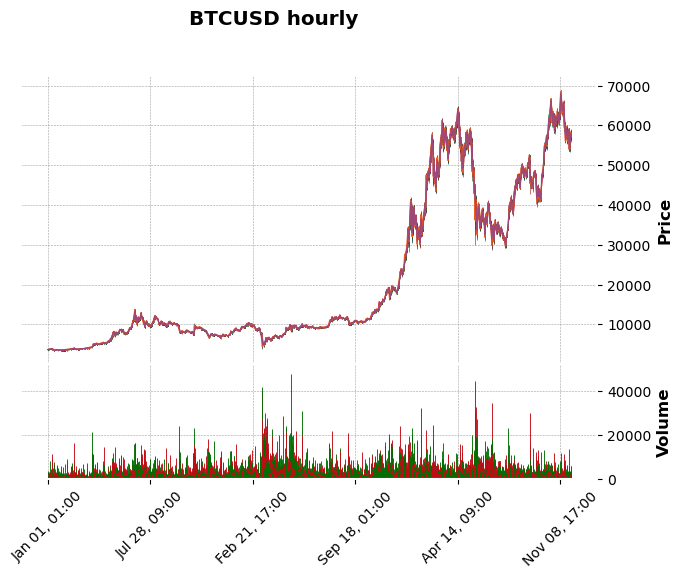

In [81]:
mpf.plot(Df_hourly_merge.reset_index().set_index('time'),
        type ='candle', style='charles', volume = True,
        title='BTCUSD hourly ',
        mav=(3,5, 12, 26)) #Moving averages 10, 20, and 30 days

Cleaning the visualization and added the 3 hours moving average as reference

C:\Users\mario\anaconda3\lib\site-packages\mplfinance\_arg_validators.py:83: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


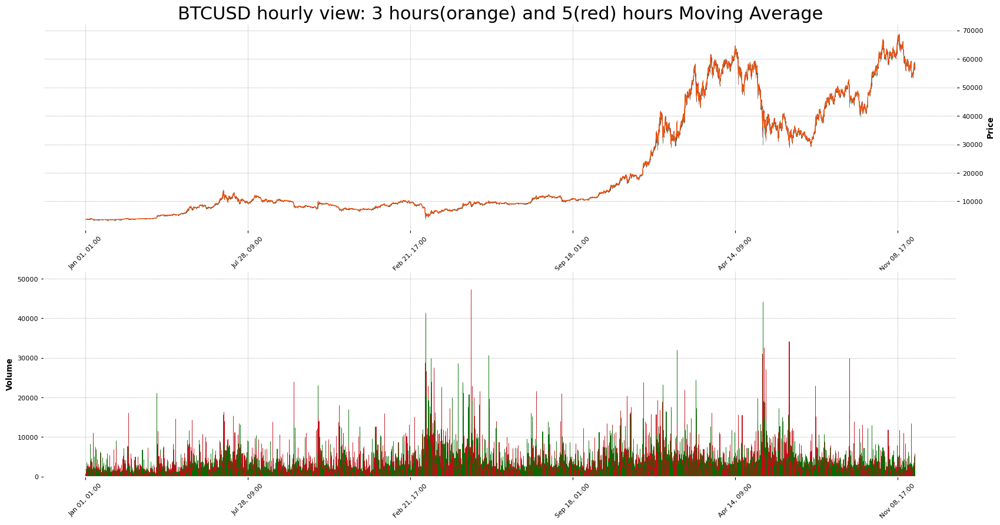

In [82]:
s = mpf.make_mpf_style(base_mpf_style='charles', rc={'font.size': 8}, )
fig = mpf.figure(figsize=(20, 10), style=s) # pass in the self defined style to the whole canvas
ax = fig.add_subplot(2,1,1) # main candle stick chart subplot, you can also pass in the self defined style here only for this subplot
ax.set_title('BTCUSD hourly view: 3 hours(orange) and 5(red) hours Moving Average', fontsize='22')
av = fig.add_subplot(2,1,2, sharex=ax)  # volume chart subplot
mpf.plot(Df_hourly_merge.reset_index().set_index('time'), type='candle', ax=ax, volume=av, mav=(3,5))#, 12, 26))

In [84]:
Df_hourly_merge.head() 

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages
time,,,,,,,,,,,,,,,,,,,,,
2019-01-01 01:00:00,4.789144,0.764092,32454.039666,2574.079332,60.407159,6.317328,0.111223,0.016004,1.0,4.386364,...,2.266700e+06,5086.0,320.644448,1.184519e+06,0,0.000000,0.000,both,0.000000,0.000000
2019-01-01 02:00:00,9.122449,1.253968,18279.126984,2235.809524,69.537416,11.630385,0.101236,0.180223,2.0,5.379310,...,3.302044e+06,6391.0,471.857118,1.740469e+06,0,0.000000,0.000,both,0.000000,0.000000
2019-01-01 03:00:00,1.325521,0.289062,5000.981771,2029.653646,31.230965,1.903646,0.100770,0.096907,3.0,4.323529,...,2.942422e+06,5709.0,459.948381,1.698857e+06,0,3693.333333,0.000,both,3690.884135,0.000000
2019-01-01 04:00:00,2.045699,0.303763,9224.862903,3983.379032,113.469624,2.653226,0.113049,0.042449,4.0,4.656250,...,4.872937e+06,7908.0,770.995533,2.852106e+06,0,3690.940000,0.000,both,3691.164518,0.000000
2019-01-01 05:00:00,0.869674,0.102757,14964.082707,2214.571429,79.086570,1.075188,0.081205,0.007195,5.0,4.379310,...,2.117705e+06,3886.0,326.520975,1.208150e+06,0,3691.946667,3693.168,both,3693.332998,3691.267024


We created a signal column “Signal” for the buy and sell by calculating times when 3 hours moving average “3MovingAverage” is greater or less than the 5 hour moving average “5MovingAverage.”

In [85]:
#Generating Signals
Df_hourly_merge['Signal'] = 0.0
Df_hourly_merge['Signal'] = np.where(Df_hourly_merge['3MovingAverage'] >Df_hourly_merge['5MovingAverage'], 1.0, 0.0)
Df_hourly_merge.head()

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,Number of Trades,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages,Signal
time,,,,,,,,,,,,,,,,,,,,,
2019-01-01 01:00:00,4.789144,0.764092,32454.039666,2574.079332,60.407159,6.317328,0.111223,0.016004,1.0,4.386364,...,5086.0,320.644448,1.184519e+06,0,0.000000,0.000,both,0.000000,0.000000,0.0
2019-01-01 02:00:00,9.122449,1.253968,18279.126984,2235.809524,69.537416,11.630385,0.101236,0.180223,2.0,5.379310,...,6391.0,471.857118,1.740469e+06,0,0.000000,0.000,both,0.000000,0.000000,0.0
2019-01-01 03:00:00,1.325521,0.289062,5000.981771,2029.653646,31.230965,1.903646,0.100770,0.096907,3.0,4.323529,...,5709.0,459.948381,1.698857e+06,0,3693.333333,0.000,both,3690.884135,0.000000,1.0
2019-01-01 04:00:00,2.045699,0.303763,9224.862903,3983.379032,113.469624,2.653226,0.113049,0.042449,4.0,4.656250,...,7908.0,770.995533,2.852106e+06,0,3690.940000,0.000,both,3691.164518,0.000000,1.0
2019-01-01 05:00:00,0.869674,0.102757,14964.082707,2214.571429,79.086570,1.075188,0.081205,0.007195,5.0,4.379310,...,3886.0,326.520975,1.208150e+06,0,3691.946667,3693.168,both,3693.332998,3691.267024,0.0


We then calculated the buy or sell position “position” based on the signal. Where a 0 to 1 change in the signal column would be a 1 or a buy signal in the position column. A 1 to 0 change in the signal column would be a -1 or a sell signal in the position column.

In [87]:
Df_hourly_merge['Position'] = Df_hourly_merge['Signal'].diff()
Df_hourly_merge.head(50)

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages,Signal,Position
time,,,,,,,,,,,,,,,,,,,,,
2019-01-01 01:00:00,4.789144,0.764092,32454.039666,2574.079332,60.407159,6.317328,0.111223,0.016004,1.0,4.386364,...,320.644448,1.184519e+06,0,0.000000,0.000,both,0.000000,0.000000,0.0,NaN
2019-01-01 02:00:00,9.122449,1.253968,18279.126984,2235.809524,69.537416,11.630385,0.101236,0.180223,2.0,5.379310,...,471.857118,1.740469e+06,0,0.000000,0.000,both,0.000000,0.000000,0.0,0.0
2019-01-01 03:00:00,1.325521,0.289062,5000.981771,2029.653646,31.230965,1.903646,0.100770,0.096907,3.0,4.323529,...,459.948381,1.698857e+06,0,3693.333333,0.000,both,3690.884135,0.000000,1.0,1.0
2019-01-01 04:00:00,2.045699,0.303763,9224.862903,3983.379032,113.469624,2.653226,0.113049,0.042449,4.0,4.656250,...,770.995533,2.852106e+06,0,3690.940000,0.000,both,3691.164518,0.000000,1.0,0.0
2019-01-01 05:00:00,0.869674,0.102757,14964.082707,2214.571429,79.086570,1.075188,0.081205,0.007195,5.0,4.379310,...,326.520975,1.208150e+06,0,3691.946667,3693.168,both,3693.332998,3691.267024,0.0,-1.0
2019-01-01 06:00:00,2.767494,0.722348,6250.961625,2266.474041,36.729121,4.212190,0.107748,0.120825,6.0,4.589744,...,384.509915,1.424667e+06,0,3695.260000,3693.094,both,3700.678086,3694.456393,1.0,1.0
2019-01-01 07:00:00,1.327068,0.409774,13276.398496,2027.586466,25.137586,2.146617,0.121263,0.016533,7.0,3.862069,...,424.739220,1.577037e+06,0,3698.736667,3695.868,both,3704.393469,3698.844194,1.0,0.0
2019-01-01 08:00:00,15.012376,5.165842,13015.762376,4628.938119,69.595114,25.344059,0.110685,0.069410,8.0,6.500000,...,468.473211,1.742964e+06,0,3705.776667,3700.634,both,3709.715798,3706.890513,1.0,0.0
2019-01-01 09:00:00,0.900256,0.245524,8757.613811,2839.948849,63.058795,1.391304,0.123641,0.027836,9.0,6.629630,...,510.885391,1.895818e+06,0,3711.363333,3705.348,both,3712.019460,3708.074395,1.0,0.0


We then plotted the hourly buy and sell signal using the 3 hours and 5 hours moving averages from 10 to 13 September. 

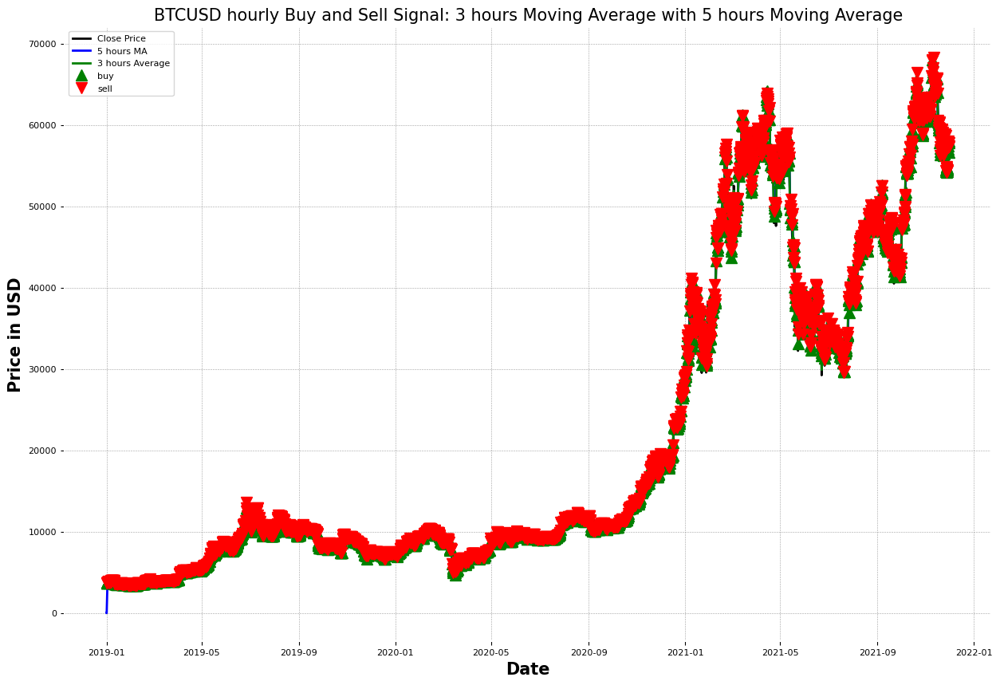

In [89]:
plt.figure(figsize = (15,10))
# plot close price, short-term and long-term moving averages 

plt.plot(Df_hourly_merge.index[2:],Df_hourly_merge['Close'][2:],color = 'k', label= 'Close Price')
plt.plot(Df_hourly_merge.index[2:],Df_hourly_merge['5MovingAverage'][2:],color = 'b',label = '5 hours MA') 
plt.plot(Df_hourly_merge.index[2:],Df_hourly_merge['3MovingAverage'][2:], color = 'g', label = '3 hours Average')

# plot ‘buy’ signals
plt.plot(Df_hourly_merge[Df_hourly_merge['Position'] == 1.0].index, 
         Df_hourly_merge['3MovingAverage'][Df_hourly_merge['Position'] == 1.0], 
         '^', markersize = 10, color = 'g', label = 'buy')

# plot ‘sell’ signals
plt.plot(Df_hourly_merge[Df_hourly_merge['Position'] == -1.0].index, 
         Df_hourly_merge['3MovingAverage'][Df_hourly_merge['Position'] == -1.0], 
         'v', markersize = 10, color = 'r', label = 'sell')

# plt.annotate('testing', xy=(('2021-09-11 18'),45000) , xytext = ('2021-09-11 18',45000) )
plt.ylabel('Price in USD', fontsize = 15 )
plt.xlabel('Date', fontsize = 15 )
plt.title('BTCUSD hourly Buy and Sell Signal: 3 hours Moving Average with 5 hours Moving Average', fontsize = 15)
#plt.xticks(ticks = Df_hourly_merge.index, fontsize = 20)
# plt.xticks(Df_hourly_merge.index)
plt.legend()
plt.grid(True)
plt.show()

We repeated the process and created a signal column “Signal35JMJ” for the buy and sell by calculating times when 3 hours JMJ moving ”JMJ_3HMoving_averages”  is greater or less than the 5 hour JMJ moving average “JMJ_5HMoving_averages.

In [91]:
#Generating Signals
Df_hourly_merge['Signal35JMJ'] = 0.0
Df_hourly_merge['Signal35JMJ'] = np.where(Df_hourly_merge['JMJ_3HMoving_averages'] >Df_hourly_merge['JMJ_5HMoving_averages'], 1.0, 0.0)
Df_hourly_merge.head()

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages,Signal,Position,Signal35JMJ
time,,,,,,,,,,,,,,,,,,,,,
2019-01-01 01:00:00,4.789144,0.764092,32454.039666,2574.079332,60.407159,6.317328,0.111223,0.016004,1.0,4.386364,...,1.184519e+06,0,0.000000,0.000,both,0.000000,0.000000,0.0,NaN,0.0
2019-01-01 02:00:00,9.122449,1.253968,18279.126984,2235.809524,69.537416,11.630385,0.101236,0.180223,2.0,5.379310,...,1.740469e+06,0,0.000000,0.000,both,0.000000,0.000000,0.0,0.0,0.0
2019-01-01 03:00:00,1.325521,0.289062,5000.981771,2029.653646,31.230965,1.903646,0.100770,0.096907,3.0,4.323529,...,1.698857e+06,0,3693.333333,0.000,both,3690.884135,0.000000,1.0,1.0,1.0
2019-01-01 04:00:00,2.045699,0.303763,9224.862903,3983.379032,113.469624,2.653226,0.113049,0.042449,4.0,4.656250,...,2.852106e+06,0,3690.940000,0.000,both,3691.164518,0.000000,1.0,0.0,1.0
2019-01-01 05:00:00,0.869674,0.102757,14964.082707,2214.571429,79.086570,1.075188,0.081205,0.007195,5.0,4.379310,...,1.208150e+06,0,3691.946667,3693.168,both,3693.332998,3691.267024,0.0,-1.0,1.0


We then calculated the buy or sell position “position35JMJ” based on the signal. Where a 0 to 1 change in the signal column would be a 1 or a buy signal in the position column. A 1 to 0 change in the signal column would be a -1 or a sell signal in the position column.

In [93]:
Df_hourly_merge['Position35JMJ'] = Df_hourly_merge['Signal35JMJ'].diff()
Df_hourly_merge.head(50) ####KEY

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages,Signal,Position,Signal35JMJ,Position35JMJ
time,,,,,,,,,,,,,,,,,,,,,
2019-01-01 01:00:00,4.789144,0.764092,32454.039666,2574.079332,60.407159,6.317328,0.111223,0.016004,1.0,4.386364,...,0,0.000000,0.000,both,0.000000,0.000000,0.0,NaN,0.0,NaN
2019-01-01 02:00:00,9.122449,1.253968,18279.126984,2235.809524,69.537416,11.630385,0.101236,0.180223,2.0,5.379310,...,0,0.000000,0.000,both,0.000000,0.000000,0.0,0.0,0.0,0.0
2019-01-01 03:00:00,1.325521,0.289062,5000.981771,2029.653646,31.230965,1.903646,0.100770,0.096907,3.0,4.323529,...,0,3693.333333,0.000,both,3690.884135,0.000000,1.0,1.0,1.0,1.0
2019-01-01 04:00:00,2.045699,0.303763,9224.862903,3983.379032,113.469624,2.653226,0.113049,0.042449,4.0,4.656250,...,0,3690.940000,0.000,both,3691.164518,0.000000,1.0,0.0,1.0,0.0
2019-01-01 05:00:00,0.869674,0.102757,14964.082707,2214.571429,79.086570,1.075188,0.081205,0.007195,5.0,4.379310,...,0,3691.946667,3693.168,both,3693.332998,3691.267024,0.0,-1.0,1.0,0.0
2019-01-01 06:00:00,2.767494,0.722348,6250.961625,2266.474041,36.729121,4.212190,0.107748,0.120825,6.0,4.589744,...,0,3695.260000,3693.094,both,3700.678086,3694.456393,1.0,1.0,1.0,0.0
2019-01-01 07:00:00,1.327068,0.409774,13276.398496,2027.586466,25.137586,2.146617,0.121263,0.016533,7.0,3.862069,...,0,3698.736667,3695.868,both,3704.393469,3698.844194,1.0,0.0,1.0,0.0
2019-01-01 08:00:00,15.012376,5.165842,13015.762376,4628.938119,69.595114,25.344059,0.110685,0.069410,8.0,6.500000,...,0,3705.776667,3700.634,both,3709.715798,3706.890513,1.0,0.0,1.0,0.0
2019-01-01 09:00:00,0.900256,0.245524,8757.613811,2839.948849,63.058795,1.391304,0.123641,0.027836,9.0,6.629630,...,0,3711.363333,3705.348,both,3712.019460,3708.074395,1.0,0.0,1.0,0.0


In [95]:
Df_hourly_merge.shape

(25536, 31)

In [96]:
Df_hourly_merge.columns

Index(['favorites', 'retweets', 'number_of_followers', 'following',
       'followers_following_ratio', '2x_retweets_+_favorites', 'polarity',
       'W1 Score', 'hour', 'Bull_ratio', 'W Score With Bull Ratio',
       'Open Time', 'Open', 'High', 'Low', 'Close', 'Volume',
       'Quote Asset Volume', 'Number of Trades', 'TB Base Volume',
       'TB Quote Volume', 'Ignore', '3MovingAverage', '5MovingAverage',
       '_merge', 'JMJ_3HMoving_averages', 'JMJ_5HMoving_averages', 'Signal',
       'Position', 'Signal35JMJ', 'Position35JMJ'],
      dtype='object')

We then plotted the hourly buy and sell signal using the 3 hours and 5 hours JMJ moving averages from 10 to 13 September.

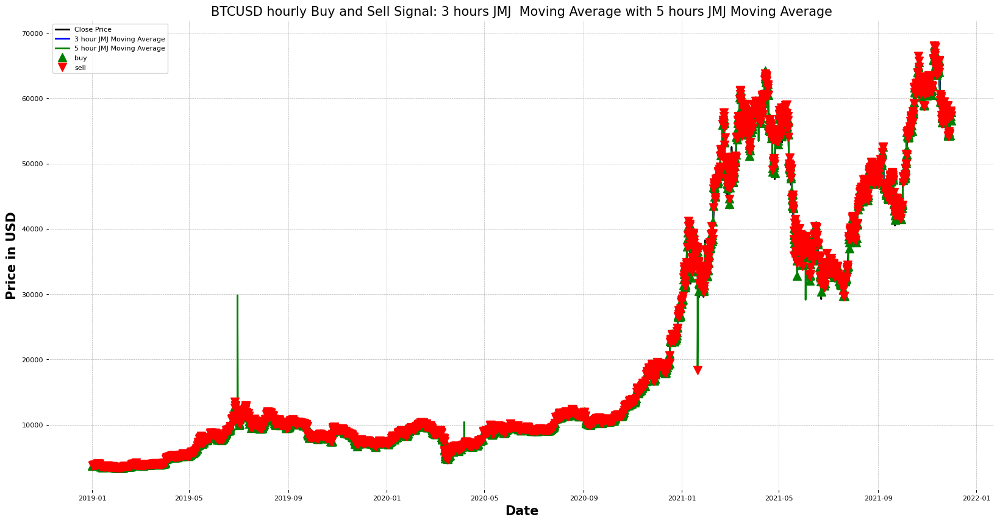

In [97]:
plt.figure(figsize = (20,10))
# plot close price, short-term and long-term moving averages 

plt.plot(Df_hourly_merge.index[4:],Df_hourly_merge['Close'][4:],color = 'k', label= 'Close Price')
plt.plot(Df_hourly_merge.index[4:],Df_hourly_merge['JMJ_5HMoving_averages'][4:],color = 'b',label = '3 hour JMJ Moving Average') 
plt.plot(Df_hourly_merge.index[4:],Df_hourly_merge['JMJ_3HMoving_averages'][4:], color = 'g', label = '5 hour JMJ Moving Average')

# plot ‘buy’ signals
plt.plot(Df_hourly_merge[Df_hourly_merge['Position35JMJ'] == 1.0].index, 
         Df_hourly_merge['JMJ_3HMoving_averages'][Df_hourly_merge['Position35JMJ'] == 1.0], 
         '^', markersize = 10, color = 'g', label = 'buy')

# plot ‘sell’ signals
plt.plot(Df_hourly_merge[Df_hourly_merge['Position35JMJ'] == -1.0].index, 
         Df_hourly_merge['JMJ_3HMoving_averages'][Df_hourly_merge['Position35JMJ'] == -1.0], 
         'v', markersize = 10, color = 'r', label = 'sell')

# plt.annotate('testing', xy=(('2021-09-11 18'),45000) , xytext = ('2021-09-11 18',45000) )
plt.ylabel('Price in USD', fontsize = 15 )
plt.xlabel('Date', fontsize = 15 )
plt.title('BTCUSD hourly Buy and Sell Signal: 3 hours JMJ  Moving Average with 5 hours JMJ Moving Average', fontsize = 15)
#plt.xticks(ticks = Df_hourly_merge.index, fontsize = 20)
# plt.xticks(Df_hourly_merge.index)
plt.legend()
plt.grid(True)
plt.show()

##  Merged Binance and Twitter Training Dataframe

In [99]:
Df_hourly_merge #mean

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages,Signal,Position,Signal35JMJ,Position35JMJ
time,,,,,,,,,,,,,,,,,,,,,
2019-01-01 01:00:00,4.789144,0.764092,32454.039666,2574.079332,60.407159,6.317328,0.111223,0.016004,1.0,4.386364,...,0,0.000000,0.000,both,0.000000,0.000000,0.0,NaN,0.0,NaN
2019-01-01 02:00:00,9.122449,1.253968,18279.126984,2235.809524,69.537416,11.630385,0.101236,0.180223,2.0,5.379310,...,0,0.000000,0.000,both,0.000000,0.000000,0.0,0.0,0.0,0.0
2019-01-01 03:00:00,1.325521,0.289062,5000.981771,2029.653646,31.230965,1.903646,0.100770,0.096907,3.0,4.323529,...,0,3693.333333,0.000,both,3690.884135,0.000000,1.0,1.0,1.0,1.0
2019-01-01 04:00:00,2.045699,0.303763,9224.862903,3983.379032,113.469624,2.653226,0.113049,0.042449,4.0,4.656250,...,0,3690.940000,0.000,both,3691.164518,0.000000,1.0,0.0,1.0,0.0
2019-01-01 05:00:00,0.869674,0.102757,14964.082707,2214.571429,79.086570,1.075188,0.081205,0.007195,5.0,4.379310,...,0,3691.946667,3693.168,both,3693.332998,3691.267024,0.0,-1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30 20:00:00,3.011905,0.392857,14180.595238,1765.121429,31.755382,3.797619,0.095683,0.135134,20.0,4.277778,...,0,57773.616667,57467.414,both,57803.065862,57437.781614,1.0,1.0,1.0,0.0
2021-11-30 21:00:00,14.400000,2.407143,16161.992857,2084.061905,182.260151,19.214286,0.082271,0.107210,21.0,3.648649,...,0,57783.440000,57499.728,both,57347.551319,57598.443940,1.0,0.0,0.0,-1.0
2021-11-30 22:00:00,21.570806,3.270153,11254.296296,1814.954248,428.484448,28.111111,0.070485,0.165014,22.0,1.887324,...,0,57376.063333,57563.810,both,57275.756200,57587.015027,0.0,-1.0,0.0,0.0


In [104]:
Df_hourly_merge.to_csv('assets/PCHourly2019202.csv')

### Adding Actual Label:

In [105]:
PredictDF = Df_hourly_merge.copy()

In [106]:
# PredictDF= pd.read_csv('assets/PCHourlyMilestoneIData.csv')
prediction = (PredictDF.shift(-1)['Close'] >= PredictDF['Close'])
prediction = prediction.iloc[:-1]
PredictDF['Actual_Label'] = prediction.astype(int)
# PredictDF= PredictDF.dropna()
PredictDF

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages,Signal,Position,Signal35JMJ,Position35JMJ,Actual_Label
time,,,,,,,,,,,,,,,,,,,,,
2019-01-01 01:00:00,4.789144,0.764092,32454.039666,2574.079332,60.407159,6.317328,0.111223,0.016004,1.0,4.386364,...,0.000000,0.000,both,0.000000,0.000000,0.0,NaN,0.0,NaN,1.0
2019-01-01 02:00:00,9.122449,1.253968,18279.126984,2235.809524,69.537416,11.630385,0.101236,0.180223,2.0,5.379310,...,0.000000,0.000,both,0.000000,0.000000,0.0,0.0,0.0,0.0,1.0
2019-01-01 03:00:00,1.325521,0.289062,5000.981771,2029.653646,31.230965,1.903646,0.100770,0.096907,3.0,4.323529,...,3693.333333,0.000,both,3690.884135,0.000000,1.0,1.0,1.0,1.0,0.0
2019-01-01 04:00:00,2.045699,0.303763,9224.862903,3983.379032,113.469624,2.653226,0.113049,0.042449,4.0,4.656250,...,3690.940000,0.000,both,3691.164518,0.000000,1.0,0.0,1.0,0.0,1.0
2019-01-01 05:00:00,0.869674,0.102757,14964.082707,2214.571429,79.086570,1.075188,0.081205,0.007195,5.0,4.379310,...,3691.946667,3693.168,both,3693.332998,3691.267024,0.0,-1.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30 20:00:00,3.011905,0.392857,14180.595238,1765.121429,31.755382,3.797619,0.095683,0.135134,20.0,4.277778,...,57773.616667,57467.414,both,57803.065862,57437.781614,1.0,1.0,1.0,0.0,0.0
2021-11-30 21:00:00,14.400000,2.407143,16161.992857,2084.061905,182.260151,19.214286,0.082271,0.107210,21.0,3.648649,...,57783.440000,57499.728,both,57347.551319,57598.443940,1.0,0.0,0.0,-1.0,1.0
2021-11-30 22:00:00,21.570806,3.270153,11254.296296,1814.954248,428.484448,28.111111,0.070485,0.165014,22.0,1.887324,...,57376.063333,57563.810,both,57275.756200,57587.015027,0.0,-1.0,0.0,0.0,0.0


In [123]:
PredictDF.to_csv('assets/PCHourly2019202_ActualLabel.csv')

# Repeating point 3,4,5 for for Test Data

In [19]:
import os
print(os.getcwd())

G:\My Drive\Education\MAD\Winter 2020 program\31. CAPSTONE\Final Submission\test_extracts


In [126]:
os.chdir("G:\\My Drive\\Education\\MAD\\Winter 2020 program\\31. CAPSTONE\\Final Submission")

In [14]:
import glob
import os

root_location = os.getcwd()
os.chdir(r'{}\test_extracts'.format(root_location))
# files = os.path.join("*.csv")

files = glob.glob('*.csv')

for f in files:
    print(f)


2022hourlyPC3.csv
2022hourlyPC1.csv
2022hourlyPC6.csv
2022hourlyPC8.csv
2022hourlyPC7.csv
2022hourlyPC5.csv
2022hourlyPC10.csv
2022hourlyPC4.csv
2022hourlyPC2.csv
2022hourlyPC9.csv


In [15]:
df170_test = pd.concat(map(pd.read_csv, files))
df170_test

,Unnamed: 0,user,tweets,time,favorites,retweets,number_of_followers,following
0,0,bascule,"Wow, someone finally made a Bitcoin mining ASI...",2022-03-01 01:59:58+00:00,7,0,18782,8438
1,1,cryptoAf20,Bitcoin Donations Pour in to Help Ukrainian Mi...,2022-03-01 01:59:49+00:00,1,0,58,319
2,2,Zupra_999,@RumboAl2021PE @AlertaNews24 Llevan como 12 añ...,2022-03-01 01:59:36+00:00,3,0,17,29
3,3,thenftglobenft,Bitcoin climbs to $41K and flippens the Russia...,2022-03-01 01:59:31+00:00,0,0,47,4
4,4,RRunner144,I've been curious if the conflict would pull h...,2022-03-01 01:59:17+00:00,2,0,4477,1132
...,...,...,...,...,...,...,...,...
314532,314532,FerrisBSessions,"@MDXcrypto Sure, once the $1,000,000 is banked...",2022-09-30 22:37:49+00:00,2,0,937,1183
314533,314533,Cryptoyoshi4,#bitcoin 🔥 https://t.co/8i1vHXCyUz,2022-09-30 22:37:28+00:00,0,0,82,405
314534,314534,BNB_Tracker,#BinanceCoin price update: $BNB\n\n#BNB $280.8...,2022-09-30 22:37:11+00:00,0,1,238,5
314535,314535,cryptogold901,@A445iytryhc_7 @Bitcoin_K_S_A مبروك لك,2022-09-30 22:36:47+00:00,1,0,34,232


In [16]:
len(df170_test)

3187219

In [17]:
df170_test.shape

(3187219, 8)

In [22]:
df170_test['followers_following_ratio'] = df170_test['number_of_followers'] / df170_test['following']
df170_test['2x_retweets_+_favorites'] = 2 * df170_test['retweets'] + df170_test['favorites']
df170_test['polarity'] = df170_test['tweets'].apply(lambda Text: pd.Series(TextBlob(Text).sentiment.polarity))
df170_test['sentiment'] = df170_test['polarity'].apply(getSentiment)
np.seterr(divide = 'ignore') 
df170_test['W1 Score'] = (np.log(df170_test['followers_following_ratio'])+1)* np.log(df170_test['2x_retweets_+_favorites'])*(df170_test['polarity'])
df170_test = df170_test.fillna(0)
df170_test.replace([np.inf, -np.inf, -0], 0, inplace=True)

#Convert date into hourly
df170_test['time'] = pd.to_datetime(df170_test['time'])
df170_test['hour'] = df170_test['time'].dt.hour
df170_test['day'] = pd.to_datetime(df170_test['time'].dt.date)
df170_test['time'] = df170_test['day'] + pd.to_timedelta(df170_test['hour'], unit='h')


In [23]:
df170_test

,Unnamed: 0,user,tweets,time,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,sentiment,W1 Score,hour,day
0,0,bascule,"Wow, someone finally made a Bitcoin mining ASI...",2022-03-01 01:00:00,7,0,18782,8438,2.225883,7,0.000000,Neutral,0.000000,1,2022-03-01
1,1,cryptoAf20,Bitcoin Donations Pour in to Help Ukrainian Mi...,2022-03-01 01:00:00,1,0,58,319,0.181818,1,-0.100000,Negative,0.000000,1,2022-03-01
2,2,Zupra_999,@RumboAl2021PE @AlertaNews24 Llevan como 12 añ...,2022-03-01 01:00:00,3,0,17,29,0.586207,3,0.000000,Neutral,0.000000,1,2022-03-01
3,3,thenftglobenft,Bitcoin climbs to $41K and flippens the Russia...,2022-03-01 01:00:00,0,0,47,4,11.750000,0,0.000000,Neutral,0.000000,1,2022-03-01
4,4,RRunner144,I've been curious if the conflict would pull h...,2022-03-01 01:00:00,2,0,4477,1132,3.954947,2,-0.066667,Negative,-0.109747,1,2022-03-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314532,314532,FerrisBSessions,"@MDXcrypto Sure, once the $1,000,000 is banked...",2022-09-30 22:00:00,2,0,937,1183,0.792054,2,-0.042088,Negative,-0.022372,22,2022-09-30
314533,314533,Cryptoyoshi4,#bitcoin 🔥 https://t.co/8i1vHXCyUz,2022-09-30 22:00:00,0,0,82,405,0.202469,0,0.000000,Neutral,0.000000,22,2022-09-30
314534,314534,BNB_Tracker,#BinanceCoin price update: $BNB\n\n#BNB $280.8...,2022-09-30 22:00:00,0,1,238,5,47.600000,2,0.000000,Neutral,0.000000,22,2022-09-30
314535,314535,cryptogold901,@A445iytryhc_7 @Bitcoin_K_S_A مبروك لك,2022-09-30 22:00:00,1,0,34,232,0.146552,1,0.000000,Neutral,0.000000,22,2022-09-30


In [24]:
Bullratio_df = df170_test.groupby('time').sum()
Bullratio_df

,Unnamed: 0,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour
time,,,,,,,,,,
2022-01-01 01:00:00,139530,5315,727,18109211,4952167,209878.942431,6769,44.701095,28.396266,444
2022-01-01 02:00:00,290841,4231,582,7662843,923840,20950.663679,5395,24.066784,29.564468,874
2022-01-01 03:00:00,540647,1441,157,4411624,1132491,190121.391605,1755,38.736680,69.967978,1443
2022-01-01 04:00:00,619242,2381,134,6459073,952542,32340.877164,2649,32.205656,22.701252,1588
2022-01-01 05:00:00,978514,2774,257,6632420,1137732,115387.119134,3288,47.471600,88.946501,2375
...,...,...,...,...,...,...,...,...,...,...
2022-10-31 20:00:00,135694230,2869,877,4915625,425435,107159.061220,4623,32.325950,71.373440,8400
2022-10-31 21:00:00,135870630,2272,442,4775165,294281,65212.720508,3156,38.213354,99.795240,8820
2022-10-31 22:00:00,145134080,1776,304,15739394,418018,229118.733139,2384,47.088934,50.451376,9856


In [25]:
bull_ratio_list = []
Bullratio_df = Bullratio_df.reset_index()
for day in Bullratio_df['time']:
  #print(day)
  filtered_df = df170_test.loc[(df170_test['time'] == day)]
  bull_ratio_list.append(filtered_df['sentiment'].value_counts()[1]/filtered_df['sentiment'].value_counts()[2])
bull_ratio_list


[3.9767441860465116,
 2.5084745762711864,
 4.076923076923077,
 3.7777777777777777,
 3.5306122448979593,
 4.451612903225806,
 4.3478260869565215,
 3.282608695652174,
 4.611111111111111,
 3.4615384615384617,
 4.625,
 3.358974358974359,
 5.285714285714286,
 3.6511627906976742,
 3.883720930232558,
 4.655172413793103,
 3.682926829268293,
 3.382978723404255,
 3.0,
 2.74,
 2.413793103448276,
 2.9245283018867925,
 2.8088235294117645,
 2.7472527472527473,
 2.75,
 2.7142857142857144,
 3.056603773584906,
 3.489795918367347,
 4.214285714285714,
 3.769230769230769,
 7.368421052631579,
 3.0784313725490198,
 2.902439024390244,
 3.925,
 5.958333333333333,
 2.4186046511627906,
 2.7450980392156863,
 2.6818181818181817,
 2.7111111111111112,
 2.9555555555555557,
 2.8260869565217392,
 2.232142857142857,
 3.1923076923076925,
 2.4705882352941178,
 3.5833333333333335,
 2.5686274509803924,
 2.3580246913580245,
 3.0898876404494384,
 3.7555555555555555,
 2.5,
 2.6724137931034484,
 4.4,
 3.0555555555555554,
 4.10

In [26]:
Bullratio_df['Bull_Ratio'] = bull_ratio_list
Bullratio_df


,time,Unnamed: 0,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_Ratio
0,2022-01-01 01:00:00,139530,5315,727,18109211,4952167,209878.942431,6769,44.701095,28.396266,444,3.976744
1,2022-01-01 02:00:00,290841,4231,582,7662843,923840,20950.663679,5395,24.066784,29.564468,874,2.508475
2,2022-01-01 03:00:00,540647,1441,157,4411624,1132491,190121.391605,1755,38.736680,69.967978,1443,4.076923
3,2022-01-01 04:00:00,619242,2381,134,6459073,952542,32340.877164,2649,32.205656,22.701252,1588,3.777778
4,2022-01-01 05:00:00,978514,2774,257,6632420,1137732,115387.119134,3288,47.471600,88.946501,2375,3.530612
...,...,...,...,...,...,...,...,...,...,...,...,...
7291,2022-10-31 20:00:00,135694230,2869,877,4915625,425435,107159.061220,4623,32.325950,71.373440,8400,3.275000
7292,2022-10-31 21:00:00,135870630,2272,442,4775165,294281,65212.720508,3156,38.213354,99.795240,8820,2.888889
7293,2022-10-31 22:00:00,145134080,1776,304,15739394,418018,229118.733139,2384,47.088934,50.451376,9856,4.885714
7294,2022-10-31 23:00:00,142733860,1194,175,1591422,435719,34817.522343,1544,29.051342,41.046381,10120,3.177778


In [27]:
df170_test['Bull_ratio'] = df170_test['time'].map(Bullratio_df.reset_index().set_index('time')['Bull_Ratio'])
df170_test

,Unnamed: 0,user,tweets,time,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,sentiment,W1 Score,hour,day,Bull_ratio
0,0,bascule,"Wow, someone finally made a Bitcoin mining ASI...",2022-03-01 01:00:00,7,0,18782,8438,2.225883,7,0.000000,Neutral,0.000000,1,2022-03-01,2.765957
1,1,cryptoAf20,Bitcoin Donations Pour in to Help Ukrainian Mi...,2022-03-01 01:00:00,1,0,58,319,0.181818,1,-0.100000,Negative,0.000000,1,2022-03-01,2.765957
2,2,Zupra_999,@RumboAl2021PE @AlertaNews24 Llevan como 12 añ...,2022-03-01 01:00:00,3,0,17,29,0.586207,3,0.000000,Neutral,0.000000,1,2022-03-01,2.765957
3,3,thenftglobenft,Bitcoin climbs to $41K and flippens the Russia...,2022-03-01 01:00:00,0,0,47,4,11.750000,0,0.000000,Neutral,0.000000,1,2022-03-01,2.765957
4,4,RRunner144,I've been curious if the conflict would pull h...,2022-03-01 01:00:00,2,0,4477,1132,3.954947,2,-0.066667,Negative,-0.109747,1,2022-03-01,2.765957
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314532,314532,FerrisBSessions,"@MDXcrypto Sure, once the $1,000,000 is banked...",2022-09-30 22:00:00,2,0,937,1183,0.792054,2,-0.042088,Negative,-0.022372,22,2022-09-30,2.860465
314533,314533,Cryptoyoshi4,#bitcoin 🔥 https://t.co/8i1vHXCyUz,2022-09-30 22:00:00,0,0,82,405,0.202469,0,0.000000,Neutral,0.000000,22,2022-09-30,2.860465
314534,314534,BNB_Tracker,#BinanceCoin price update: $BNB\n\n#BNB $280.8...,2022-09-30 22:00:00,0,1,238,5,47.600000,2,0.000000,Neutral,0.000000,22,2022-09-30,2.860465
314535,314535,cryptogold901,@A445iytryhc_7 @Bitcoin_K_S_A مبروك لك,2022-09-30 22:00:00,1,0,34,232,0.146552,1,0.000000,Neutral,0.000000,22,2022-09-30,2.860465


In [28]:
df170_test['W Score With Bull Ratio'] = df170_test['W1 Score'] * df170_test['Bull_ratio']

In [29]:
df170_test

,Unnamed: 0,user,tweets,time,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,sentiment,W1 Score,hour,day,Bull_ratio,W Score With Bull Ratio
0,0,bascule,"Wow, someone finally made a Bitcoin mining ASI...",2022-03-01 01:00:00,7,0,18782,8438,2.225883,7,0.000000,Neutral,0.000000,1,2022-03-01,2.765957,0.000000
1,1,cryptoAf20,Bitcoin Donations Pour in to Help Ukrainian Mi...,2022-03-01 01:00:00,1,0,58,319,0.181818,1,-0.100000,Negative,0.000000,1,2022-03-01,2.765957,0.000000
2,2,Zupra_999,@RumboAl2021PE @AlertaNews24 Llevan como 12 añ...,2022-03-01 01:00:00,3,0,17,29,0.586207,3,0.000000,Neutral,0.000000,1,2022-03-01,2.765957,0.000000
3,3,thenftglobenft,Bitcoin climbs to $41K and flippens the Russia...,2022-03-01 01:00:00,0,0,47,4,11.750000,0,0.000000,Neutral,0.000000,1,2022-03-01,2.765957,0.000000
4,4,RRunner144,I've been curious if the conflict would pull h...,2022-03-01 01:00:00,2,0,4477,1132,3.954947,2,-0.066667,Negative,-0.109747,1,2022-03-01,2.765957,-0.303555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314532,314532,FerrisBSessions,"@MDXcrypto Sure, once the $1,000,000 is banked...",2022-09-30 22:00:00,2,0,937,1183,0.792054,2,-0.042088,Negative,-0.022372,22,2022-09-30,2.860465,-0.063994
314533,314533,Cryptoyoshi4,#bitcoin 🔥 https://t.co/8i1vHXCyUz,2022-09-30 22:00:00,0,0,82,405,0.202469,0,0.000000,Neutral,0.000000,22,2022-09-30,2.860465,0.000000
314534,314534,BNB_Tracker,#BinanceCoin price update: $BNB\n\n#BNB $280.8...,2022-09-30 22:00:00,0,1,238,5,47.600000,2,0.000000,Neutral,0.000000,22,2022-09-30,2.860465,0.000000
314535,314535,cryptogold901,@A445iytryhc_7 @Bitcoin_K_S_A مبروك لك,2022-09-30 22:00:00,1,0,34,232,0.146552,1,0.000000,Neutral,0.000000,22,2022-09-30,2.860465,0.000000


In [30]:
#probably best as I am only taking 400 samples an hour
Df_hourly_test = df170_test.groupby('time').mean()

In [31]:
Df_hourly_test

,Unnamed: 0,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,W Score With Bull Ratio
time,,,,,,,,,,,,
2022-01-01 01:00:00,314.256757,11.970721,1.637387,40786.511261,11153.529279,472.700321,15.245495,0.100678,0.063956,1.0,3.976744,0.254335
2022-01-01 02:00:00,665.540046,9.681922,1.331808,17535.109840,2114.050343,47.942022,12.345538,0.055073,0.067653,2.0,2.508475,0.169706
2022-01-01 03:00:00,1124.006237,2.995842,0.326403,9171.775468,2354.451143,395.262768,3.648649,0.080534,0.145464,3.0,4.076923,0.593044
2022-01-01 04:00:00,1559.803526,5.997481,0.337531,16269.705290,2399.350126,81.463167,6.672544,0.081123,0.057182,4.0,3.777778,0.216021
2022-01-01 05:00:00,2060.029474,5.840000,0.541053,13962.989474,2395.225263,242.920251,6.922105,0.099940,0.187256,5.0,3.530612,0.661128
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-31 20:00:00,323081.500000,6.830952,2.088095,11703.869048,1012.940476,255.140622,11.007143,0.076967,0.169937,20.0,3.275000,0.556543
2022-10-31 21:00:00,323501.500000,5.409524,1.052381,11369.440476,700.669048,155.268382,7.514286,0.090984,0.237608,21.0,2.888889,0.686422
2022-10-31 22:00:00,323960.000000,3.964286,0.678571,35132.575893,933.075893,511.425744,5.321429,0.105109,0.112615,22.0,4.885714,0.550203


In [32]:
#Merge Binance Fiancials to Twitter Data
Df_hourly_merge_test = pd.merge(Df_hourly_test, df_historical2_hourly, how ='left', left_index=True, right_index=True, indicator = True) 

In [33]:
Df_hourly_merge_test

,Unnamed: 0,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,...,Close,Volume,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 01:00:00,314.256757,11.970721,1.637387,40786.511261,11153.529279,472.700321,15.245495,0.100678,0.063956,1.0,...,46778.14,943.81539,4.412715e+07,31872,491.18067,2.296327e+07,0,46392.350000,46278.030,both
2022-01-01 02:00:00,665.540046,9.681922,1.331808,17535.109840,2114.050343,47.942022,12.345538,0.055073,0.067653,2.0,...,46811.77,485.16860,2.272067e+07,24364,206.35113,9.662607e+06,0,46550.400000,46457.810,both
2022-01-01 03:00:00,1124.006237,2.995842,0.326403,9171.775468,2354.451143,395.262768,3.648649,0.080534,0.145464,3.0,...,46813.20,562.88971,2.636326e+07,19882,248.28212,1.162938e+07,0,46748.680000,46553.392,both
2022-01-01 04:00:00,1559.803526,5.997481,0.337531,16269.705290,2399.350126,81.463167,6.672544,0.081123,0.057182,4.0,...,46711.05,861.88389,4.027204e+07,23357,397.53563,1.857540e+07,0,46801.036667,46655.234,both
2022-01-01 05:00:00,2060.029474,5.840000,0.541053,13962.989474,2395.225263,242.920251,6.922105,0.099940,0.187256,5.0,...,47192.55,1400.73642,6.618831e+07,41431,776.78632,3.669532e+07,0,46778.673333,46754.058,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-31 20:00:00,323081.500000,6.830952,2.088095,11703.869048,1012.940476,255.140622,11.007143,0.076967,0.169937,20.0,...,20401.49,7588.08696,1.547771e+08,173815,3808.44259,7.768457e+07,0,20393.086667,20390.532,both
2022-10-31 21:00:00,323501.500000,5.409524,1.052381,11369.440476,700.669048,155.268382,7.514286,0.090984,0.237608,21.0,...,20406.58,4043.39784,8.252233e+07,117665,2038.12129,4.159776e+07,0,20402.370000,20390.524,both
2022-10-31 22:00:00,323960.000000,3.964286,0.678571,35132.575893,933.075893,511.425744,5.321429,0.105109,0.112615,22.0,...,20479.48,11124.35235,2.274444e+08,228638,5646.24607,1.154464e+08,0,20393.263333,20397.466,both


In [34]:
len(Df_hourly_merge_test['_merge']=='both')

7296

In [35]:
len(Df_hourly_merge_test['_merge']=='left_only')

7296

In [36]:
len(Df_hourly_merge_test['_merge']=='right_only')

7296

In [37]:
#calculating Moving average
# Example 2: 
numbers = Df_hourly_merge_test['W Score With Bull Ratio']
n = 3
x = 0
JMJ_3Hmoving_averages = []

for i in range(len(numbers)):
    try:
        percentage = ((Df_hourly_merge_test['W Score With Bull Ratio'][x]) / (sum(Df_hourly_merge_test['W Score With Bull Ratio'][x-n+1:x+1])))*Df_hourly_merge_test['Close'][x] + ((Df_hourly_merge_test['W Score With Bull Ratio'][x-1]) / (sum(Df_hourly_merge_test['W Score With Bull Ratio'][x-n+1:x+1])))*Df_hourly_merge_test['Close'][x-1]+ ((Df_hourly_merge_test['W Score With Bull Ratio'][x-2]) / (sum(Df_hourly_merge_test['W Score With Bull Ratio'][x-n+1:x+1]))) *Df_hourly_merge_test['Close'][x-2]     
        JMJ_3Hmoving_averages.append(percentage)
        x = x + 1
      
    except ValueError:
        print(NaN)



In [38]:
JMJ_3Hmoving_averages
len(JMJ_3Hmoving_averages)

7296

In [44]:
#calculating Moving average
# Example 2: 
numbers = Df_hourly_merge_test['W Score With Bull Ratio']
n = 5
x = 0
JMJ_5Hmoving_averages = []

for i in range(len(numbers)):
  try:
      percentage = ((Df_hourly_merge_test['W Score With Bull Ratio'][x]) / (sum(Df_hourly_merge_test['W Score With Bull Ratio'][x-n+1:x+1])))*Df_hourly_merge_test['Close'][x] + ((Df_hourly_merge_test['W Score With Bull Ratio'][x-1]) / (sum(Df_hourly_merge_test['W Score With Bull Ratio'][x-n+1:x+1])))*Df_hourly_merge_test['Close'][x-1] + ((Df_hourly_merge_test['W Score With Bull Ratio'][x-2]) / (sum(Df_hourly_merge_test['W Score With Bull Ratio'][x-n+1:x+1]))) *Df_hourly_merge_test['Close'][x-2] + ((Df_hourly_merge_test['W Score With Bull Ratio'][x-3]) / (sum(Df_hourly_merge_test['W Score With Bull Ratio'][x-n+1:x+1]))) *Df_hourly_merge_test['Close'][x-3] + ((Df_hourly_merge_test['W Score With Bull Ratio'][x-4]) / (sum(Df_hourly_merge_test['W Score With Bull Ratio'][x-n+1:x+1]))) *Df_hourly_merge_test['Close'][x-4]
      JMJ_5Hmoving_averages.append(percentage)
      x = x + 1
      
  except ValueError:
      print(NaN)



In [45]:
JMJ_5Hmoving_averages
len(JMJ_5Hmoving_averages)

7296

In [46]:
Df_hourly_merge_test['JMJ_3HMoving_averages'] = JMJ_3Hmoving_averages
Df_hourly_merge_test['JMJ_5HMoving_averages'] = JMJ_5Hmoving_averages

In [47]:
Df_hourly_merge_test 

,Unnamed: 0,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,...,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 01:00:00,314.256757,11.970721,1.637387,40786.511261,11153.529279,472.700321,15.245495,0.100678,0.063956,1.0,...,4.412715e+07,31872,491.18067,2.296327e+07,0,46392.350000,46278.030,both,inf,inf
2022-01-01 02:00:00,665.540046,9.681922,1.331808,17535.109840,2114.050343,47.942022,12.345538,0.055073,0.067653,2.0,...,2.272067e+07,24364,206.35113,9.662607e+06,0,46550.400000,46457.810,both,inf,inf
2022-01-01 03:00:00,1124.006237,2.995842,0.326403,9171.775468,2354.451143,395.262768,3.648649,0.080534,0.145464,3.0,...,2.636326e+07,19882,248.28212,1.162938e+07,0,46748.680000,46553.392,both,4.680419e+04,inf
2022-01-01 04:00:00,1559.803526,5.997481,0.337531,16269.705290,2399.350126,81.463167,6.672544,0.081123,0.057182,4.0,...,4.027204e+07,23357,397.53563,1.857540e+07,0,46801.036667,46655.234,both,4.679041e+04,inf
2022-01-01 05:00:00,2060.029474,5.840000,0.541053,13962.989474,2395.225263,242.920251,6.922105,0.099940,0.187256,5.0,...,6.618831e+07,41431,776.78632,3.669532e+07,0,46778.673333,46754.058,both,4.696878e+04,4.692912e+04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-31 20:00:00,323081.500000,6.830952,2.088095,11703.869048,1012.940476,255.140622,11.007143,0.076967,0.169937,20.0,...,1.547771e+08,173815,3808.44259,7.768457e+07,0,20393.086667,20390.532,both,2.041021e+04,2.039463e+04
2022-10-31 21:00:00,323501.500000,5.409524,1.052381,11369.440476,700.669048,155.268382,7.514286,0.090984,0.237608,21.0,...,8.252233e+07,117665,2038.12129,4.159776e+07,0,20402.370000,20390.524,both,2.039287e+04,2.039976e+04
2022-10-31 22:00:00,323960.000000,3.964286,0.678571,35132.575893,933.075893,511.425744,5.321429,0.105109,0.112615,22.0,...,2.274444e+08,228638,5646.24607,1.154464e+08,0,20393.263333,20397.466,both,2.042737e+04,2.041968e+04


In [48]:
Df_hourly_merge_test.replace([np.inf, -np.inf, -0], 0, inplace=True)
Df_hourly_merge_test.drop('Unnamed: 0', inplace=True, axis=1)
Df_hourly_merge_test

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 01:00:00,11.970721,1.637387,40786.511261,11153.529279,472.700321,15.245495,0.100678,0.063956,1.0,3.976744,...,4.412715e+07,31872,491.18067,2.296327e+07,0,46392.350000,46278.030,both,0.000000,0.000000
2022-01-01 02:00:00,9.681922,1.331808,17535.109840,2114.050343,47.942022,12.345538,0.055073,0.067653,2.0,2.508475,...,2.272067e+07,24364,206.35113,9.662607e+06,0,46550.400000,46457.810,both,0.000000,0.000000
2022-01-01 03:00:00,2.995842,0.326403,9171.775468,2354.451143,395.262768,3.648649,0.080534,0.145464,3.0,4.076923,...,2.636326e+07,19882,248.28212,1.162938e+07,0,46748.680000,46553.392,both,46804.194204,0.000000
2022-01-01 04:00:00,5.997481,0.337531,16269.705290,2399.350126,81.463167,6.672544,0.081123,0.057182,4.0,3.777778,...,4.027204e+07,23357,397.53563,1.857540e+07,0,46801.036667,46655.234,both,46790.406916,0.000000
2022-01-01 05:00:00,5.840000,0.541053,13962.989474,2395.225263,242.920251,6.922105,0.099940,0.187256,5.0,3.530612,...,6.618831e+07,41431,776.78632,3.669532e+07,0,46778.673333,46754.058,both,46968.779802,46929.116305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-31 20:00:00,6.830952,2.088095,11703.869048,1012.940476,255.140622,11.007143,0.076967,0.169937,20.0,3.275000,...,1.547771e+08,173815,3808.44259,7.768457e+07,0,20393.086667,20390.532,both,20410.206961,20394.632170
2022-10-31 21:00:00,5.409524,1.052381,11369.440476,700.669048,155.268382,7.514286,0.090984,0.237608,21.0,2.888889,...,8.252233e+07,117665,2038.12129,4.159776e+07,0,20402.370000,20390.524,both,20392.872746,20399.763973
2022-10-31 22:00:00,3.964286,0.678571,35132.575893,933.075893,511.425744,5.321429,0.105109,0.112615,22.0,4.885714,...,2.274444e+08,228638,5646.24607,1.154464e+08,0,20393.263333,20397.466,both,20427.368347,20419.680820


C:\Users\mario\anaconda3\lib\site-packages\mplfinance\_arg_validators.py:83: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


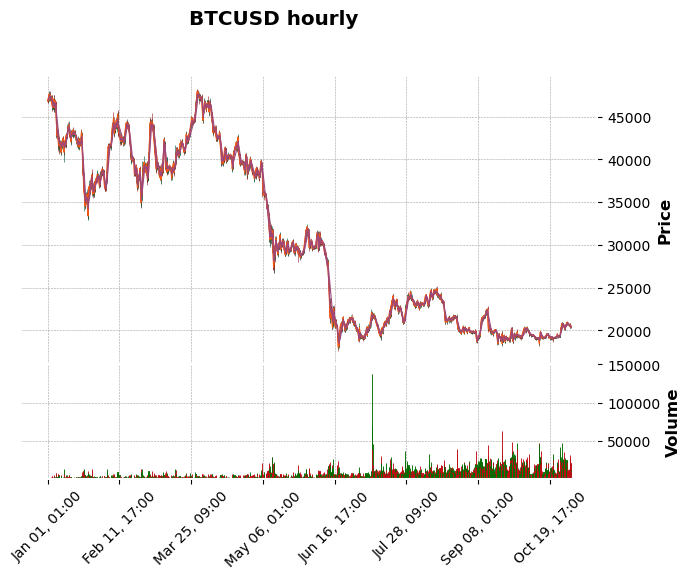

In [49]:
mpf.plot(Df_hourly_merge_test.reset_index().set_index('time'),
        type ='candle', style='charles', volume = True,
        title='BTCUSD hourly ',
        mav=(3,5, 12, 26)) #Moving averages 10, 20, and 30 days

C:\Users\mario\anaconda3\lib\site-packages\mplfinance\_arg_validators.py:83: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


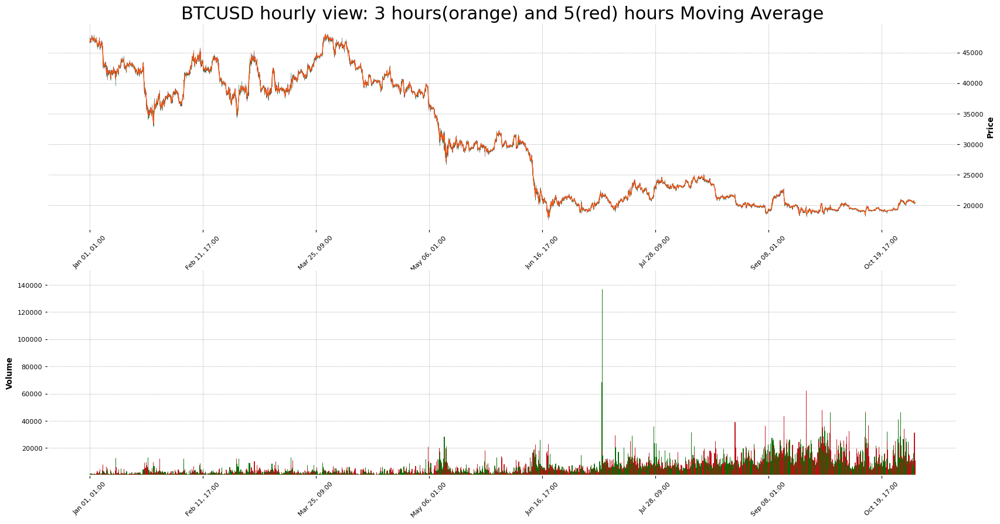

In [50]:
s = mpf.make_mpf_style(base_mpf_style='charles', rc={'font.size': 8}, )
fig = mpf.figure(figsize=(20, 10), style=s) # pass in the self defined style to the whole canvas
ax = fig.add_subplot(2,1,1) # main candle stick chart subplot, you can also pass in the self defined style here only for this subplot
ax.set_title('BTCUSD hourly view: 3 hours(orange) and 5(red) hours Moving Average', fontsize='22')
av = fig.add_subplot(2,1,2, sharex=ax)  # volume chart subplot
mpf.plot(Df_hourly_merge_test.reset_index().set_index('time'), type='candle', ax=ax, volume=av, mav=(3,5))#, 12, 26))

In [51]:
Df_hourly_merge_test.head() 

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 01:00:00,11.970721,1.637387,40786.511261,11153.529279,472.700321,15.245495,0.100678,0.063956,1.0,3.976744,...,4.412715e+07,31872,491.18067,2.296327e+07,0,46392.350000,46278.030,both,0.000000,0.000000
2022-01-01 02:00:00,9.681922,1.331808,17535.109840,2114.050343,47.942022,12.345538,0.055073,0.067653,2.0,2.508475,...,2.272067e+07,24364,206.35113,9.662607e+06,0,46550.400000,46457.810,both,0.000000,0.000000
2022-01-01 03:00:00,2.995842,0.326403,9171.775468,2354.451143,395.262768,3.648649,0.080534,0.145464,3.0,4.076923,...,2.636326e+07,19882,248.28212,1.162938e+07,0,46748.680000,46553.392,both,46804.194204,0.000000
2022-01-01 04:00:00,5.997481,0.337531,16269.705290,2399.350126,81.463167,6.672544,0.081123,0.057182,4.0,3.777778,...,4.027204e+07,23357,397.53563,1.857540e+07,0,46801.036667,46655.234,both,46790.406916,0.000000
2022-01-01 05:00:00,5.840000,0.541053,13962.989474,2395.225263,242.920251,6.922105,0.099940,0.187256,5.0,3.530612,...,6.618831e+07,41431,776.78632,3.669532e+07,0,46778.673333,46754.058,both,46968.779802,46929.116305


In [54]:
#Generating Signals
Df_hourly_merge_test['Signal'] = 0.0
Df_hourly_merge_test['Signal'] = np.where(Df_hourly_merge_test['3MovingAverage'] >Df_hourly_merge_test['5MovingAverage'], 1.0, 0.0)
Df_hourly_merge_test.head()

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,Number of Trades,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages,Signal
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 01:00:00,11.970721,1.637387,40786.511261,11153.529279,472.700321,15.245495,0.100678,0.063956,1.0,3.976744,...,31872,491.18067,2.296327e+07,0,46392.350000,46278.030,both,0.000000,0.000000,1.0
2022-01-01 02:00:00,9.681922,1.331808,17535.109840,2114.050343,47.942022,12.345538,0.055073,0.067653,2.0,2.508475,...,24364,206.35113,9.662607e+06,0,46550.400000,46457.810,both,0.000000,0.000000,1.0
2022-01-01 03:00:00,2.995842,0.326403,9171.775468,2354.451143,395.262768,3.648649,0.080534,0.145464,3.0,4.076923,...,19882,248.28212,1.162938e+07,0,46748.680000,46553.392,both,46804.194204,0.000000,1.0
2022-01-01 04:00:00,5.997481,0.337531,16269.705290,2399.350126,81.463167,6.672544,0.081123,0.057182,4.0,3.777778,...,23357,397.53563,1.857540e+07,0,46801.036667,46655.234,both,46790.406916,0.000000,1.0
2022-01-01 05:00:00,5.840000,0.541053,13962.989474,2395.225263,242.920251,6.922105,0.099940,0.187256,5.0,3.530612,...,41431,776.78632,3.669532e+07,0,46778.673333,46754.058,both,46968.779802,46929.116305,1.0


In [55]:
Df_hourly_merge_test['Position'] = Df_hourly_merge_test['Signal'].diff()
Df_hourly_merge_test.head(50)

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,TB Base Volume,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages,Signal,Position
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 01:00:00,11.970721,1.637387,40786.511261,11153.529279,472.700321,15.245495,0.100678,0.063956,1.0,3.976744,...,491.18067,2.296327e+07,0,46392.350000,46278.030,both,0.000000,0.000000,1.0,NaN
2022-01-01 02:00:00,9.681922,1.331808,17535.109840,2114.050343,47.942022,12.345538,0.055073,0.067653,2.0,2.508475,...,206.35113,9.662607e+06,0,46550.400000,46457.810,both,0.000000,0.000000,1.0,0.0
2022-01-01 03:00:00,2.995842,0.326403,9171.775468,2354.451143,395.262768,3.648649,0.080534,0.145464,3.0,4.076923,...,248.28212,1.162938e+07,0,46748.680000,46553.392,both,46804.194204,0.000000,1.0,0.0
2022-01-01 04:00:00,5.997481,0.337531,16269.705290,2399.350126,81.463167,6.672544,0.081123,0.057182,4.0,3.777778,...,397.53563,1.857540e+07,0,46801.036667,46655.234,both,46790.406916,0.000000,1.0,0.0
2022-01-01 05:00:00,5.840000,0.541053,13962.989474,2395.225263,242.920251,6.922105,0.099940,0.187256,5.0,3.530612,...,776.78632,3.669532e+07,0,46778.673333,46754.058,both,46968.779802,46929.116305,1.0,0.0
2022-01-01 06:00:00,13.801008,2.118388,20847.027708,2732.649874,551.247722,18.037783,0.095345,0.195319,6.0,4.451613,...,299.44097,1.411607e+07,0,46905.600000,46861.342,both,47027.000927,46961.917494,1.0,0.0
2022-01-01 07:00:00,6.573770,1.763934,12826.426230,2947.963934,351.952663,10.101639,0.081065,0.104539,7.0,4.347826,...,290.68371,1.367629e+07,0,46961.073333,46901.638,both,47099.785963,47008.907212,1.0,0.0
2022-01-01 08:00:00,7.168860,1.219298,56840.320175,2333.559211,1397.910604,9.607456,0.088090,0.066432,8.0,3.282609,...,277.09449,1.308004e+07,0,47122.300000,46978.230,both,47063.555784,47067.330973,1.0,0.0
2022-01-01 09:00:00,10.482684,1.554113,11793.725108,2021.062771,93.635238,13.590909,0.100722,0.205165,9.0,4.611111,...,254.64431,1.198696e+07,0,47099.723333,47040.554,both,47155.649493,47114.795433,1.0,0.0


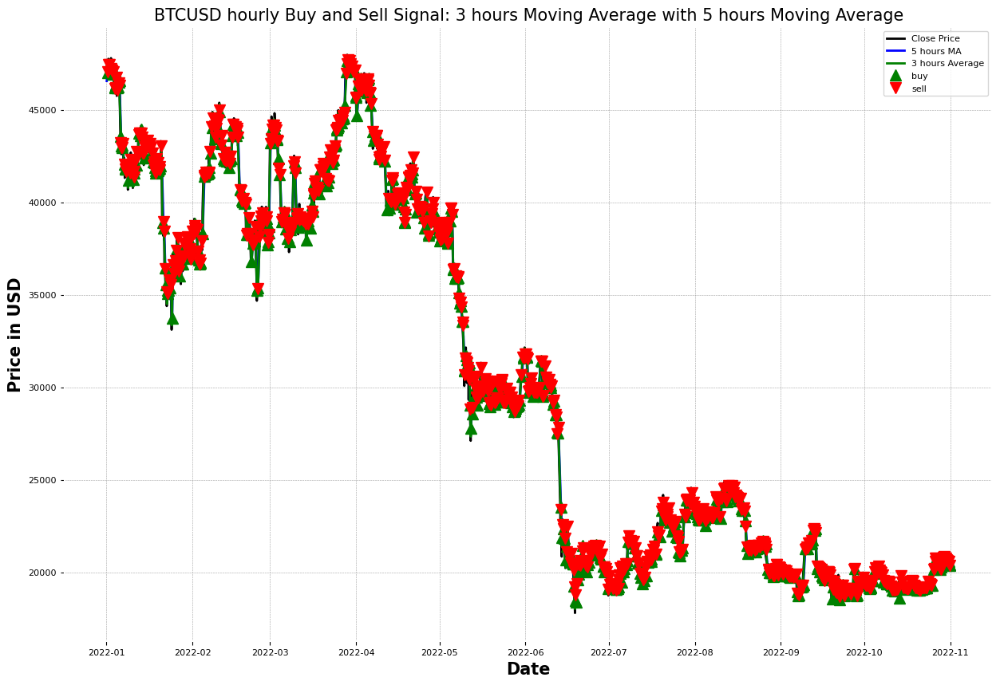

In [57]:
plt.figure(figsize = (15,10))
# plot close price, short-term and long-term moving averages 

plt.plot(Df_hourly_merge_test.index[2:],Df_hourly_merge_test['Close'][2:],color = 'k', label= 'Close Price')
plt.plot(Df_hourly_merge_test.index[2:],Df_hourly_merge_test['5MovingAverage'][2:],color = 'b',label = '5 hours MA') 
plt.plot(Df_hourly_merge_test.index[2:],Df_hourly_merge_test['3MovingAverage'][2:], color = 'g', label = '3 hours Average')

# plot ‘buy’ Df_hourly_merge_test
plt.plot(Df_hourly_merge_test[Df_hourly_merge_test['Position'] == 1.0].index, 
         Df_hourly_merge_test['3MovingAverage'][Df_hourly_merge_test['Position'] == 1.0], 
         '^', markersize = 10, color = 'g', label = 'buy')

# plot ‘sell’ signals
plt.plot(Df_hourly_merge_test[Df_hourly_merge_test['Position'] == -1.0].index, 
         Df_hourly_merge_test['3MovingAverage'][Df_hourly_merge_test['Position'] == -1.0], 
         'v', markersize = 10, color = 'r', label = 'sell')

# plt.annotate('testing', xy=(('2021-09-11 18'),45000) , xytext = ('2021-09-11 18',45000) )
plt.ylabel('Price in USD', fontsize = 15 )
plt.xlabel('Date', fontsize = 15 )
plt.title('BTCUSD hourly Buy and Sell Signal: 3 hours Moving Average with 5 hours Moving Average', fontsize = 15)
#plt.xticks(ticks = Df_hourly_merge.index, fontsize = 20)
# plt.xticks(Df_hourly_merge.index)
plt.legend()
plt.grid(True)
plt.show()

In [58]:
#Generating Signals
Df_hourly_merge_test['Signal35JMJ'] = 0.0
Df_hourly_merge_test['Signal35JMJ'] = np.where(Df_hourly_merge_test['JMJ_3HMoving_averages'] >Df_hourly_merge_test['JMJ_5HMoving_averages'], 1.0, 0.0)
Df_hourly_merge_test.head()

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,TB Quote Volume,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages,Signal,Position,Signal35JMJ
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 01:00:00,11.970721,1.637387,40786.511261,11153.529279,472.700321,15.245495,0.100678,0.063956,1.0,3.976744,...,2.296327e+07,0,46392.350000,46278.030,both,0.000000,0.000000,1.0,NaN,0.0
2022-01-01 02:00:00,9.681922,1.331808,17535.109840,2114.050343,47.942022,12.345538,0.055073,0.067653,2.0,2.508475,...,9.662607e+06,0,46550.400000,46457.810,both,0.000000,0.000000,1.0,0.0,0.0
2022-01-01 03:00:00,2.995842,0.326403,9171.775468,2354.451143,395.262768,3.648649,0.080534,0.145464,3.0,4.076923,...,1.162938e+07,0,46748.680000,46553.392,both,46804.194204,0.000000,1.0,0.0,1.0
2022-01-01 04:00:00,5.997481,0.337531,16269.705290,2399.350126,81.463167,6.672544,0.081123,0.057182,4.0,3.777778,...,1.857540e+07,0,46801.036667,46655.234,both,46790.406916,0.000000,1.0,0.0,1.0
2022-01-01 05:00:00,5.840000,0.541053,13962.989474,2395.225263,242.920251,6.922105,0.099940,0.187256,5.0,3.530612,...,3.669532e+07,0,46778.673333,46754.058,both,46968.779802,46929.116305,1.0,0.0,1.0


In [59]:
Df_hourly_merge_test['Position35JMJ'] = Df_hourly_merge_test['Signal35JMJ'].diff()
Df_hourly_merge_test.head(50) ####KEY

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages,Signal,Position,Signal35JMJ,Position35JMJ
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 01:00:00,11.970721,1.637387,40786.511261,11153.529279,472.700321,15.245495,0.100678,0.063956,1.0,3.976744,...,0,46392.350000,46278.030,both,0.000000,0.000000,1.0,NaN,0.0,NaN
2022-01-01 02:00:00,9.681922,1.331808,17535.109840,2114.050343,47.942022,12.345538,0.055073,0.067653,2.0,2.508475,...,0,46550.400000,46457.810,both,0.000000,0.000000,1.0,0.0,0.0,0.0
2022-01-01 03:00:00,2.995842,0.326403,9171.775468,2354.451143,395.262768,3.648649,0.080534,0.145464,3.0,4.076923,...,0,46748.680000,46553.392,both,46804.194204,0.000000,1.0,0.0,1.0,1.0
2022-01-01 04:00:00,5.997481,0.337531,16269.705290,2399.350126,81.463167,6.672544,0.081123,0.057182,4.0,3.777778,...,0,46801.036667,46655.234,both,46790.406916,0.000000,1.0,0.0,1.0,0.0
2022-01-01 05:00:00,5.840000,0.541053,13962.989474,2395.225263,242.920251,6.922105,0.099940,0.187256,5.0,3.530612,...,0,46778.673333,46754.058,both,46968.779802,46929.116305,1.0,0.0,1.0,0.0
2022-01-01 06:00:00,13.801008,2.118388,20847.027708,2732.649874,551.247722,18.037783,0.095345,0.195319,6.0,4.451613,...,0,46905.600000,46861.342,both,47027.000927,46961.917494,1.0,0.0,1.0,0.0
2022-01-01 07:00:00,6.573770,1.763934,12826.426230,2947.963934,351.952663,10.101639,0.081065,0.104539,7.0,4.347826,...,0,46961.073333,46901.638,both,47099.785963,47008.907212,1.0,0.0,1.0,0.0
2022-01-01 08:00:00,7.168860,1.219298,56840.320175,2333.559211,1397.910604,9.607456,0.088090,0.066432,8.0,3.282609,...,0,47122.300000,46978.230,both,47063.555784,47067.330973,1.0,0.0,0.0,-1.0
2022-01-01 09:00:00,10.482684,1.554113,11793.725108,2021.062771,93.635238,13.590909,0.100722,0.205165,9.0,4.611111,...,0,47099.723333,47040.554,both,47155.649493,47114.795433,1.0,0.0,1.0,1.0


In [60]:
Df_hourly_merge_test.shape

(7296, 31)

In [61]:
Df_hourly_merge_test.columns

Index(['favorites', 'retweets', 'number_of_followers', 'following',
       'followers_following_ratio', '2x_retweets_+_favorites', 'polarity',
       'W1 Score', 'hour', 'Bull_ratio', 'W Score With Bull Ratio',
       'Open Time', 'Open', 'High', 'Low', 'Close', 'Volume',
       'Quote Asset Volume', 'Number of Trades', 'TB Base Volume',
       'TB Quote Volume', 'Ignore', '3MovingAverage', '5MovingAverage',
       '_merge', 'JMJ_3HMoving_averages', 'JMJ_5HMoving_averages', 'Signal',
       'Position', 'Signal35JMJ', 'Position35JMJ'],
      dtype='object')

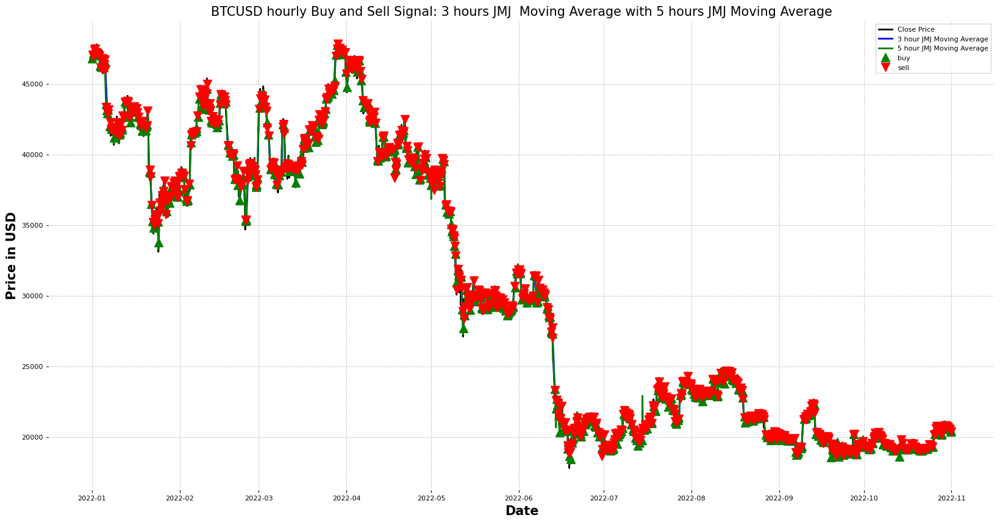

In [62]:
plt.figure(figsize = (20,10))
# plot close price, short-term and long-term moving averages 

plt.plot(Df_hourly_merge_test.index[4:],Df_hourly_merge_test['Close'][4:],color = 'k', label= 'Close Price')
plt.plot(Df_hourly_merge_test.index[4:],Df_hourly_merge_test['JMJ_5HMoving_averages'][4:],color = 'b',label = '3 hour JMJ Moving Average') 
plt.plot(Df_hourly_merge_test.index[4:],Df_hourly_merge_test['JMJ_3HMoving_averages'][4:], color = 'g', label = '5 hour JMJ Moving Average')

# plot ‘buy’ signals
plt.plot(Df_hourly_merge_test[Df_hourly_merge_test['Position35JMJ'] == 1.0].index, 
         Df_hourly_merge_test['JMJ_3HMoving_averages'][Df_hourly_merge_test['Position35JMJ'] == 1.0], 
         '^', markersize = 10, color = 'g', label = 'buy')

# plot ‘sell’ signals
plt.plot(Df_hourly_merge_test[Df_hourly_merge_test['Position35JMJ'] == -1.0].index, 
         Df_hourly_merge_test['JMJ_3HMoving_averages'][Df_hourly_merge_test['Position35JMJ'] == -1.0], 
         'v', markersize = 10, color = 'r', label = 'sell')

# plt.annotate('testing', xy=(('2021-09-11 18'),45000) , xytext = ('2021-09-11 18',45000) )
plt.ylabel('Price in USD', fontsize = 15 )
plt.xlabel('Date', fontsize = 15 )
plt.title('BTCUSD hourly Buy and Sell Signal: 3 hours JMJ  Moving Average with 5 hours JMJ Moving Average', fontsize = 15)
#plt.xticks(ticks = Df_hourly_merge.index, fontsize = 20)
# plt.xticks(Df_hourly_merge.index)
plt.legend()
plt.grid(True)
plt.show()

In [63]:
Df_hourly_merge_test #mean

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,Ignore,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages,Signal,Position,Signal35JMJ,Position35JMJ
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 01:00:00,11.970721,1.637387,40786.511261,11153.529279,472.700321,15.245495,0.100678,0.063956,1.0,3.976744,...,0,46392.350000,46278.030,both,0.000000,0.000000,1.0,NaN,0.0,NaN
2022-01-01 02:00:00,9.681922,1.331808,17535.109840,2114.050343,47.942022,12.345538,0.055073,0.067653,2.0,2.508475,...,0,46550.400000,46457.810,both,0.000000,0.000000,1.0,0.0,0.0,0.0
2022-01-01 03:00:00,2.995842,0.326403,9171.775468,2354.451143,395.262768,3.648649,0.080534,0.145464,3.0,4.076923,...,0,46748.680000,46553.392,both,46804.194204,0.000000,1.0,0.0,1.0,1.0
2022-01-01 04:00:00,5.997481,0.337531,16269.705290,2399.350126,81.463167,6.672544,0.081123,0.057182,4.0,3.777778,...,0,46801.036667,46655.234,both,46790.406916,0.000000,1.0,0.0,1.0,0.0
2022-01-01 05:00:00,5.840000,0.541053,13962.989474,2395.225263,242.920251,6.922105,0.099940,0.187256,5.0,3.530612,...,0,46778.673333,46754.058,both,46968.779802,46929.116305,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-31 20:00:00,6.830952,2.088095,11703.869048,1012.940476,255.140622,11.007143,0.076967,0.169937,20.0,3.275000,...,0,20393.086667,20390.532,both,20410.206961,20394.632170,1.0,0.0,1.0,0.0
2022-10-31 21:00:00,5.409524,1.052381,11369.440476,700.669048,155.268382,7.514286,0.090984,0.237608,21.0,2.888889,...,0,20402.370000,20390.524,both,20392.872746,20399.763973,1.0,0.0,0.0,-1.0
2022-10-31 22:00:00,3.964286,0.678571,35132.575893,933.075893,511.425744,5.321429,0.105109,0.112615,22.0,4.885714,...,0,20393.263333,20397.466,both,20427.368347,20419.680820,0.0,-1.0,1.0,1.0


In [65]:
Df_hourly_merge_test.to_csv('assets/Test_PCHourly2022.csv')

### Adding Actual Label:

In [66]:
PredictDF_test = Df_hourly_merge_test.copy()

In [68]:
# PredictDF= pd.read_csv('assets/PCHourlyMilestoneIData.csv')
prediction = (PredictDF_test.shift(-1)['Close'] >= PredictDF_test['Close'])
prediction = prediction.iloc[:-1]
PredictDF_test['Actual_Label'] = prediction.astype(int)
# PredictDF= PredictDF.dropna()
PredictDF_test

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,3MovingAverage,5MovingAverage,_merge,JMJ_3HMoving_averages,JMJ_5HMoving_averages,Signal,Position,Signal35JMJ,Position35JMJ,Actual_Label
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 01:00:00,11.970721,1.637387,40786.511261,11153.529279,472.700321,15.245495,0.100678,0.063956,1.0,3.976744,...,46392.350000,46278.030,both,0.000000,0.000000,1.0,NaN,0.0,NaN,1.0
2022-01-01 02:00:00,9.681922,1.331808,17535.109840,2114.050343,47.942022,12.345538,0.055073,0.067653,2.0,2.508475,...,46550.400000,46457.810,both,0.000000,0.000000,1.0,0.0,0.0,0.0,1.0
2022-01-01 03:00:00,2.995842,0.326403,9171.775468,2354.451143,395.262768,3.648649,0.080534,0.145464,3.0,4.076923,...,46748.680000,46553.392,both,46804.194204,0.000000,1.0,0.0,1.0,1.0,0.0
2022-01-01 04:00:00,5.997481,0.337531,16269.705290,2399.350126,81.463167,6.672544,0.081123,0.057182,4.0,3.777778,...,46801.036667,46655.234,both,46790.406916,0.000000,1.0,0.0,1.0,0.0,1.0
2022-01-01 05:00:00,5.840000,0.541053,13962.989474,2395.225263,242.920251,6.922105,0.099940,0.187256,5.0,3.530612,...,46778.673333,46754.058,both,46968.779802,46929.116305,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-31 20:00:00,6.830952,2.088095,11703.869048,1012.940476,255.140622,11.007143,0.076967,0.169937,20.0,3.275000,...,20393.086667,20390.532,both,20410.206961,20394.632170,1.0,0.0,1.0,0.0,1.0
2022-10-31 21:00:00,5.409524,1.052381,11369.440476,700.669048,155.268382,7.514286,0.090984,0.237608,21.0,2.888889,...,20402.370000,20390.524,both,20392.872746,20399.763973,1.0,0.0,0.0,-1.0,1.0
2022-10-31 22:00:00,3.964286,0.678571,35132.575893,933.075893,511.425744,5.321429,0.105109,0.112615,22.0,4.885714,...,20393.263333,20397.466,both,20427.368347,20419.680820,0.0,-1.0,1.0,1.0,1.0


In [70]:
PredictDF_test.to_csv('assets/Test_PCHourly2022_ActualLabel.csv')

# 6. Extract News Headline Sentiment Data

First we use API key Connect with Alpaca API for financial news content to add Sentiment data to our model for both cryptocurrency and broad market news, by focusing on keywords related to each and save to crypto_news and mkt_news. The result is a dataframe for each hour and the sentiment of the combined news articles for that hour that is ready to merge with the training dataframe. We then use the same approach in the following cell for the test time frame, which is ready to merge with the testing dataframe. The last 5 rows of each dataframe are shown.

In [71]:
from alpaca_trade_api import REST, Stream
from transformers import pipeline
import pandas as pd
from textblob import TextBlob

endpoint_url = "https://paper-api.alpaca.markets"
api = REST("PKHX23CTBFUXA0Y7PNFM", "1hlepuy4wyxuVgG1ro0CcwrgamOjmSCk2aoqd2oF", endpoint_url)

crypto_news = api.get_news(["BTCUSD","BTC","$BTC","ETHUSD","ETH","$ETH","DOGEUSD","DOGE","$DOGE"], "2018-12-31", "2021-12-31", limit=41000)
mkt_news = api.get_news(["SPY","NASDAQ","VIX^",], "2018-12-31", "2021-12-31", limit=41000)

crypto_news_list = []

for story in crypto_news:
    crypto_news_dict = {}
    crypto_news_dict["time"] = story.created_at
    crypto_news_dict["Crypto Headline"] = story.headline
    crypto_news_list.append(crypto_news_dict)
    
crypto_news_df = pd.DataFrame(crypto_news_list)

mkt_news_list = []

for story in mkt_news:
    mkt_news_dict = {}
    mkt_news_dict["time"] = story.created_at
    mkt_news_dict["Mkt Headline"] = story.headline
    mkt_news_list.append(mkt_news_dict)
    
mkt_news_df = pd.DataFrame(mkt_news_list)

# Calculate sentiment scores for each headline
crypto_sentiments = []

for headline in crypto_news_df['Crypto Headline']:
    blob = TextBlob(str(headline))
    crypto_sentiment = blob.sentiment.polarity
    crypto_sentiments.append(crypto_sentiment)

crypto_news_df['Crypto Sentiment'] = crypto_sentiments

mkt_sentiments = []

for headline in mkt_news_df['Mkt Headline']:
    blob = TextBlob(str(headline))
    mkt_sentiment = blob.sentiment.polarity
    mkt_sentiments.append(mkt_sentiment)

mkt_news_df['Mkt Sentiment'] = mkt_sentiments

crypto_sentiment_df = crypto_news_df.resample('H', on='time').mean()[['Crypto Sentiment']].fillna(0)
mkt_sentiment_df = mkt_news_df.resample('H', on='time').mean()[['Mkt Sentiment']].fillna(0)

# Merge Dataframes & Filter
market_sentiment_df = pd.merge(mkt_sentiment_df, crypto_sentiment_df, how='outer', on='time').fillna(0)
market_sentiment_train_df = market_sentiment_df.loc['2019-01-01 02:00:00':'2021-12-31']
market_sentiment_train_df.tail()

sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying htt

,Mkt Sentiment,Crypto Sentiment
time,,
2021-11-30 19:00:00+00:00,0.098872,0.000000
2021-11-30 20:00:00+00:00,-0.100000,-0.200000
2021-11-30 21:00:00+00:00,0.037500,0.500000
2021-11-30 22:00:00+00:00,0.000000,0.083333
2021-11-30 23:00:00+00:00,0.100000,0.000000


Now extracting Testing Data set

In [72]:
from alpaca_trade_api import REST, Stream
from transformers import pipeline
import pandas as pd
from textblob import TextBlob

endpoint_url = "https://paper-api.alpaca.markets"
api = REST("PKHX23CTBFUXA0Y7PNFM", "1hlepuy4wyxuVgG1ro0CcwrgamOjmSCk2aoqd2oF", endpoint_url)

crypto_news = api.get_news(["BTCUSD","BTC","$BTC","ETHUSD","ETH","$ETH","DOGEUSD","DOGE","$DOGE"], "2022-01-01", "2022-11-01", limit=41000)
mkt_news = api.get_news(["SPY","NASDAQ","VIX^",], "2022-01-01", "2022-11-01", limit=41000)

#consider other sentiment/polarity measures VADR

crypto_news_list = []

for story in crypto_news:
    crypto_news_dict = {}
    crypto_news_dict["time"] = story.created_at
    crypto_news_dict["Crypto Headline"] = story.headline
    crypto_news_list.append(crypto_news_dict)
    
crypto_news_df = pd.DataFrame(crypto_news_list)

mkt_news_list = []

for story in mkt_news:
    mkt_news_dict = {}
    mkt_news_dict["time"] = story.created_at
    mkt_news_dict["Mkt Headline"] = story.headline
    mkt_news_list.append(mkt_news_dict)
    
mkt_news_df = pd.DataFrame(mkt_news_list)

# Calculate sentiment scores for each headline
crypto_sentiments = []

for headline in crypto_news_df['Crypto Headline']:
    blob = TextBlob(str(headline))
    crypto_sentiment = blob.sentiment.polarity
    crypto_sentiments.append(crypto_sentiment)

crypto_news_df['Crypto Sentiment'] = crypto_sentiments

mkt_sentiments = []

for headline in mkt_news_df['Mkt Headline']:
    blob = TextBlob(str(headline))
    mkt_sentiment = blob.sentiment.polarity
    mkt_sentiments.append(mkt_sentiment)

mkt_news_df['Mkt Sentiment'] = mkt_sentiments

crypto_sentiment_df = crypto_news_df.resample('H', on='time').mean()[['Crypto Sentiment']].fillna(0)
mkt_sentiment_df = mkt_news_df.resample('H', on='time').mean()[['Mkt Sentiment']].fillna(0)

# Merge Dataframes & Filter
market_sentiment_df = pd.merge(mkt_sentiment_df, crypto_sentiment_df, how='outer', on='time').fillna(0)
market_sentiment_test_df = market_sentiment_df.loc['2022-01-01 05:00:00':'2022-11-1 00:00:00']
market_sentiment_test_df.tail()

sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...
sleep 3 seconds and retrying https://data.alpaca.markets/v1beta1/news 3 more time(s)...


,Mkt Sentiment,Crypto Sentiment
time,,
2022-10-31 16:00:00+00:00,0.083333,-0.083333
2022-10-31 17:00:00+00:00,0.000000,0.214286
2022-10-31 18:00:00+00:00,0.144444,0.200000
2022-10-31 19:00:00+00:00,0.013889,0.050000
2022-10-31 20:00:00+00:00,0.101111,0.225000


# 7. Find Optimal Historical SMA, WMA, EMA Periods

Install the necessary packages for part 2. Expected run time for Part 2 is about 10 minutes. ***Discussion to be had about removing this from the process every iteration.***

The next step iterates through every hour from 3 to 50 as the short term (ST) moving average (MA) time period. For the long term (LT) moving average (MA), it will iterate through every combination of the current ST MA being tested * 1.5 up to a maximum LT period of 200. For example if the current iteration uses a ST MA of 10, it will iterate through the combination of (ST MA, LT MA) where the initial ST MA tested would be 10, and the initial LT MA tested would be 15. It would then test (10,16), (10,17), (10,18) and so on until it stops at (10,200). Then it would test 11 using the same logic all the way up to 50 for ST MA. 

In this process a balance is calculated using a Simple Moving Average (SMA) to produce buy and sell decisions. A buy signal/decision is produced when a 'Golden Cross' occurs, which is when the ST MA crosses over the LT MA. Alternatively a sell signal/decision is produced when a 'Death Cross' occurs, which is when the LT MA crosses over the ST MA. It will finish by printing out the optimal MA Periods to maximize return using this Crossover Strategy. The optimal periods will later be used to transform the data into moving averages to determine if trends in the data follow any similar movement to the optimal periods. 

The same process will be used in the following cells as well to determine the optimal time periods, but rather than an SMA using a Weighted Moving Average (WMA) and Exponential Moving Average (EMA). We will also print out the tail of each dataframe at this point.                                                  

In [73]:
%%time
import pandas as pd
import yfinance as yf
import numpy as np

# Create an empty dataframe to store the results
result_df_sma = pd.DataFrame()

BTC_Ticker = yf.Ticker("BTC-USD")
df = BTC_Ticker.history(period="max")

best_periods = (0, 0, 0)
best_balance = 0

# Iterate through all possible combinations of time periods
for time_period_1 in range(3, 51):
    for time_period_2 in range(int(time_period_1 * 1.5), 201):
        if time_period_2 > time_period_1 * 2:
            break
        df["sma1"] = df["Close"].rolling(window=time_period_1).mean()
        df["sma2"] = df["Close"].rolling(window=time_period_2).mean()

        # Identify the crossover points (i.e. buy/sell signals)
        buy = np.where((df['sma1'] > df['sma2']) & (df['sma1'].shift(1) < df['sma2'].shift(1)), 1, 0)
        sell = np.where((df['sma1'] < df['sma2']) & (df['sma1'].shift(1) > df['sma2'].shift(1)), -1, 0)
        df['sma_signal'] = np.where((buy + sell) != 0, buy + sell, 0)

        # Backtest Starting with $10,000.00
        shares = 0
        cash = 10000
        df["sma_balance"] = 0

        for i, row in df.iterrows():
            if row["sma_signal"] == 1:
                shares = cash / row["Close"]
                cash = 0
            elif row["sma_signal"] == -1:
                cash = shares * row["Close"]
                shares = 0

            df.at[i, "sma_balance"] = cash + shares * row["Close"]

        # Total % Return vs Buy & Hold Strategy 
        df["sma_return"] = (df["sma_balance"] / 10000 - 1) * 100
        initial_close = df.iloc[0]['Close']
        df['buy_and_hold_balance'] = 10000 / initial_close * df['Close']
        df['buy_and_hold_return'] = (df['buy_and_hold_balance'] / 10000 - 1) * 100

        final_balance = df.iloc[-1]['sma_balance']

        # Update the best time periods and balance if the final balance is higher than the previous best
        if final_balance > best_balance:
            best_periods = (time_period_1, time_period_2, final_balance)
            best_balance = final_balance

        # Append the dataframe to the result dataframe
            result_df_sma = df.copy()

# Plot the price data and moving averages on a graph to visualize the buy/sell signals with the best time periods
SMA_st, SMA_lt, final_balance = best_periods

print(f"The optimal time periods for the maximized return using a Simple Moving Average (SMA) are: {SMA_st} and {SMA_lt} with a final balance of {final_balance}")

The optimal time periods for the maximized return using a Simple Moving Average (SMA) are: 11 and 21 with a final balance of 2088948.8425769492
Wall time: 2min 21s


In [74]:
result_df_sma.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,sma1,sma2,sma_signal,sma_balance,sma_return,buy_and_hold_balance,buy_and_hold_return
Date,,,,,,,,,,,,,,
2023-03-26 00:00:00+00:00,27495.523438,28178.144531,27445.046875,27994.330078,13878363192,0.0,0.0,27458.914418,25003.898065,0,2.042488e+06,20324.877966,612120.007839,6021.200078
2023-03-27 00:00:00+00:00,27994.068359,28037.925781,26606.689453,27139.888672,18188895178,0.0,0.0,27648.650746,25228.190011,0,1.980147e+06,19701.470962,593436.914555,5834.369146
2023-03-28 00:00:00+00:00,27132.888672,27460.718750,26677.818359,27268.130859,17783600385,0.0,0.0,27634.487216,25468.588170,0,1.989504e+06,19795.037445,596241.039840,5862.410398
2023-03-29 00:00:00+00:00,27267.031250,28619.542969,27259.662109,28348.441406,20684945906,0.0,0.0,27760.174716,25784.319661,0,2.068324e+06,20583.240307,619862.955370,6098.629554
2023-03-30 00:00:00+00:00,28350.791016,29120.660156,28279.117188,28631.125000,21066921984,0.0,0.0,27814.033736,26178.038876,0,2.088949e+06,20789.488426,626044.074301,6160.440743


In [75]:
%%time
BTC_Ticker = yf.Ticker("BTC-USD")
df = BTC_Ticker.history(period="max")

result_df_wma = pd.DataFrame()

best_periods = (0, 0, 0)
best_balance = 0

# Iterate through all possible combinations of time periods
for time_period_1 in range(3, 51):
    for time_period_2 in range(int(time_period_1 * 1.5), 201):
        if time_period_2 > time_period_1 * 2:
            break

        # Calculate the weighted moving averages
        weights_1 = np.arange(1, time_period_1 + 1)
        weights_2 = np.arange(1, time_period_2 + 1)
        df["wma1"] = df["Close"].rolling(window=time_period_1).apply(lambda x: np.sum(x * weights_1) / np.sum(weights_1), raw=True)
        df["wma2"] = df["Close"].rolling(window=time_period_2).apply(lambda x: np.sum(x * weights_2) / np.sum(weights_2), raw=True)

        # Identify the crossover points (i.e. buy/sell signals)
        buy = np.where((df['wma1'] > df['wma2']) & (df['wma1'].shift(1) < df['wma2'].shift(1)), 1, 0)
        sell = np.where((df['wma1'] < df['wma2']) & (df['wma1'].shift(1) > df['wma2'].shift(1)), -1, 0)
        df['wma_signal'] = np.where((buy + sell) != 0, buy + sell, 0)

        # Backtest Starting with $10,000.00
        shares = 0
        cash = 10000
        df["wma_balance"] = 0

        for i, row in df.iterrows():
            if row["wma_signal"] == 1:
                shares = cash / row["Close"]
                cash = 0
            elif row["wma_signal"] == -1:
                cash = shares * row["Close"]
                shares = 0

            df.at[i, "wma_balance"] = cash + shares * row["Close"]

        # Total % Return vs Buy & Hold Strategy 
        df["wma_return"] = (df["wma_balance"] / 10000 - 1) * 100
        initial_close = df.iloc[0]['Close']
        df['buy_and_hold_balance'] = 10000 / initial_close * df['Close']
        df['buy_and_hold_return'] = (df['buy_and_hold_balance'] / 10000 - 1) * 100

        final_balance = df.iloc[-1]['wma_balance']

        # Update the best time periods and balance if the final balance is higher than the previous best
        if final_balance > best_balance:
            best_periods = (time_period_1, time_period_2, final_balance)
            best_balance = final_balance

            # Append the dataframe to the result dataframe
            result_df_wma = df.copy()

# Plot the price data and moving averages on a graph to visualize the buy/sell signals with the best time periods
WMA_st, WMA_lt, final_balance = best_periods

print(f"The optimal time periods for the maximized return using a Weighted Moving Average (WMA) are: {WMA_st} and {WMA_lt} with a final balance of {final_balance}")


The optimal time periods for the maximized return using a Weighted Moving Average (WMA) are: 25 and 49 with a final balance of 2433812.7773617236
Wall time: 2min 58s


In [76]:
result_df_wma.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,wma1,wma2,wma_signal,wma_balance,wma_return,buy_and_hold_balance,buy_and_hold_return
Date,,,,,,,,,,,,,,
2023-03-26 00:00:00+00:00,27495.523438,28178.144531,27445.046875,27994.330078,13878363192,0.0,0.0,25932.958846,24716.617643,0,2.381756e+06,23717.561459,612120.007839,6021.200078
2023-03-27 00:00:00+00:00,27994.068359,28037.925781,26606.689453,27139.888672,18188895178,0.0,0.0,26126.153762,24843.070300,0,2.309060e+06,22990.603156,593436.914555,5834.369146
2023-03-28 00:00:00+00:00,27132.888672,27460.718750,26677.818359,27268.130859,17783600385,0.0,0.0,26317.938317,24971.077313,0,2.319971e+06,23099.711542,596241.039840,5862.410398
2023-03-29 00:00:00+00:00,27267.031250,28619.542969,27259.662109,28348.441406,20684945906,0.0,0.0,26577.729988,25139.028308,0,2.411884e+06,24018.839193,619862.955370,6098.629554
2023-03-30 00:00:00+00:00,28350.791016,29120.660156,28279.117188,28606.185547,20996677632,0.0,0.0,26838.901695,25312.873524,0,2.433813e+06,24238.127774,625498.751795,6154.987518


In [77]:
%%time
BTC_Ticker = yf.Ticker("BTC-USD")
df = BTC_Ticker.history(period="max")

result_df_ema = pd.DataFrame()

best_periods = (0, 0, 0)
best_balance = 0

# Iterate through all possible combinations of time periods
for time_period_1 in range(3, 51):
    for time_period_2 in range(int(time_period_1 * 1.5), 201):
        if time_period_2 > time_period_1 * 2:
            break
        df["ema1"] = df["Close"].ewm(span=time_period_1, adjust=False).mean()
        df["ema2"] = df["Close"].ewm(span=time_period_2, adjust=False).mean()

        # Identify the crossover points (i.e. buy/sell signals)
        buy = np.where((df['ema1'] > df['ema2']) & (df['ema1'].shift(1) < df['ema2'].shift(1)), 1, 0)
        sell = np.where((df['ema1'] < df['ema2']) & (df['ema1'].shift(1) > df['ema2'].shift(1)), -1, 0)
        df['ema_signal'] = np.where((buy + sell) != 0, buy + sell, 0)

        # Backtest Starting with $10,000.00
        shares = 0
        cash = 10000
        df["ema_balance"] = 0

        for i, row in df.iterrows():
            if row["ema_signal"] == 1:
                shares = cash / row["Close"]
                cash = 0
            elif row["ema_signal"] == -1:
                cash = shares * row["Close"]
                shares = 0

            df.at[i, "ema_balance"] = cash + shares * row["Close"]

        # Total % Return vs Buy & Hold Strategy 
        df["ema_return"] = (df["ema_balance"] / 10000 - 1) * 100
        initial_close = df.iloc[0]['Close']
        df['buy_and_hold_balance'] = 10000 / initial_close * df['Close']
        df['buy_and_hold_return'] = (df['buy_and_hold_balance'] / 10000 - 1) * 100

        final_balance = df.iloc[-1]['ema_balance']

        # Update the best time periods and balance if the final balance is higher than the previous best
        if final_balance > best_balance:
            best_periods = (time_period_1, time_period_2, final_balance)
            best_balance = final_balance

            # Append the dataframe to the result dataframe
            result_df_ema = df.copy()

# Plot the price data and moving averages on a graph to visualize the buy/sell signals with the best time periods
EMA_st, EMA_lt, final_balance = best_periods

print(f"The optimal time periods for the maximized return using an Exponential Moving Average (EMA) are: {EMA_st} and {EMA_lt} with a final balance of {final_balance}")


The optimal time periods for the maximized return using an Exponential Moving Average (EMA) are: 29 and 57 with a final balance of 3087889.833066099
Wall time: 2min 19s


In [78]:
result_df_ema.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,ema1,ema2,ema_signal,ema_balance,ema_return,buy_and_hold_balance,buy_and_hold_return
Date,,,,,,,,,,,,,,
2023-03-26 00:00:00+00:00,27495.523438,28178.144531,27445.046875,27994.330078,13878363192,0.0,0.0,25313.093049,23924.214570,0,3.022467e+06,30124.670337,612120.007839,6021.200078
2023-03-27 00:00:00+00:00,27994.068359,28037.925781,26606.689453,27139.888672,18188895178,0.0,0.0,25434.879424,24035.099884,0,2.930215e+06,29202.154607,593436.914555,5834.369146
2023-03-28 00:00:00+00:00,27132.888672,27460.718750,26677.818359,27268.130859,17783600385,0.0,0.0,25557.096186,24146.583711,0,2.944061e+06,29340.613997,596241.039840,5862.410398
2023-03-29 00:00:00+00:00,27267.031250,28619.542969,27259.662109,28348.441406,20684945906,0.0,0.0,25743.185868,24291.475355,0,3.060699e+06,30506.994119,619862.955370,6098.629554
2023-03-30 00:00:00+00:00,28350.791016,29120.660156,28279.117188,28600.281250,20971491328,0.0,0.0,25933.658893,24440.054869,0,3.087890e+06,30778.898331,625369.649286,6153.696493


# 8.  Merge MA Dataframes & Milestone II Dataframes as Training Data

Next we will merge the 3 dataframes above and clean them up so we have a single dataframe FinalDataframe of each of the 3 optimal strategies. ***It will then produce the tail of this Final_Dataframe which will be combined into the original data from Milestone II.*** 

In [79]:
merged_df = pd.merge(result_df_sma, result_df_wma, left_index=True, right_index=True)
merged_df = pd.merge(merged_df, result_df_ema, left_index=True, right_index=True)
merged_df = merged_df.drop(['Open_x', 'Open_y', 'High_x', 'High_y', 'Low_x', 
                            'Low_y', 'Close_x', 'Close_y', 'Volume_x', 
                            'Volume_y', 'buy_and_hold_balance_y', 'buy_and_hold_balance_x',
                            'buy_and_hold_return_x','buy_and_hold_return_y', 'Dividends_y','Dividends_x', 
                            'Dividends', 'Stock Splits','Stock Splits_x',
                            'Stock Splits_y'], axis=1)
merged_df = merged_df.reindex(columns=['Open', 'High', 'Low', 'Close', 'Volume', 
                           'buy_and_hold_balance', 'buy_and_hold_return', 
                           'sma1', 'sma2', 'sma_signal', 'sma_balance', 'sma_return', 
                           'wma1','wma2', 'wma_signal', 'wma_balance', 'wma_return',
                           'ema1', 'ema2', 'ema_signal', 'ema_balance','ema_return'
                          ])
Final_Dataframe = merged_df.rename(columns={'buy_and_hold_balance': "Buy & Hold Balance", "buy_and_hold_return": "% Return", 
                                      "sma1": "Historically Optimal SMA(s-t)", "sma2": "Historically Optimal SMA(l-t)", 
                                      "sma_signal": "SMA Signal(b-s)", "sma_balance": "Historically Optimal SMA Balance",
                                      "sma_return": "SMA % Return",
                                     "wma1": "Historically Optimal WMA(s-t)", "wma2": "Historically Optimal WMA(l-t)", 
                                      "wma_signal": "WMA Signal(b-s)", "wma_balance": "Historically Optimal WMA Balance",
                                      "wma_return": "WMA % Return",
                                      "ema1": "Historically Optimal EMA(s-t)", "ema2": "Historically Optimal EMA(l-t)", 
                                      "ema_signal": "EMA Signal(b-s)", "ema_balance": "Historically Optimal EMA Balance",
                                      "ema_return": "EMA % Return"
                                     })
Final_Dataframe.tail()

,Open,High,Low,Close,Volume,Buy & Hold Balance,% Return,Historically Optimal SMA(s-t),Historically Optimal SMA(l-t),SMA Signal(b-s),...,Historically Optimal WMA(s-t),Historically Optimal WMA(l-t),WMA Signal(b-s),Historically Optimal WMA Balance,WMA % Return,Historically Optimal EMA(s-t),Historically Optimal EMA(l-t),EMA Signal(b-s),Historically Optimal EMA Balance,EMA % Return
Date,,,,,,,,,,,,,,,,,,,,,
2023-03-26 00:00:00+00:00,27495.523438,28178.144531,27445.046875,27994.330078,13878363192,612120.007839,6021.200078,27458.914418,25003.898065,0,...,25932.958846,24716.617643,0,2.381756e+06,23717.561459,25313.093049,23924.214570,0,3.022467e+06,30124.670337
2023-03-27 00:00:00+00:00,27994.068359,28037.925781,26606.689453,27139.888672,18188895178,593436.914555,5834.369146,27648.650746,25228.190011,0,...,26126.153762,24843.070300,0,2.309060e+06,22990.603156,25434.879424,24035.099884,0,2.930215e+06,29202.154607
2023-03-28 00:00:00+00:00,27132.888672,27460.718750,26677.818359,27268.130859,17783600385,596241.039840,5862.410398,27634.487216,25468.588170,0,...,26317.938317,24971.077313,0,2.319971e+06,23099.711542,25557.096186,24146.583711,0,2.944061e+06,29340.613997
2023-03-29 00:00:00+00:00,27267.031250,28619.542969,27259.662109,28348.441406,20684945906,619862.955370,6098.629554,27760.174716,25784.319661,0,...,26577.729988,25139.028308,0,2.411884e+06,24018.839193,25743.185868,24291.475355,0,3.060699e+06,30506.994119
2023-03-30 00:00:00+00:00,28350.791016,29120.660156,28279.117188,28600.281250,20971491328,625369.649286,6153.696493,27814.033736,26178.038876,0,...,26838.901695,25312.873524,0,2.433813e+06,24238.127774,25933.658893,24440.054869,0,3.087890e+06,30778.898331


***This can just be removed if we don't want it in here, but for the purposes of visualization of performance between an Moving Average Crossover Strategy vs Buy & Hold. This shows there is room for signifcant increase in returns through active strategies.***

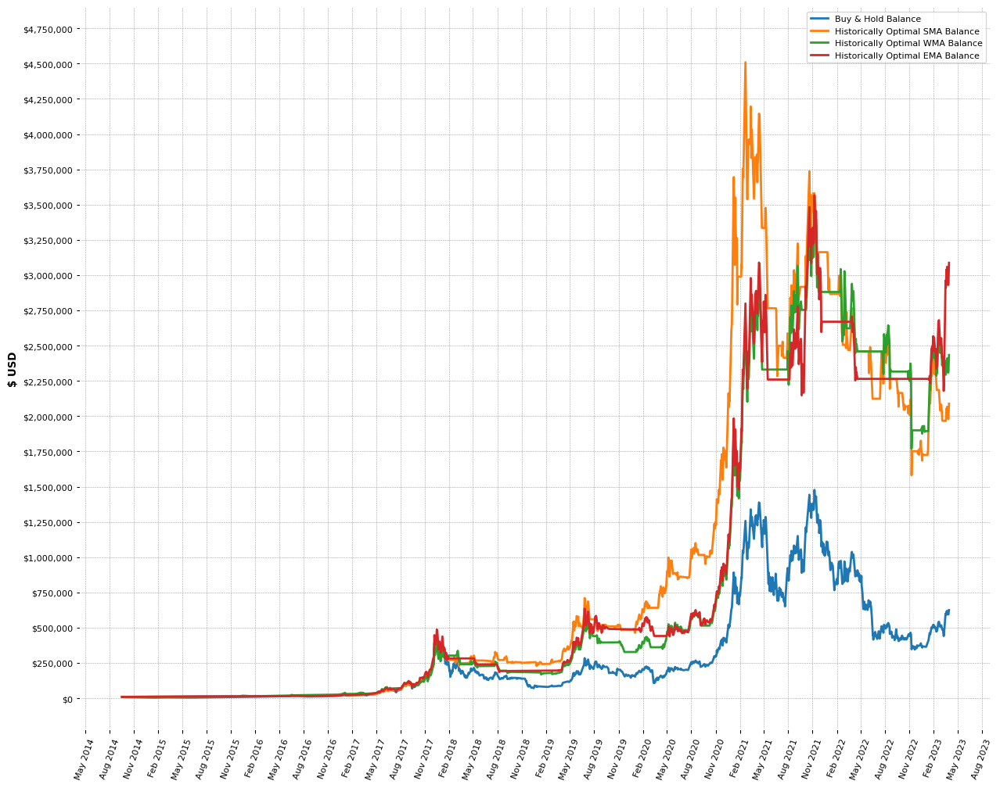

In [80]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mtick

# Create a figure and axis object
fig, ax = plt.subplots(figsize=(15, 12))

# Plot the balance over time for the given columns
ax.plot(df.index, Final_Dataframe['Buy & Hold Balance'], label='Buy & Hold Balance')
ax.plot(df.index, Final_Dataframe['Historically Optimal SMA Balance'], label='Historically Optimal SMA Balance')
ax.plot(df.index, Final_Dataframe['Historically Optimal WMA Balance'], label='Historically Optimal WMA Balance')
ax.plot(df.index, Final_Dataframe['Historically Optimal EMA Balance'], label='Historically Optimal EMA Balance')

# Format axis
ax.set_ylabel('Balance ($)')
ax.set_yticks(range(0, 5000000, 100000))

# Set date locator and formatter
monthyearFmt = mdates.DateFormatter('%b %Y')
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.xaxis.set_major_formatter(monthyearFmt)

# Add legend and axis labels
ax.legend()
ax.set_ylabel('$ USD')

# Rotate the x-axis tick labels to be vertical
plt.xticks(rotation=70)

# set the y-axis tick formatter to display values in dollars
fmt = '${x:,.0f}'
tick = mtick.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)

# set the y-axis ticks to be every $250,000
ax.yaxis.set_ticks(np.arange(0, 5000000, 250000))

# Show the plot
plt.show()


The next few steps further prepare the Moving Average Final_Dataframe for merge with the original dataframe from Milestone II. ***To line the data up with we need to turn the daily Final_Dataframe into hourly. This can be more accurately done if I can work with the code prior to this to apply the moving averages to it based on, and I can remove a lof of the features that will reduce the amount of clean up in this code.***

In [81]:
import pandas as pd

# resample the data to hourly frequency and interpolate missing values
Final_Dataframe_hourly = Final_Dataframe.resample('H').interpolate()

# calculate the hourly moving averages using a rolling window
Final_Dataframe_hourly_ma = Final_Dataframe_hourly.rolling(window=24, min_periods=1).mean()

# remove the first 23 rows as they only have partial data for the first day
Final_Dataframe_hourly_ma = Final_Dataframe_hourly_ma.iloc[23:]

# print the resulting dataframe
#Final_Dataframe_hourly_ma.tail(50)


Create df_1 for merge, which is the the Moving Average Final_Dataframe

In [82]:
df_1 = Final_Dataframe_hourly_ma.reset_index()
df_1['Date'] = pd.to_datetime(df_1['Date'])

Create df_2 for merge, which is the Milestone II dataframe.

In [87]:
filename = "assets/PCHourly2019202_ActualLabel.csv"
df_2 = pd.read_csv(filename)
df_2 = df_2.reset_index()
df_2['time'] = pd.to_datetime(df_2['time']).dt.tz_localize('UTC')

Merge the Two Dataframes now that they are properly prepared to do so. From there the merged_df will be cleaned, unncessesary columns dropped, and renamed as needed. It will then produce the tail of the merged_train_df, which is ready to be merged with the Google Trends train_df

In [88]:
# Merge the two dataframes
merged_df = pd.merge(df_1, df_2, left_on='Date', right_on='time')
merged_df = pd.merge(merged_df, market_sentiment_train_df, left_on='Date', right_on='time')

# Drop any rows with missing values
merged_df.dropna(inplace=True)

# Drop columns not needed
merged_df = merged_df.drop(['Open Time', 'Open_x', 'High_x', 'Low_x', 'Close_x', 'Volume_x',
              'Historically Optimal SMA Balance', 'SMA % Return','Historically Optimal WMA Balance', 'WMA % Return',
             'Historically Optimal EMA Balance', 'EMA % Return','Buy & Hold Balance', '% Return', 
            '_merge', 'Ignore', 'time', 'hour'], axis=1)
# Rename columns as needed
new_names = {'Date': 'Datetime','Open_y': 'Open', 'High_y': 'High', 'Low_y': 'Low', 
             'Close_y': 'Close', 'Volume_y': 'Volume', 'Signal': 'SMA Signal 35', 
             'Signal35JMJ': 'JMJ Signal 35', 'Number of Trades': '# of Hourly Trades', 
             'JMJ_3HMoving_averages': 'JMJ 3 Hour MA', 'JMJ_5HMoving_averages': 'JMJ 5 Hour MA', 
             'favorites': 'Twitter Hourly Favorites', 'retweets': 'Twitter Hourly Retweets', 
             'number_of_followers': 'Twitter Hourly Follower Exposure', 'following': 'Twitter Hourly Following Exposure',
            'followers_following_ratio': 'Twitter Hourly Follower to Following Ratio', '2x_retweets_+_favorites': 
             'Twitter Hourly 2x Retweets + Favorites', 'polarity': 'Twitter Hourly Polarity Score', 'W1 Score': 'Twitter W1 Score',
            'Bull_ratio': 'Twitter Hourly Bull Ratio', 'W Score With Bull Ratio': 'Twitter Hourly Weighted Bull Ratio', '3MovingAverage':
            '3 Hour MA', '5MovingAverage': '5 Hour MA', 'Actual_Label': "Actual Label", 'Position': 'SMA Position 35', 'Position35JMJ': 'JMJ Position 35'}
merged_train_df = merged_df.rename(columns=new_names)
merged_train_df.tail()


,Datetime,Historically Optimal SMA(s-t),Historically Optimal SMA(l-t),SMA Signal(b-s),Historically Optimal WMA(s-t),Historically Optimal WMA(l-t),WMA Signal(b-s),Historically Optimal EMA(s-t),Historically Optimal EMA(l-t),EMA Signal(b-s),...,5 Hour MA,JMJ 3 Hour MA,JMJ 5 Hour MA,SMA Signal 35,SMA Position 35,JMJ Signal 35,JMJ Position 35,Actual Label,Mkt Sentiment,Crypto Sentiment
25529,2021-11-30 19:00:00+00:00,56862.898912,59384.966710,0.0,58406.690371,60128.415202,0.0,58843.840485,57810.720010,0.0,...,57620.964,57876.195905,57394.886302,0.0,0.0,1.0,1.0,0.0,0.098872,0.000000
25530,2021-11-30 20:00:00+00:00,56854.407127,59368.831322,0.0,58396.467048,60122.283602,0.0,58839.097096,57809.815848,0.0,...,57467.414,57803.065862,57437.781614,1.0,1.0,1.0,0.0,0.0,-0.100000,-0.200000
25531,2021-11-30 21:00:00+00:00,56845.701766,59352.877895,0.0,58386.295704,60116.166219,0.0,58834.395160,57808.926854,0.0,...,57499.728,57347.551319,57598.443940,1.0,0.0,0.0,-1.0,1.0,0.037500,0.500000
25532,2021-11-30 22:00:00+00:00,56836.782829,59337.106429,0.0,58376.176337,60110.063052,0.0,58829.734674,57808.053030,0.0,...,57563.810,57275.756200,57587.015027,0.0,-1.0,0.0,0.0,0.0,0.000000,0.083333
25533,2021-11-30 23:00:00+00:00,56827.650317,59321.516923,0.0,58366.108949,60103.974103,0.0,58825.115640,57807.194375,0.0,...,57543.204,57077.050902,57232.169209,0.0,0.0,0.0,0.0,1.0,0.100000,0.000000


# 9. Load & Combine Milestone II Dataframes as Test Data

In [90]:
# # Define a list of filepaths for the two CSV files
# filepaths = ['PCHourly202201[1].csv','PCHourly202202[1].csv','PCHourly202203[1].csv',
#              'assets/PCHourly202204[1].csv', 'PCHourly202205[1].csv','PCHourly202206[1].csv',
#             'assets/PCHourly202207[1].csv','PCHourly202208[1].csv','PCHourly202209[1].csv',
#             'assets/PCHourly202210[1].csv',]

# # Create an empty list to store the individual DataFrames
# df_list = []

# # Loop through each file and read it into a DataFrame
# for filepath in filepaths:
#     df_test = pd.read_csv(filepath, index_col=None, header=0)
#     df_list.append(df_test)

# # Concatenate the two DataFrames in the list into a single DataFrame
# combined_test_df = pd.concat(df_list, axis=0, ignore_index=True)
# combined_test_df = combined_test_df.reset_index()
# combined_test_df['time'] = pd.to_datetime(combined_test_df['time']).dt.tz_localize('UTC')

# # Print the combined DataFrame
# combined_test_df.tail()


In [93]:
filename = "assets/Test_PCHourly2022_ActualLabel.csv"
combined_test_df = pd.read_csv(filename)
combined_test_df = combined_test_df.reset_index()
combined_test_df['time'] = pd.to_datetime(combined_test_df['time']).dt.tz_localize('UTC')

Merge the Two Dataframes now that they are properly prepared to do so. From there the merged_df will be cleaned, unncessesary columns dropped, and renamed as needed. It will then produce the tail of the merged_test_df, which is ready to be merged with the Google Trends test_df.

In [94]:
merged_test_df = pd.merge(df_1, combined_test_df, left_on='Date', right_on='time')
merged_test_df = pd.merge(merged_test_df, market_sentiment_test_df, left_on='Date', right_on='time')

# Drop any rows with missing values
merged_test_df.dropna(inplace=True)

# Drop columns not needed
merged_test_df = merged_test_df.drop(['Open Time', 'Open_y', 'High_y', 'Low_y', 'Close_y', 'Volume_y',
              'Historically Optimal SMA Balance', 'SMA % Return','Historically Optimal WMA Balance', 'WMA % Return',
             'Historically Optimal EMA Balance', 'EMA % Return','Buy & Hold Balance', '% Return', 
            '_merge', 'Ignore', 'time', 'hour'], axis=1)
# Rename columns as needed
new_names = {'Date': 'Datetime','Open_x': 'Open', 'High_x': 'High', 'Low_x': 'Low', 
             'Close_x': 'Close', 'Volume_x': 'Volume', 'Signal': 'SMA Signal 35', 
             'Signal35JMJ': 'JMJ Signal 35', 'Number of Trades': '# of Hourly Trades', 
             'JMJ_3HMoving_averages': 'JMJ 3 Hour MA', 'JMJ_5HMoving_averages': 'JMJ 5 Hour MA', 
             'favorites': 'Twitter Hourly Favorites', 'retweets': 'Twitter Hourly Retweets', 
             'number_of_followers': 'Twitter Hourly Follower Exposure', 'following': 'Twitter Hourly Following Exposure',
            'followers_following_ratio': 'Twitter Hourly Follower to Following Ratio', '2x_retweets_+_favorites': 
             'Twitter Hourly 2x Retweets + Favorites', 'polarity': 'Twitter Hourly Polarity Score', 'W1 Score': 'Twitter W1 Score',
            'Bull_ratio': 'Twitter Hourly Bull Ratio', 'W Score With Bull Ratio': 'Twitter Hourly Weighted Bull Ratio', '3MovingAverage':
            '3 Hour MA', '5MovingAverage': '5 Hour MA', 'Actual_Label': "Actual Label", 'Position': 'SMA Position 35', 'Position35JMJ': 'JMJ Position 35'}
merged_test_df = merged_test_df.rename(columns=new_names)
merged_test_df.tail()

,Datetime,Open,High,Low,Close,Volume,Historically Optimal SMA(s-t),Historically Optimal SMA(l-t),SMA Signal(b-s),Historically Optimal WMA(s-t),...,5 Hour MA,JMJ 3 Hour MA,JMJ 5 Hour MA,SMA Signal 35,SMA Position 35,JMJ Signal 35,JMJ Position 35,Actual Label,Mkt Sentiment,Crypto Sentiment
7283,2022-10-31 16:00:00+00:00,20609.882229,20766.283759,20317.189372,20500.091566,4.359801e+10,20111.858824,19688.328352,0.0,19883.491346,...,20500.570,20383.221150,20435.715408,0.0,0.0,0.0,0.0,1.0,0.083333,-0.083333
7284,2022-10-31 17:00:00+00:00,20603.546193,20760.435964,20316.166016,20498.082347,4.359773e+10,20116.974340,19691.127258,0.0,19886.264742,...,20428.836,20383.890119,20366.695247,0.0,0.0,1.0,1.0,1.0,0.000000,0.214286
7285,2022-10-31 18:00:00+00:00,20597.289134,20754.542430,20315.719727,20496.297658,4.356267e+10,20122.069461,19693.932742,0.0,19889.033849,...,20363.910,20398.346614,20395.231660,1.0,1.0,1.0,0.0,0.0,0.144444,0.200000
7286,2022-10-31 19:00:00+00:00,20591.111050,20748.603156,20315.850505,20494.737501,4.349284e+10,20127.144185,19696.744804,0.0,19891.798667,...,20383.432,20397.976601,20395.429401,1.0,0.0,1.0,0.0,1.0,0.013889,0.050000
7287,2022-10-31 20:00:00+00:00,20585.011943,20742.618144,20316.558350,20493.401876,4.338823e+10,20132.198514,19699.563444,0.0,19894.559197,...,20390.532,20410.206961,20394.632170,1.0,0.0,1.0,0.0,1.0,0.101111,0.225000


# 10. Transform Test & Train Data Using Optimal MA Periods

Create the function to calculate moving averages for the data based on optimal SMA, WMA, and EMA historically. Since that is represented in days in the following cell we will multiply the optimal periods by 24 before transforming the data via these ST and LT moving averages.

### Optimal periods

In [ ]:
#Only use for actual implementation 
# SMA_st= 11
# SMA_lt= 21
# WMA_st= 25
# WMA_lt= 49
# EMA_st= 29
# EMA_lt= 57

In [95]:
def calculate_moving_averages(df, columns, SMA_st, SMA_lt, WMA_st, WMA_lt, EMA_st, EMA_lt):
    df_copy = df.copy() 
    for column in columns:
        # Calculate moving average
        df_copy[column+' SMA(s-t)'] = df_copy[column].rolling(window=(SMA_st)).mean()
        df_copy[column+' SMA(l-t)'] = df_copy[column].rolling(window=(SMA_lt)).mean()

        # Calculate weighted moving average
        weights = np.arange(1, WMA_st+1)
        df_copy[column+' WMA(s-t)'] = df_copy[column].rolling(window=(WMA_st)).apply(lambda x: np.dot(x, weights)/weights.sum(), raw=True)
        weights = np.arange(1, WMA_lt+1)
        df_copy[column+' WMA(l-t)'] = df_copy[column].rolling(window=(WMA_lt)).apply(lambda x: np.dot(x, weights)/weights.sum(), raw=True)

        # Calculate exponential moving average
        df_copy[column+' EMA(s-t)'] = df_copy[column].ewm(span=(EMA_st), adjust=False).mean()
        df_copy[column+' EMA(l-t)'] = df_copy[column].ewm(span=(EMA_lt), adjust=False).mean()
    
    return df_copy                                                                                                                                        

Not sure what you ended up using for train and test, since I provided both with the 24 hours conversion, and one without. Need to discuss how we want to handle, and which to use.

In [96]:
#***likely want to consider using shorter moving average periods for the following columns by just commenting out *24

columns = ['Twitter Hourly Favorites',
       'Twitter Hourly Retweets', 'Twitter Hourly Follower Exposure',
       'Twitter Hourly Following Exposure',
       'Twitter Hourly Follower to Following Ratio',
       'Twitter Hourly 2x Retweets + Favorites',
       'Twitter Hourly Polarity Score', 'Twitter W1 Score',
       'Twitter Hourly Bull Ratio', 'Twitter Hourly Weighted Bull Ratio',
       'Quote Asset Volume', '# of Hourly Trades', 'TB Base Volume',
       'TB Quote Volume']

MA_train_DF = calculate_moving_averages(merged_train_df,columns, SMA_st, SMA_lt, WMA_st, WMA_lt, EMA_st, EMA_lt)
MA_test_DF = calculate_moving_averages(merged_test_df,columns, SMA_st, SMA_lt, WMA_st, WMA_lt, EMA_st, EMA_lt)

SMA_st = SMA_st*24
SMA_lt = SMA_lt*24
WMA_st = WMA_st*24
WMA_lt = WMA_lt*24
EMA_st = EMA_st*24
EMA_lt = EMA_lt*24

MA_train_DF2 = calculate_moving_averages(merged_train_df,columns, SMA_st, SMA_lt, WMA_st, WMA_lt, EMA_st, EMA_lt)
MA_test_DF2 = calculate_moving_averages(merged_test_df,columns, SMA_st, SMA_lt, WMA_st, WMA_lt, EMA_st, EMA_lt)


In [97]:
MA_train_DF.tail()

,Datetime,Historically Optimal SMA(s-t),Historically Optimal SMA(l-t),SMA Signal(b-s),Historically Optimal WMA(s-t),Historically Optimal WMA(l-t),WMA Signal(b-s),Historically Optimal EMA(s-t),Historically Optimal EMA(l-t),EMA Signal(b-s),...,TB Base Volume WMA(s-t),TB Base Volume WMA(l-t),TB Base Volume EMA(s-t),TB Base Volume EMA(l-t),TB Quote Volume SMA(s-t),TB Quote Volume SMA(l-t),TB Quote Volume WMA(s-t),TB Quote Volume WMA(l-t),TB Quote Volume EMA(s-t),TB Quote Volume EMA(l-t)
25529,2021-11-30 19:00:00+00:00,56862.898912,59384.966710,0.0,58406.690371,60128.415202,0.0,58843.840485,57810.720010,0.0,...,1174.815484,1022.035397,1100.978122,981.059524,7.823129e+07,6.129965e+07,6.766138e+07,5.883097e+07,6.333017e+07,5.608282e+07
25530,2021-11-30 20:00:00+00:00,56854.407127,59368.831322,0.0,58396.467048,60122.283602,0.0,58839.097096,57809.815848,0.0,...,1135.354529,1002.627650,1060.810611,964.418350,7.756114e+07,6.094207e+07,6.538468e+07,5.772093e+07,6.101743e+07,5.513648e+07
25531,2021-11-30 21:00:00+00:00,56845.701766,59352.877895,0.0,58386.295704,60116.166219,0.0,58834.395160,57808.926854,0.0,...,1114.185745,992.435214,1037.761980,955.820515,7.738122e+07,6.094384e+07,6.415113e+07,5.713233e+07,5.967983e+07,5.464741e+07
25532,2021-11-30 22:00:00+00:00,56836.782829,59337.106429,0.0,58376.176337,60110.063052,0.0,58829.734674,57808.053030,0.0,...,1066.122620,968.443181,993.208202,935.601025,7.355144e+07,5.893786e+07,6.137911e+07,5.575218e+07,5.711215e+07,5.349283e+07
25533,2021-11-30 23:00:00+00:00,56827.650317,59321.516923,0.0,58366.108949,60103.974103,0.0,58825.115640,57807.194375,0.0,...,1030.579488,951.750147,961.812509,921.348328,6.818636e+07,5.905218e+07,5.931841e+07,5.478378e+07,5.529261e+07,5.267649e+07


In [98]:
MA_test_DF.tail()

,Datetime,Open,High,Low,Close,Volume,Historically Optimal SMA(s-t),Historically Optimal SMA(l-t),SMA Signal(b-s),Historically Optimal WMA(s-t),...,TB Base Volume WMA(s-t),TB Base Volume WMA(l-t),TB Base Volume EMA(s-t),TB Base Volume EMA(l-t),TB Quote Volume SMA(s-t),TB Quote Volume SMA(l-t),TB Quote Volume WMA(s-t),TB Quote Volume WMA(l-t),TB Quote Volume EMA(s-t),TB Quote Volume EMA(l-t)
7283,2022-10-31 16:00:00+00:00,20609.882229,20766.283759,20317.189372,20500.091566,4.359801e+10,20111.858824,19688.328352,0.0,19883.491346,...,7241.301132,5852.376963,6731.865562,5946.107636,1.715141e+08,1.295853e+08,1.486906e+08,1.204690e+08,1.383985e+08,1.224313e+08
7284,2022-10-31 17:00:00+00:00,20603.546193,20760.435964,20316.166016,20498.082347,4.359773e+10,20116.974340,19691.127258,0.0,19886.264742,...,7246.012675,5886.287833,6680.334981,5946.548988,1.745082e+08,1.322654e+08,1.487115e+08,1.211070e+08,1.372723e+08,1.223994e+08
7285,2022-10-31 18:00:00+00:00,20597.289134,20754.542430,20315.719727,20496.297658,4.356267e+10,20122.069461,19693.932742,0.0,19889.033849,...,7248.011548,5921.057685,6631.876987,5946.787474,1.789170e+08,1.363257e+08,1.486940e+08,1.217723e+08,1.362250e+08,1.223705e+08
7286,2022-10-31 19:00:00+00:00,20591.111050,20748.603156,20315.850505,20494.737501,4.349284e+10,20127.144185,19696.744804,0.0,19891.798667,...,7244.882583,5956.192795,6586.081528,5946.723944,1.809423e+08,1.362389e+08,1.485654e+08,1.224429e+08,1.352278e+08,1.223325e+08
7287,2022-10-31 20:00:00+00:00,20585.011943,20742.618144,20316.558350,20493.401876,4.338823e+10,20132.198514,19699.563444,0.0,19894.559197,...,7068.063474,5905.790266,6400.905599,5872.990104,1.722150e+08,1.365478e+08,1.448960e+08,1.213705e+08,1.313916e+08,1.207929e+08


In [100]:
MA_train_DF.to_csv('assets/MA_train_dataframe.csv')
MA_test_DF.to_csv('assets/MA_test_dataframe.csv')


# 11. Extracting GOOGLE TRENDS

#### Import libraries

In [101]:
from pytrends.request import TrendReq
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import datetime

The Pytrends API as of Mar 2023 will return a `TooManyRequestsError: The request failed: Google returned a response with code 429` error if you try to run it normally. To workaround this error, you will have to set headers obtained from your web browser from the Google Trends website. The headers listed below may or may not work on your specific machine

In [102]:
requests_args = {'headers': {
    'authority': 'trends.google.com',
    'method': 'GET',
    'path': '/trends/api/autocomplete/BTC%20Bitcoin?hl=en-US&tz=420',
    'scheme': 'https',
    'accept': 'application/json, text/plain, */*',
    'accept-encoding': 'gzip, deflate, br',
    'accept-language': 'en-US,en;q=0.9,ko;q=0.8',
    'cookie':'__utmc=10102256; __utmz=10102256.1679329027.1.1.utmcsr=trends.google.com|utmccn=(referral)|utmcmd=referral|utmcct=/; __utma=10102256.1496328958.1679329018.1679329027.1679329027.2; __utmt=1; __utmb=10102256.11.9.1679336351095; S=billing-ui-v3=pYYo7r79iXi-TZTh2uUj15DOGcTJrAws:billing-ui-v3-efe=pYYo7r79iXi-TZTh2uUj15DOGcTJrAws; __Secure-ENID=6.SE=flR0TrAbRYorkBrH_5FaKbGaC4eZvnQ0YV4cD9BZHC6M9N_ivtbL2cppn-2MZz9HutuIp_vUPDCzZ63XqJKAUHM49e7IZpaRRB1VKJRTB7w3U2poH9-LzgaFOtQeN9rlHHqgIDwHKHw7lW_Bw9ZOG2dqkdlid24uevth0tD23m_x42O1QOa5ffAHfDkViUGyrfKnyvyH2_hvtsTpyXoqvl2riS3K0GdsFVFmy113H-fWqJ8y4FNuqek16Bfw-ZHDk8Ni-Nln; ab.storage.deviceId.240e177d-4779-41c2-b484-3af37ffa8685=%7B%22g%22%3A%223f51bc2b-caa1-0f11-c497-746247a5f893%22%2C%22c%22%3A1678796013500%2C%22l%22%3A1678796013500%7D; SID=UQibUU0kksn5OWD6mOj4eVEi0VAphmoHoZvBUeJPUUBeTOHebW0faNP6Eukz0zkGHvp_QA.; __Secure-1PSID=UQibUU0kksn5OWD6mOj4eVEi0VAphmoHoZvBUeJPUUBeTOHeqtrfQSOugwhU9s5bk3dzyg.; __Secure-3PSID=UQibUU0kksn5OWD6mOj4eVEi0VAphmoHoZvBUeJPUUBeTOHef930e9OFbmwpbP-Yv2fKtA.; HSID=AMurgpyEkMg3Ewx9m; SSID=AhmJKGdjfaEjiJ5nZ; APISID=fDLYhRj3xasSGf5q/Ad1BdfZ2k2fOmltI8; SAPISID=Y6UjmWzruWzZmgT7/AE9ynEOWFAq-gJSTA; __Secure-1PAPISID=Y6UjmWzruWzZmgT7/AE9ynEOWFAq-gJSTA; __Secure-3PAPISID=Y6UjmWzruWzZmgT7/AE9ynEOWFAq-gJSTA; AEC=ARSKqsLvV86pgpia_Fui1LWKv-UWOM8xYLpt_dgafcs0X2yvdMnmWqujTg; SEARCH_SAMESITE=CgQI7JcB; _gid=GA1.3.575088293.1679329020; OTZ=6950417_84_88_104280_84_446940; NID=511=Vx7_pxhLT04OEwBWEBi5lQv2D4DuN2dVetQAteO_n0rfBn5w_8DSUp52HJhUUYm25ElyMVZAfmBvb-46sSRcdpJMpfRQOMRP___c4ZUn2fNSnbzvL1dezF4IPWd6G0WBOU-MwNxfGEHEfvzrLWAnZmnguulJd_5GNA2FMUxpHp8v5J74mMB2vECbvjh4xqBTx2ZbGb3DpTCurQuGijF-d08TIXyIyXr2NLBQgijSfJudwUiD1eUvPKYvyXWid7dL8XAzrl9ZihhYay5V4fYu_4pl4ZJgYFD8wdaZh0GUMfL1ByJh5uZjSlcktN-DzFNmaAzilTeE-qsWC3_AYXX_JCl0qtp1F8kzV4dFzzWryK_1cEnb6ehjFdO_RN6ac7McPsiPv6XJrFj9uhfEew; 1P_JAR=2023-3-20-18; _ga=GA1.3.1496328958.1679329018; _gat_gtag_UA_4401283=1; _ga_VWZPXDNJJB=GS1.1.1679335973.2.1.1679336393.0.0.0; SIDCC=AFvIBn9qaKwR_XVYdzqts09MTAMaYTUaTMvtbcG0EiOQH5JnqgLD-BnE1RLYCJIZYdavxbzROw; __Secure-1PSIDCC=AFvIBn8XCUaH5nBAAB8Gw5VOOfZDFeOHkiXzImYfcFEACQ_I3S1nAcAiHh_DEukR9UcF5SjwSNs; __Secure-3PSIDCC=AFvIBn_Iq0jwOb1MB3JgagxDjxWkw2wM4Q3-uE4Inahw31SC7jIXVWR5BqIT65rgnCeqguOIEPmf',
    'referer': 'https://trends.google.com/trends/explore?date=2019-01-01%202022-10-01&q=BTC%20Bitcoin&hl=en',
    'sec-ch-ua': '"Google Chrome";v="111", "Not(A:Brand";v="8", "Chromium";v="111"',
    'sec-ch-ua-arch': '"arm"',
    'sec-ch-ua-bitness': '"64"',
    'sec-ch-ua-full-version': '"111.0.5563.64"',
    'sec-ch-ua-full-version-list': '"Google Chrome";v="111.0.5563.64", "Not(A:Brand";v="8.0.0.0", "Chromium";v="111.0.5563.64"',
    'sec-ch-ua-mobile': '?0',
    'sec-ch-ua-model': '',
    'sec-ch-ua-platform': '"macOS"',
    'sec-ch-ua-platform-version': '"12.0.1"',
    'sec-ch-ua-wow64': '?0',
    'sec-fetch-dest': 'empty',
    'sec-fetch-mode': 'cors',
    'sec-fetch-site': 'same-origin',
    'user-agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/111.0.0.0 Safari/537.36',
    'x-client-data': 'CLSVywE='}
}

#### Google Trends interest graph of Bitcoin over last 5 years

In [103]:
kw_list = ['BTC', 'Bitcoin']

pytrend = TrendReq(requests_args=requests_args)
pytrend.build_payload(kw_list=kw_list, cat=0, timeframe='today 5-y', geo='', gprop='')

df = pytrend.interest_over_time()
df = df.reset_index()
fig = px.line(df, x ='date', y = 'BTC')
fig2 = px.line(df, x ='date', y = 'Bitcoin')
fig.show()
fig2.show()

#### Resulting dataframe

In [104]:
df

,date,BTC,Bitcoin,isPartial
0,2018-04-01,3,14,False
1,2018-04-08,3,12,False
2,2018-04-15,3,11,False
3,2018-04-22,3,11,False
4,2018-04-29,3,10,False
...,...,...,...,...
256,2023-02-26,4,11,False
257,2023-03-05,4,12,False
258,2023-03-12,6,17,False
259,2023-03-19,6,17,False


Unfortunately, the resulting dataframe is not comprehensive enough as we need to get data on an hourly basis at each time point, rather than a period of a week. 

#### Set Start and End Dates and the keyword search terms

In [105]:
"""Specify start and end date as well es the required keyword for your query"""

start_date = datetime.date(2019, 1, 1)
end_date = datetime.date(2022, 11, 1)
keyword_list = ["Bitcoin", "BTC"] # If you add a second string, minor adjustments in the code have to be made

#### Break the time period into weeks

In [106]:
"""Since we want weekly data for our query, we will create lists which include 
the weekly start and end date in the specified timeframe - 2018.01.01 to 2019.5.01"""

weekly_date_list = []

#Adds the start date as first entry in our weekly_date_list
start_date_temp = start_date
weekly_date_list.append(start_date_temp)

#This will return in list of weekly datetime.date objects - except the end date
while start_date_temp+datetime.timedelta(days=7) <= end_date:
    start_date_temp += datetime.timedelta(days=7)
    weekly_date_list.append(start_date_temp)

#This will add the end date to the weekly_date list. We now have a complete list in the specified timeframe
if start_date_temp+datetime.timedelta(days=7) > end_date:
    weekly_date_list.append(end_date)

In [107]:
weekly_date_list

[datetime.date(2019, 1, 1),
 datetime.date(2019, 1, 8),
 datetime.date(2019, 1, 15),
 datetime.date(2019, 1, 22),
 datetime.date(2019, 1, 29),
 datetime.date(2019, 2, 5),
 datetime.date(2019, 2, 12),
 datetime.date(2019, 2, 19),
 datetime.date(2019, 2, 26),
 datetime.date(2019, 3, 5),
 datetime.date(2019, 3, 12),
 datetime.date(2019, 3, 19),
 datetime.date(2019, 3, 26),
 datetime.date(2019, 4, 2),
 datetime.date(2019, 4, 9),
 datetime.date(2019, 4, 16),
 datetime.date(2019, 4, 23),
 datetime.date(2019, 4, 30),
 datetime.date(2019, 5, 7),
 datetime.date(2019, 5, 14),
 datetime.date(2019, 5, 21),
 datetime.date(2019, 5, 28),
 datetime.date(2019, 6, 4),
 datetime.date(2019, 6, 11),
 datetime.date(2019, 6, 18),
 datetime.date(2019, 6, 25),
 datetime.date(2019, 7, 2),
 datetime.date(2019, 7, 9),
 datetime.date(2019, 7, 16),
 datetime.date(2019, 7, 23),
 datetime.date(2019, 7, 30),
 datetime.date(2019, 8, 6),
 datetime.date(2019, 8, 13),
 datetime.date(2019, 8, 20),
 datetime.date(2019, 8, 2

#### Obtain Google Trends Data on a per hour basis for each week

In [108]:
"""Now we can start to downloading the data via Google Trends API
therefore we have to specify a key which includes the start date
and the end-date with T00 as string for hourly data request"""

#This List will contain pandas Dataframes of weekly data with the features "date",
#"keyword"(which contains weekly scaling bettwen 0 and 100), "isPartial".
#Up to this point, the scaling is not correct.
interest_list = []

#Here we download the data and print the current status of the process
for i in range(len(weekly_date_list)-1):
    requests_args = {'headers': {
    'authority': 'trends.google.com',
    'method': 'GET',
    'path': '/trends/api/autocomplete/BTC%20Bitcoin?hl=en-US&tz=420',
    'scheme': 'https',
    'accept': 'application/json, text/plain, */*',
    'accept-encoding': 'gzip, deflate, br',
    'accept-language': 'en-US,en;q=0.9,ko;q=0.8',
    'cookie':'__utmc=10102256; __utmz=10102256.1679329027.1.1.utmcsr=trends.google.com|utmccn=(referral)|utmcmd=referral|utmcct=/; __utma=10102256.1496328958.1679329018.1679329027.1679329027.2; __utmt=1; __utmb=10102256.11.9.1679336351095; S=billing-ui-v3=pYYo7r79iXi-TZTh2uUj15DOGcTJrAws:billing-ui-v3-efe=pYYo7r79iXi-TZTh2uUj15DOGcTJrAws; __Secure-ENID=6.SE=flR0TrAbRYorkBrH_5FaKbGaC4eZvnQ0YV4cD9BZHC6M9N_ivtbL2cppn-2MZz9HutuIp_vUPDCzZ63XqJKAUHM49e7IZpaRRB1VKJRTB7w3U2poH9-LzgaFOtQeN9rlHHqgIDwHKHw7lW_Bw9ZOG2dqkdlid24uevth0tD23m_x42O1QOa5ffAHfDkViUGyrfKnyvyH2_hvtsTpyXoqvl2riS3K0GdsFVFmy113H-fWqJ8y4FNuqek16Bfw-ZHDk8Ni-Nln; ab.storage.deviceId.240e177d-4779-41c2-b484-3af37ffa8685=%7B%22g%22%3A%223f51bc2b-caa1-0f11-c497-746247a5f893%22%2C%22c%22%3A1678796013500%2C%22l%22%3A1678796013500%7D; SID=UQibUU0kksn5OWD6mOj4eVEi0VAphmoHoZvBUeJPUUBeTOHebW0faNP6Eukz0zkGHvp_QA.; __Secure-1PSID=UQibUU0kksn5OWD6mOj4eVEi0VAphmoHoZvBUeJPUUBeTOHeqtrfQSOugwhU9s5bk3dzyg.; __Secure-3PSID=UQibUU0kksn5OWD6mOj4eVEi0VAphmoHoZvBUeJPUUBeTOHef930e9OFbmwpbP-Yv2fKtA.; HSID=AMurgpyEkMg3Ewx9m; SSID=AhmJKGdjfaEjiJ5nZ; APISID=fDLYhRj3xasSGf5q/Ad1BdfZ2k2fOmltI8; SAPISID=Y6UjmWzruWzZmgT7/AE9ynEOWFAq-gJSTA; __Secure-1PAPISID=Y6UjmWzruWzZmgT7/AE9ynEOWFAq-gJSTA; __Secure-3PAPISID=Y6UjmWzruWzZmgT7/AE9ynEOWFAq-gJSTA; AEC=ARSKqsLvV86pgpia_Fui1LWKv-UWOM8xYLpt_dgafcs0X2yvdMnmWqujTg; SEARCH_SAMESITE=CgQI7JcB; _gid=GA1.3.575088293.1679329020; OTZ=6950417_84_88_104280_84_446940; NID=511=Vx7_pxhLT04OEwBWEBi5lQv2D4DuN2dVetQAteO_n0rfBn5w_8DSUp52HJhUUYm25ElyMVZAfmBvb-46sSRcdpJMpfRQOMRP___c4ZUn2fNSnbzvL1dezF4IPWd6G0WBOU-MwNxfGEHEfvzrLWAnZmnguulJd_5GNA2FMUxpHp8v5J74mMB2vECbvjh4xqBTx2ZbGb3DpTCurQuGijF-d08TIXyIyXr2NLBQgijSfJudwUiD1eUvPKYvyXWid7dL8XAzrl9ZihhYay5V4fYu_4pl4ZJgYFD8wdaZh0GUMfL1ByJh5uZjSlcktN-DzFNmaAzilTeE-qsWC3_AYXX_JCl0qtp1F8kzV4dFzzWryK_1cEnb6ehjFdO_RN6ac7McPsiPv6XJrFj9uhfEew; 1P_JAR=2023-3-20-18; _ga=GA1.3.1496328958.1679329018; _gat_gtag_UA_4401283=1; _ga_VWZPXDNJJB=GS1.1.1679335973.2.1.1679336393.0.0.0; SIDCC=AFvIBn9qaKwR_XVYdzqts09MTAMaYTUaTMvtbcG0EiOQH5JnqgLD-BnE1RLYCJIZYdavxbzROw; __Secure-1PSIDCC=AFvIBn8XCUaH5nBAAB8Gw5VOOfZDFeOHkiXzImYfcFEACQ_I3S1nAcAiHh_DEukR9UcF5SjwSNs; __Secure-3PSIDCC=AFvIBn_Iq0jwOb1MB3JgagxDjxWkw2wM4Q3-uE4Inahw31SC7jIXVWR5BqIT65rgnCeqguOIEPmf',
    'referer': 'https://trends.google.com/trends/explore?date=2019-01-01%202022-10-01&q=BTC%20Bitcoin&hl=en',
    'sec-ch-ua': '"Google Chrome";v="111", "Not(A:Brand";v="8", "Chromium";v="111"',
    'sec-ch-ua-arch': '"arm"',
    'sec-ch-ua-bitness': '"64"',
    'sec-ch-ua-full-version': '"111.0.5563.64"',
    'sec-ch-ua-full-version-list': '"Google Chrome";v="111.0.5563.64", "Not(A:Brand";v="8.0.0.0", "Chromium";v="111.0.5563.64"',
    'sec-ch-ua-mobile': '?0',
    'sec-ch-ua-model': '',
    'sec-ch-ua-platform': '"macOS"',
    'sec-ch-ua-platform-version': '"12.0.1"',
    'sec-ch-ua-wow64': '?0',
    'sec-fetch-dest': 'empty',
    'sec-fetch-mode': 'cors',
    'sec-fetch-site': 'same-origin',
    'user-agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/111.0.0.0 Safari/537.36',
    'x-client-data': 'CLSVywE='}
    }
    
    key =str(weekly_date_list[i])+"T00 "+str(weekly_date_list[i+1])+"T00"
    p = TrendReq(requests_args=requests_args)
    p.build_payload(kw_list=keyword_list, timeframe=key)
    interest=p.interest_over_time()
    interest_list.append(interest)
    print("GoogleTrends Call {} of {} : Timeframe: {} "\
          .format(i+1, len(weekly_date_list)-1, key )
          )    

GoogleTrends Call 1 of 201 : Timeframe: 2019-01-01T00 2019-01-08T00 
GoogleTrends Call 2 of 201 : Timeframe: 2019-01-08T00 2019-01-15T00 
GoogleTrends Call 3 of 201 : Timeframe: 2019-01-15T00 2019-01-22T00 
GoogleTrends Call 4 of 201 : Timeframe: 2019-01-22T00 2019-01-29T00 
GoogleTrends Call 5 of 201 : Timeframe: 2019-01-29T00 2019-02-05T00 
GoogleTrends Call 6 of 201 : Timeframe: 2019-02-05T00 2019-02-12T00 
GoogleTrends Call 7 of 201 : Timeframe: 2019-02-12T00 2019-02-19T00 
GoogleTrends Call 8 of 201 : Timeframe: 2019-02-19T00 2019-02-26T00 
GoogleTrends Call 9 of 201 : Timeframe: 2019-02-26T00 2019-03-05T00 
GoogleTrends Call 10 of 201 : Timeframe: 2019-03-05T00 2019-03-12T00 
GoogleTrends Call 11 of 201 : Timeframe: 2019-03-12T00 2019-03-19T00 
GoogleTrends Call 12 of 201 : Timeframe: 2019-03-19T00 2019-03-26T00 
GoogleTrends Call 13 of 201 : Timeframe: 2019-03-26T00 2019-04-02T00 
GoogleTrends Call 14 of 201 : Timeframe: 2019-04-02T00 2019-04-09T00 
GoogleTrends Call 15 of 201 :

GoogleTrends Call 118 of 201 : Timeframe: 2021-03-30T00 2021-04-06T00 
GoogleTrends Call 119 of 201 : Timeframe: 2021-04-06T00 2021-04-13T00 
GoogleTrends Call 120 of 201 : Timeframe: 2021-04-13T00 2021-04-20T00 
GoogleTrends Call 121 of 201 : Timeframe: 2021-04-20T00 2021-04-27T00 
GoogleTrends Call 122 of 201 : Timeframe: 2021-04-27T00 2021-05-04T00 
GoogleTrends Call 123 of 201 : Timeframe: 2021-05-04T00 2021-05-11T00 
GoogleTrends Call 124 of 201 : Timeframe: 2021-05-11T00 2021-05-18T00 
GoogleTrends Call 125 of 201 : Timeframe: 2021-05-18T00 2021-05-25T00 
GoogleTrends Call 126 of 201 : Timeframe: 2021-05-25T00 2021-06-01T00 
GoogleTrends Call 127 of 201 : Timeframe: 2021-06-01T00 2021-06-08T00 
GoogleTrends Call 128 of 201 : Timeframe: 2021-06-08T00 2021-06-15T00 
GoogleTrends Call 129 of 201 : Timeframe: 2021-06-15T00 2021-06-22T00 
GoogleTrends Call 130 of 201 : Timeframe: 2021-06-22T00 2021-06-29T00 
GoogleTrends Call 131 of 201 : Timeframe: 2021-06-29T00 2021-07-06T00 
Google

In [109]:
interest_list

[                     Bitcoin  BTC  isPartial
 date                                        
 2019-01-01 00:00:00       67   18      False
 2019-01-01 01:00:00       78   10      False
 2019-01-01 02:00:00       68   16      False
 2019-01-01 03:00:00       60   16      False
 2019-01-01 04:00:00       52   19      False
 ...                      ...  ...        ...
 2019-01-07 20:00:00       70   16      False
 2019-01-07 21:00:00       88   24      False
 2019-01-07 22:00:00       76   16      False
 2019-01-07 23:00:00       68   14      False
 2019-01-08 00:00:00       75   20      False
 
 [169 rows x 3 columns],
                      Bitcoin  BTC  isPartial
 date                                        
 2019-01-08 00:00:00       67   18      False
 2019-01-08 01:00:00       60   17      False
 2019-01-08 02:00:00       67   14      False
 2019-01-08 03:00:00       57   22      False
 2019-01-08 04:00:00       63   17      False
 ...                      ...  ...        ...
 2019-0

#### Merge all of the weekly data into one DataFrame and set column names

In [110]:
df = pd.concat(interest_list)
df.drop(labels = "isPartial", axis = 1, inplace = True)
df = df.reset_index()
df.rename(columns={"date": "Datetime", "Bitcoin": "Bitcoin_Google_Trend_Score", "BTC": "BTC_Google_Trend_Score"}, inplace=True)
df['Datetime'] = pd.to_datetime(df['Datetime'])
df.set_index('Datetime', inplace=True)
df

,Bitcoin_Google_Trend_Score,BTC_Google_Trend_Score
Datetime,,
2019-01-01 00:00:00,67,18
2019-01-01 01:00:00,78,10
2019-01-01 02:00:00,68,16
2019-01-01 03:00:00,60,16
2019-01-01 04:00:00,52,19
...,...,...
2022-10-31 20:00:00,76,25
2022-10-31 21:00:00,80,22
2022-10-31 22:00:00,75,17


#### Graph of weekly data

In [111]:
df_graph = df.reset_index()
fig = px.line(df_graph, x ='Datetime', y = 'Bitcoin_Google_Trend_Score')
fig2 = px.line(df_graph, x ='Datetime', y = 'BTC_Google_Trend_Score')
fig.show()
fig2.show()

#### Separate training data (Jan 1, 2019 - Nov 30, 2021)

In [112]:
df_train = df.loc['2019-01-01':'2021-12-31']
df_train

,Bitcoin_Google_Trend_Score,BTC_Google_Trend_Score
Datetime,,
2019-01-01 00:00:00,67,18
2019-01-01 01:00:00,78,10
2019-01-01 02:00:00,68,16
2019-01-01 03:00:00,60,16
2019-01-01 04:00:00,52,19
...,...,...
2021-11-30 19:00:00,32,10
2021-11-30 20:00:00,34,8
2021-11-30 21:00:00,40,9


#### Import Bitcoin Price and Sentiment Training Data and fix datetime for merging

In [114]:
news_train_df = pd.read_csv('assets/MA_train_dataframe.csv')
news_train_df['Datetime'] = news_train_df['Datetime'].str[:-6]
news_train_df['Datetime'] = pd.to_datetime(news_train_df['Datetime'])
# news_train_df['Datetime'].dt.strftime('%Y-%m-%d %H:%M:%S')
# news_train_df['Datetime'].dt.tz_localize(None)
news_train_df.set_index('Datetime', inplace=True)
news_train_df

,Unnamed: 0,Historically Optimal SMA(s-t),Historically Optimal SMA(l-t),SMA Signal(b-s),Historically Optimal WMA(s-t),Historically Optimal WMA(l-t),WMA Signal(b-s),Historically Optimal EMA(s-t),Historically Optimal EMA(l-t),EMA Signal(b-s),...,TB Base Volume WMA(s-t),TB Base Volume WMA(l-t),TB Base Volume EMA(s-t),TB Base Volume EMA(l-t),TB Quote Volume SMA(s-t),TB Quote Volume SMA(l-t),TB Quote Volume WMA(s-t),TB Quote Volume WMA(l-t),TB Quote Volume EMA(s-t),TB Quote Volume EMA(l-t)
Datetime,,,,,,,,,,,,,,,,,,,,,
2019-01-01 02:00:00,0,3876.070943,3714.372632,0.0,3777.343998,3808.872454,0.005208,3909.955197,4357.963883,0.0,...,NaN,NaN,471.857118,471.857118,NaN,NaN,NaN,NaN,1.740469e+06,1.740469e+06
2019-01-01 03:00:00,1,3875.861692,3715.213154,0.0,3777.931913,3808.492681,0.010417,3909.799301,4357.230237,0.0,...,NaN,NaN,471.063202,471.446472,NaN,NaN,NaN,NaN,1.737695e+06,1.739034e+06
2019-01-01 04:00:00,2,3875.649639,3716.056778,0.0,3778.530906,3808.123411,0.017361,3909.655499,4356.503657,0.0,...,NaN,NaN,491.058691,481.775750,NaN,NaN,NaN,NaN,1.811989e+06,1.777416e+06
2019-01-01 05:00:00,3,3875.434785,3716.903504,0.0,3779.140975,3807.764643,0.026042,3909.523793,4355.784140,0.0,...,NaN,NaN,480.089510,476.422137,NaN,NaN,NaN,NaN,1.771733e+06,1.757786e+06
2019-01-01 06:00:00,4,3875.217129,3717.753333,0.0,3779.762122,3807.416377,0.036458,3909.404181,4355.071688,0.0,...,NaN,NaN,473.717537,473.252750,NaN,NaN,NaN,NaN,1.748596e+06,1.746299e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30 19:00:00,25529,56862.898912,59384.966710,0.0,58406.690371,60128.415202,0.000000,58843.840485,57810.720010,0.0,...,1174.815484,1022.035397,1100.978122,981.059524,7.823129e+07,6.129965e+07,6.766138e+07,5.883097e+07,6.333017e+07,5.608282e+07
2021-11-30 20:00:00,25530,56854.407127,59368.831322,0.0,58396.467048,60122.283602,0.000000,58839.097096,57809.815848,0.0,...,1135.354529,1002.627650,1060.810611,964.418350,7.756114e+07,6.094207e+07,6.538468e+07,5.772093e+07,6.101743e+07,5.513648e+07
2021-11-30 21:00:00,25531,56845.701766,59352.877895,0.0,58386.295704,60116.166219,0.000000,58834.395160,57808.926854,0.0,...,1114.185745,992.435214,1037.761980,955.820515,7.738122e+07,6.094384e+07,6.415113e+07,5.713233e+07,5.967983e+07,5.464741e+07


### Merge Google Trends Training data with Bitcoin Price and Sentiment Dataframe

In [115]:
df_train_merge = pd.merge(df_train, news_train_df, how ='left', left_index=True, right_index=True, indicator = True)
df_train_merge

,Bitcoin_Google_Trend_Score,BTC_Google_Trend_Score,Unnamed: 0,Historically Optimal SMA(s-t),Historically Optimal SMA(l-t),SMA Signal(b-s),Historically Optimal WMA(s-t),Historically Optimal WMA(l-t),WMA Signal(b-s),Historically Optimal EMA(s-t),...,TB Base Volume WMA(l-t),TB Base Volume EMA(s-t),TB Base Volume EMA(l-t),TB Quote Volume SMA(s-t),TB Quote Volume SMA(l-t),TB Quote Volume WMA(s-t),TB Quote Volume WMA(l-t),TB Quote Volume EMA(s-t),TB Quote Volume EMA(l-t),_merge
Datetime,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,67,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2019-01-01 01:00:00,78,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2019-01-01 02:00:00,68,16,0.0,3876.070943,3714.372632,0.0,3777.343998,3808.872454,0.005208,3909.955197,...,NaN,471.857118,471.857118,NaN,NaN,NaN,NaN,1.740469e+06,1.740469e+06,both
2019-01-01 03:00:00,60,16,1.0,3875.861692,3715.213154,0.0,3777.931913,3808.492681,0.010417,3909.799301,...,NaN,471.063202,471.446472,NaN,NaN,NaN,NaN,1.737695e+06,1.739034e+06,both
2019-01-01 04:00:00,52,19,2.0,3875.649639,3716.056778,0.0,3778.530906,3808.123411,0.017361,3909.655499,...,NaN,491.058691,481.775750,NaN,NaN,NaN,NaN,1.811989e+06,1.777416e+06,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30 19:00:00,32,10,25529.0,56862.898912,59384.966710,0.0,58406.690371,60128.415202,0.000000,58843.840485,...,1022.035397,1100.978122,981.059524,7.823129e+07,6.129965e+07,6.766138e+07,5.883097e+07,6.333017e+07,5.608282e+07,both
2021-11-30 20:00:00,34,8,25530.0,56854.407127,59368.831322,0.0,58396.467048,60122.283602,0.000000,58839.097096,...,1002.627650,1060.810611,964.418350,7.756114e+07,6.094207e+07,6.538468e+07,5.772093e+07,6.101743e+07,5.513648e+07,both
2021-11-30 21:00:00,40,9,25531.0,56845.701766,59352.877895,0.0,58386.295704,60116.166219,0.000000,58834.395160,...,992.435214,1037.761980,955.820515,7.738122e+07,6.094384e+07,6.415113e+07,5.713233e+07,5.967983e+07,5.464741e+07,both


### Separate Test Data (Jan 1, 2022 - Nov 1, 2022)

In [116]:
df_test = df.loc['2022-01-01':'2022-11-01']
df_test

,Bitcoin_Google_Trend_Score,BTC_Google_Trend_Score
Datetime,,
2022-01-01 00:00:00,78,26
2022-01-01 01:00:00,81,19
2022-01-01 02:00:00,78,19
2022-01-01 03:00:00,64,26
2022-01-01 04:00:00,61,24
...,...,...
2022-10-31 20:00:00,76,25
2022-10-31 21:00:00,80,22
2022-10-31 22:00:00,75,17


#### Import Bitcoin Price and Sentiment Test Dataset and fix datetime for merging

In [119]:
news_test_df = pd.read_csv('asset/MA_test_dataframe.csv')
news_test_df['Datetime'] = news_test_df['Datetime'].str[:-6]
news_test_df['Datetime'] = pd.to_datetime(news_test_df['Datetime'])
# news_test_df['Datetime'].dt.strftime('%Y-%m-%d %H:%M:%S')
# news_test_df['Datetime'].dt.tz_localize(None)
news_test_df.set_index('Datetime', inplace=True)
news_test_df

,Unnamed: 0,Open,High,Low,Close,Volume,Historically Optimal SMA(s-t),Historically Optimal SMA(l-t),SMA Signal(b-s),Historically Optimal WMA(s-t),...,TB Base Volume WMA(s-t),TB Base Volume WMA(l-t),TB Base Volume EMA(s-t),TB Base Volume EMA(l-t),TB Quote Volume SMA(s-t),TB Quote Volume SMA(l-t),TB Quote Volume WMA(s-t),TB Quote Volume WMA(l-t),TB Quote Volume EMA(s-t),TB Quote Volume EMA(l-t)
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-01-01 05:00:00,0,46602.009237,48020.269348,46164.192627,47268.120321,2.834913e+10,48877.963982,48253.866207,0.0,48311.771112,...,NaN,NaN,776.786320,776.786320,NaN,NaN,NaN,NaN,3.669532e+07,3.669532e+07
2022-01-01 06:00:00,1,46589.470744,48000.669861,46184.755615,47307.698527,2.799699e+10,48873.198172,48250.006979,0.0,48309.218195,...,NaN,NaN,744.963297,760.326136,NaN,NaN,NaN,NaN,3.519004e+07,3.591673e+07
2022-01-01 07:00:00,2,46580.798231,47982.284451,46205.492079,47344.287218,2.767221e+10,48868.427076,48246.058679,0.0,48306.635757,...,NaN,NaN,714.677991,744.131569,NaN,NaN,NaN,NaN,3.375579e+07,3.514982e+07
2022-01-01 08:00:00,3,46575.991699,47965.113118,46226.402018,47377.886393,2.737479e+10,48863.650694,48242.021306,0.0,48304.023796,...,NaN,NaN,685.505757,728.026842,NaN,NaN,NaN,NaN,3.237740e+07,3.438879e+07
2022-01-01 09:00:00,4,46575.051147,47949.155863,46247.485433,47408.496053,2.710473e+10,48858.869026,48237.894861,0.0,48301.382313,...,NaN,NaN,656.781661,711.703307,NaN,NaN,NaN,NaN,3.101804e+07,3.361631e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-31 16:00:00,7283,20609.882229,20766.283759,20317.189372,20500.091566,4.359801e+10,20111.858824,19688.328352,0.0,19883.491346,...,7241.301132,5852.376963,6731.865562,5946.107636,1.715141e+08,1.295853e+08,1.486906e+08,1.204690e+08,1.383985e+08,1.224313e+08
2022-10-31 17:00:00,7284,20603.546193,20760.435964,20316.166016,20498.082347,4.359773e+10,20116.974340,19691.127258,0.0,19886.264742,...,7246.012675,5886.287833,6680.334981,5946.548988,1.745082e+08,1.322654e+08,1.487115e+08,1.211070e+08,1.372723e+08,1.223994e+08
2022-10-31 18:00:00,7285,20597.289134,20754.542430,20315.719727,20496.297658,4.356267e+10,20122.069461,19693.932742,0.0,19889.033849,...,7248.011548,5921.057685,6631.876987,5946.787474,1.789170e+08,1.363257e+08,1.486940e+08,1.217723e+08,1.362250e+08,1.223705e+08


### Merge Google Trends Test data with Bitcoin Price and Sentiment Dataframe

In [120]:
df_test_merge = pd.merge(df_test, news_test_df, how ='left', left_index=True, right_index=True, indicator = True)
df_test_merge

,Bitcoin_Google_Trend_Score,BTC_Google_Trend_Score,Unnamed: 0,Open,High,Low,Close,Volume,Historically Optimal SMA(s-t),Historically Optimal SMA(l-t),...,TB Base Volume WMA(l-t),TB Base Volume EMA(s-t),TB Base Volume EMA(l-t),TB Quote Volume SMA(s-t),TB Quote Volume SMA(l-t),TB Quote Volume WMA(s-t),TB Quote Volume WMA(l-t),TB Quote Volume EMA(s-t),TB Quote Volume EMA(l-t),_merge
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,78,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2022-01-01 01:00:00,81,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2022-01-01 02:00:00,78,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2022-01-01 03:00:00,64,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2022-01-01 04:00:00,61,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-31 20:00:00,76,25,7287.0,20585.011943,20742.618144,20316.55835,20493.401876,4.338823e+10,20132.198514,19699.563444,...,5905.790266,6400.905599,5872.990104,1.722150e+08,1.365478e+08,1.448960e+08,1.213705e+08,1.313916e+08,1.207929e+08,both
2022-10-31 21:00:00,80,22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2022-10-31 22:00:00,75,17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only


## Export merged training df as a CSV file

In [121]:
df_train_merge.to_csv('assets/google_trends_train_jan_01_2019_to_nov_30_2021.csv')

## Export Merged Test Data as CSV¶

In [122]:
df_test_merge.to_csv('assets/google_trends_test_jan_01_2022_to_nov_01_2022.csv')

## Merging Milestone 2 with News API and Google Trends

In [123]:
# Extracting milestone 2 dataframe
Df_hourly_merge = pd.read_csv('assets/PCHourly2019202_ActualLabel.csv')

#Ensuring we have dat and time correct
Df_hourly_merge['time'] = pd.to_datetime(Df_hourly_merge['time'])
Df_hourly_merge =Df_hourly_merge.reset_index().set_index('time')

Df_hourly_merge = Df_hourly_merge[['favorites', 'retweets', 'number_of_followers', 'following',
       'followers_following_ratio', '2x_retweets_+_favorites', 'polarity',
       'W1 Score', 'hour', 'Bull_ratio', 'W Score With Bull Ratio',
       'Open Time', 'Open', 'High', 'Low', 'Close', 'Volume',
       'Quote Asset Volume', 'Number of Trades', 'TB Base Volume',
       'TB Quote Volume', 'Ignore', '3MovingAverage', '5MovingAverage',
       'JMJ_3HMoving_averages', 'JMJ_5HMoving_averages', 'Signal',
       'Position', 'Signal35JMJ', 'Position35JMJ', 'Actual_Label']]

In [124]:
Df_JT = pd.read_csv('assets/google_trends_train_jan_01_2019_to_nov_30_2021.csv')

In [125]:
#Convert date into hourly
Df_JT['time'] = pd.to_datetime(Df_JT['Datetime'])
Df_JT['hour'] = Df_JT['time'].dt.hour
Df_JT['day'] = pd.to_datetime(Df_JT['time'].dt.date)
Df_JT['time'] = Df_JT['day'] + pd.to_timedelta(Df_JT['hour'], unit='h')
Df_JT =Df_JT.reset_index().set_index('time')
Df_JT

,level_0,Datetime,Bitcoin_Google_Trend_Score,BTC_Google_Trend_Score,Unnamed: 0,Historically Optimal SMA(s-t),Historically Optimal SMA(l-t),SMA Signal(b-s),Historically Optimal WMA(s-t),Historically Optimal WMA(l-t),...,TB Base Volume EMA(l-t),TB Quote Volume SMA(s-t),TB Quote Volume SMA(l-t),TB Quote Volume WMA(s-t),TB Quote Volume WMA(l-t),TB Quote Volume EMA(s-t),TB Quote Volume EMA(l-t),_merge,hour,day
time,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,0,2019-01-01 00:00:00,67,18,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,0,2019-01-01
2019-01-01 01:00:00,1,2019-01-01 01:00:00,78,10,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,1,2019-01-01
2019-01-01 02:00:00,2,2019-01-01 02:00:00,68,16,0.0,3876.070943,3714.372632,0.0,3777.343998,3808.872454,...,471.857118,NaN,NaN,NaN,NaN,1.740469e+06,1.740469e+06,both,2,2019-01-01
2019-01-01 03:00:00,3,2019-01-01 03:00:00,60,16,1.0,3875.861692,3715.213154,0.0,3777.931913,3808.492681,...,471.446472,NaN,NaN,NaN,NaN,1.737695e+06,1.739034e+06,both,3,2019-01-01
2019-01-01 04:00:00,4,2019-01-01 04:00:00,52,19,2.0,3875.649639,3716.056778,0.0,3778.530906,3808.123411,...,481.775750,NaN,NaN,NaN,NaN,1.811989e+06,1.777416e+06,both,4,2019-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30 19:00:00,25707,2021-11-30 19:00:00,32,10,25529.0,56862.898912,59384.966710,0.0,58406.690371,60128.415202,...,981.059524,7.823129e+07,6.129965e+07,6.766138e+07,5.883097e+07,6.333017e+07,5.608282e+07,both,19,2021-11-30
2021-11-30 20:00:00,25708,2021-11-30 20:00:00,34,8,25530.0,56854.407127,59368.831322,0.0,58396.467048,60122.283602,...,964.418350,7.756114e+07,6.094207e+07,6.538468e+07,5.772093e+07,6.101743e+07,5.513648e+07,both,20,2021-11-30
2021-11-30 21:00:00,25709,2021-11-30 21:00:00,40,9,25531.0,56845.701766,59352.877895,0.0,58386.295704,60116.166219,...,955.820515,7.738122e+07,6.094384e+07,6.415113e+07,5.713233e+07,5.967983e+07,5.464741e+07,both,21,2021-11-30


Extracting the columns needed

In [126]:
Df_JT = Df_JT[['Bitcoin_Google_Trend_Score',
       'BTC_Google_Trend_Score','Mkt Sentiment',
       'Crypto Sentiment','Historically Optimal SMA(s-t)',
       'Historically Optimal SMA(l-t)', 
       'Historically Optimal WMA(s-t)', 'Historically Optimal WMA(l-t)',
        'Historically Optimal EMA(s-t)',
       'Historically Optimal EMA(l-t)',  'Twitter Hourly Favorites SMA(s-t)',
       'Twitter Hourly Favorites SMA(l-t)',
       'Twitter Hourly Favorites WMA(s-t)',
       'Twitter Hourly Favorites WMA(l-t)',
       'Twitter Hourly Favorites EMA(s-t)',
       'Twitter Hourly Favorites EMA(l-t)',
       'Twitter Hourly Retweets SMA(s-t)',
       'Twitter Hourly Retweets SMA(l-t)',
       'Twitter Hourly Retweets WMA(s-t)',
       'Twitter Hourly Retweets WMA(l-t)',
       'Twitter Hourly Retweets EMA(s-t)',
       'Twitter Hourly Retweets EMA(l-t)',
       'Twitter Hourly Follower Exposure SMA(s-t)',
       'Twitter Hourly Follower Exposure SMA(l-t)',
       'Twitter Hourly Follower Exposure WMA(s-t)',
       'Twitter Hourly Follower Exposure WMA(l-t)',
       'Twitter Hourly Follower Exposure EMA(s-t)',
       'Twitter Hourly Follower Exposure EMA(l-t)',
       'Twitter Hourly Following Exposure SMA(s-t)',
       'Twitter Hourly Following Exposure SMA(l-t)',
       'Twitter Hourly Following Exposure WMA(s-t)',
       'Twitter Hourly Following Exposure WMA(l-t)',
       'Twitter Hourly Following Exposure EMA(s-t)',
       'Twitter Hourly Following Exposure EMA(l-t)',
       'Twitter Hourly Follower to Following Ratio SMA(s-t)',
       'Twitter Hourly Follower to Following Ratio SMA(l-t)',
       'Twitter Hourly Follower to Following Ratio WMA(s-t)',
       'Twitter Hourly Follower to Following Ratio WMA(l-t)',
       'Twitter Hourly Follower to Following Ratio EMA(s-t)',
       'Twitter Hourly Follower to Following Ratio EMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites SMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites SMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites WMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites WMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites EMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites EMA(l-t)',
       'Twitter Hourly Polarity Score SMA(s-t)',
       'Twitter Hourly Polarity Score SMA(l-t)',
       'Twitter Hourly Polarity Score WMA(s-t)',
       'Twitter Hourly Polarity Score WMA(l-t)',
       'Twitter Hourly Polarity Score EMA(s-t)',
       'Twitter Hourly Polarity Score EMA(l-t)',
       'Twitter W1 Score SMA(s-t)', 'Twitter W1 Score SMA(l-t)',
       'Twitter W1 Score WMA(s-t)', 'Twitter W1 Score WMA(l-t)',
       'Twitter W1 Score EMA(s-t)', 'Twitter W1 Score EMA(l-t)',
       'Twitter Hourly Bull Ratio SMA(s-t)',
       'Twitter Hourly Bull Ratio SMA(l-t)',
       'Twitter Hourly Bull Ratio WMA(s-t)',
       'Twitter Hourly Bull Ratio WMA(l-t)',
       'Twitter Hourly Bull Ratio EMA(s-t)',
       'Twitter Hourly Bull Ratio EMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio SMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio SMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio WMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio WMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio EMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio EMA(l-t)',
       'Quote Asset Volume SMA(s-t)', 'Quote Asset Volume SMA(l-t)',
       'Quote Asset Volume WMA(s-t)', 'Quote Asset Volume WMA(l-t)',
       'Quote Asset Volume EMA(s-t)', 'Quote Asset Volume EMA(l-t)',
       '# of Hourly Trades SMA(s-t)', '# of Hourly Trades SMA(l-t)',
       '# of Hourly Trades WMA(s-t)', '# of Hourly Trades WMA(l-t)',
       '# of Hourly Trades EMA(s-t)', '# of Hourly Trades EMA(l-t)',
       'TB Base Volume SMA(s-t)', 'TB Base Volume SMA(l-t)',
       'TB Base Volume WMA(s-t)', 'TB Base Volume WMA(l-t)',
       'TB Base Volume EMA(s-t)', 'TB Base Volume EMA(l-t)',
       'TB Quote Volume SMA(s-t)', 'TB Quote Volume SMA(l-t)',
       'TB Quote Volume WMA(s-t)', 'TB Quote Volume WMA(l-t)',
       'TB Quote Volume EMA(s-t)', 'TB Quote Volume EMA(l-t)']]

## Merging all the training data into one and exporting it for training

In [127]:
Df_hourly_mergewithJT = pd.merge(Df_hourly_merge, Df_JT, how ='left', left_index=True, right_index=True, indicator = True) 

#Removing all Nana Columns to avoid errors later in Data modelling
Df_hourly_mergewithJT = Df_hourly_mergewithJT.dropna()
Df_hourly_mergewithJT

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,hour,Bull_ratio,...,TB Base Volume WMA(l-t),TB Base Volume EMA(s-t),TB Base Volume EMA(l-t),TB Quote Volume SMA(s-t),TB Quote Volume SMA(l-t),TB Quote Volume WMA(s-t),TB Quote Volume WMA(l-t),TB Quote Volume EMA(s-t),TB Quote Volume EMA(l-t),_merge
time,,,,,,,,,,,,,,,,,,,,,
2019-01-03 02:00:00,6.517857,1.276786,10592.354167,1652.068452,45.605159,9.071429,0.124241,0.264455,2.0,3.275000,...,732.430679,744.775918,672.455447,3.197969e+06,3.113887e+06,3.066084e+06,2.783697e+06,2.838564e+06,2.544716e+06,both
2019-01-03 03:00:00,2.685230,0.479419,14341.610169,1852.799031,74.444302,3.644068,0.067950,0.097316,3.0,3.342105,...,723.925800,724.568049,664.496911,2.803237e+06,3.123761e+06,2.981505e+06,2.752753e+06,2.762426e+06,2.515467e+06,both
2019-01-03 04:00:00,2.138107,0.670077,21769.074169,2449.731458,68.571009,3.478261,0.120056,0.144203,4.0,6.120000,...,709.658698,696.062580,651.824121,2.519739e+06,3.065747e+06,2.852252e+06,2.699650e+06,2.654373e+06,2.468094e+06,both
2019-01-03 05:00:00,1.916462,0.670762,36958.090909,2790.968059,100.500076,3.257985,0.143717,0.110483,5.0,5.964286,...,703.889003,683.398102,646.798993,2.499450e+06,2.946128e+06,2.784673e+06,2.678687e+06,2.606332e+06,2.449668e+06,both
2019-01-03 06:00:00,4.339394,0.921212,13345.724242,3208.639394,66.105667,6.181818,0.136780,0.199699,6.0,4.607143,...,694.475837,665.145063,638.619804,2.464777e+06,2.911928e+06,2.686795e+06,2.643774e+06,2.536994e+06,2.419206e+06,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30 19:00:00,5.783333,0.659524,12129.000000,1975.276190,108.150291,7.102381,0.077630,0.078660,19.0,3.022222,...,1022.035397,1100.978122,981.059524,7.823129e+07,6.129965e+07,6.766138e+07,5.883097e+07,6.333017e+07,5.608282e+07,both
2021-11-30 20:00:00,3.011905,0.392857,14180.595238,1765.121429,31.755382,3.797619,0.095683,0.135134,20.0,4.277778,...,1002.627650,1060.810611,964.418350,7.756114e+07,6.094207e+07,6.538468e+07,5.772093e+07,6.101743e+07,5.513648e+07,both
2021-11-30 21:00:00,14.400000,2.407143,16161.992857,2084.061905,182.260151,19.214286,0.082271,0.107210,21.0,3.648649,...,992.435214,1037.761980,955.820515,7.738122e+07,6.094384e+07,6.415113e+07,5.713233e+07,5.967983e+07,5.464741e+07,both


In [128]:
Df_hourly_mergewithJT.to_csv('assets/MergeJMJPCHourly2019202_NewsGoogleApi_ActualLabel.csv')

## Brining in all Test data

In [129]:
# Extracting milestone 2 dataframe
Df_hourly_merge = pd.read_csv('assets/PCHourly2019202_ActualLabel.csv')

#Ensuring we have dat and time correct
Df_hourly_merge['time'] = pd.to_datetime(Df_hourly_merge['time'])
Df_hourly_merge =Df_hourly_merge.reset_index().set_index('time')

Df_hourly_merge = Df_hourly_merge[['favorites', 'retweets', 'number_of_followers', 'following',
       'followers_following_ratio', '2x_retweets_+_favorites', 'polarity',
       'W1 Score', 'hour', 'Bull_ratio', 'W Score With Bull Ratio',
       'Open Time', 'Open', 'High', 'Low', 'Close', 'Volume',
       'Quote Asset Volume', 'Number of Trades', 'TB Base Volume',
       'TB Quote Volume', 'Ignore', '3MovingAverage', '5MovingAverage',
       'JMJ_3HMoving_averages', 'JMJ_5HMoving_averages', 'Signal',
       'Position', 'Signal35JMJ', 'Position35JMJ', 'Actual_Label']]

In [131]:
# dfPC1 = pd.read_csv('Test data/PCHourly202201.csv')
# dfPC2 = pd.read_csv('Test data/PCHourly202202.csv')
# dfPC3 = pd.read_csv('Test data/PCHourly202203.csv')
# dfPC4 = pd.read_csv('Test data/PCHourly202204.csv')
# dfPC5 = pd.read_csv('Test data/PCHourly202205.csv')
# dfPC6 = pd.read_csv('Test data/PCHourly202206.csv')
# dfPC7 = pd.read_csv('Test data/PCHourly202207.csv')
# dfPC8 = pd.read_csv('Test data/PCHourly202208.csv')
# dfPC9 = pd.read_csv('Test data/PCHourly202209.csv')
# dfPC10 = pd.read_csv('Test data/PCHourly202210.csv')

# frames = [dfPC1, dfPC2, dfPC3,dfPC4,dfPC5,dfPC6,dfPC7,dfPC8,dfPC9,dfPC10]
# Df_hourly_merge =pd.concat(frames)

filename = "assets/Test_PCHourly2022_ActualLabel.csv"
Df_hourly_merge = pd.read_csv(filename)
Df_hourly_merge['time'] = pd.to_datetime(Df_hourly_merge['time'])
Df_hourly_merge =Df_hourly_merge.reset_index().set_index('time')
Df_hourly_merge['Actual_Label'] = ((Df_hourly_merge.shift(-1)['Close'] >= Df_hourly_merge['Close']).iloc[:-1]).astype(int)
Df_hourly_merge= Df_hourly_merge.dropna()

Df_hourly_merge = Df_hourly_merge[['favorites', 'retweets', 'number_of_followers', 'following',
       'followers_following_ratio', '2x_retweets_+_favorites', 'polarity',
       'W1 Score', 'hour', 'Bull_ratio', 'W Score With Bull Ratio',
       'Open Time', 'Open', 'High', 'Low', 'Close', 'Volume',
       'Quote Asset Volume', 'Number of Trades', 'TB Base Volume',
       'TB Quote Volume', 'Ignore', '3MovingAverage', '5MovingAverage',
       'JMJ_3HMoving_averages', 'JMJ_5HMoving_averages', 'Signal',
       'Position', 'Signal35JMJ', 'Position35JMJ', 'Actual_Label']]

In [132]:
Df_JT = pd.read_csv('assets/google_trends_test_jan_01_2022_to_nov_01_2022.csv')
#Convert date into hourly
Df_JT['time'] = pd.to_datetime(Df_JT['Datetime'])
Df_JT['hour'] = Df_JT['time'].dt.hour
Df_JT['day'] = pd.to_datetime(Df_JT['time'].dt.date)
Df_JT['time'] = Df_JT['day'] + pd.to_timedelta(Df_JT['hour'], unit='h')
Df_JT =Df_JT.reset_index().set_index('time')
Df_JT

,level_0,Datetime,Bitcoin_Google_Trend_Score,BTC_Google_Trend_Score,Unnamed: 0,Open,High,Low,Close,Volume,...,TB Base Volume EMA(l-t),TB Quote Volume SMA(s-t),TB Quote Volume SMA(l-t),TB Quote Volume WMA(s-t),TB Quote Volume WMA(l-t),TB Quote Volume EMA(s-t),TB Quote Volume EMA(l-t),_merge,hour,day
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,0,2022-01-01 00:00:00,78,26,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,0,2022-01-01
2022-01-01 01:00:00,1,2022-01-01 01:00:00,81,19,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,1,2022-01-01
2022-01-01 02:00:00,2,2022-01-01 02:00:00,78,19,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,2,2022-01-01
2022-01-01 03:00:00,3,2022-01-01 03:00:00,64,26,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,3,2022-01-01
2022-01-01 04:00:00,4,2022-01-01 04:00:00,61,24,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,4,2022-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-31 20:00:00,7335,2022-10-31 20:00:00,76,25,7287.0,20585.011943,20742.618144,20316.55835,20493.401876,4.338823e+10,...,5872.990104,1.722150e+08,1.365478e+08,1.448960e+08,1.213705e+08,1.313916e+08,1.207929e+08,both,20,2022-10-31
2022-10-31 21:00:00,7336,2022-10-31 21:00:00,80,22,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,21,2022-10-31
2022-10-31 22:00:00,7337,2022-10-31 22:00:00,75,17,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,22,2022-10-31


In [133]:
Df_JT = Df_JT[[ 'Bitcoin_Google_Trend_Score',
       'BTC_Google_Trend_Score','Mkt Sentiment',
       'Crypto Sentiment','Historically Optimal SMA(s-t)',
       'Historically Optimal SMA(l-t)', 
       'Historically Optimal WMA(s-t)', 'Historically Optimal WMA(l-t)',
        'Historically Optimal EMA(s-t)',
       'Historically Optimal EMA(l-t)',  'Twitter Hourly Favorites SMA(s-t)',
       'Twitter Hourly Favorites SMA(l-t)',
       'Twitter Hourly Favorites WMA(s-t)',
       'Twitter Hourly Favorites WMA(l-t)',
       'Twitter Hourly Favorites EMA(s-t)',
       'Twitter Hourly Favorites EMA(l-t)',
       'Twitter Hourly Retweets SMA(s-t)',
       'Twitter Hourly Retweets SMA(l-t)',
       'Twitter Hourly Retweets WMA(s-t)',
       'Twitter Hourly Retweets WMA(l-t)',
       'Twitter Hourly Retweets EMA(s-t)',
       'Twitter Hourly Retweets EMA(l-t)',
       'Twitter Hourly Follower Exposure SMA(s-t)',
       'Twitter Hourly Follower Exposure SMA(l-t)',
       'Twitter Hourly Follower Exposure WMA(s-t)',
       'Twitter Hourly Follower Exposure WMA(l-t)',
       'Twitter Hourly Follower Exposure EMA(s-t)',
       'Twitter Hourly Follower Exposure EMA(l-t)',
       'Twitter Hourly Following Exposure SMA(s-t)',
       'Twitter Hourly Following Exposure SMA(l-t)',
       'Twitter Hourly Following Exposure WMA(s-t)',
       'Twitter Hourly Following Exposure WMA(l-t)',
       'Twitter Hourly Following Exposure EMA(s-t)',
       'Twitter Hourly Following Exposure EMA(l-t)',
       'Twitter Hourly Follower to Following Ratio SMA(s-t)',
       'Twitter Hourly Follower to Following Ratio SMA(l-t)',
       'Twitter Hourly Follower to Following Ratio WMA(s-t)',
       'Twitter Hourly Follower to Following Ratio WMA(l-t)',
       'Twitter Hourly Follower to Following Ratio EMA(s-t)',
       'Twitter Hourly Follower to Following Ratio EMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites SMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites SMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites WMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites WMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites EMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites EMA(l-t)',
       'Twitter Hourly Polarity Score SMA(s-t)',
       'Twitter Hourly Polarity Score SMA(l-t)',
       'Twitter Hourly Polarity Score WMA(s-t)',
       'Twitter Hourly Polarity Score WMA(l-t)',
       'Twitter Hourly Polarity Score EMA(s-t)',
       'Twitter Hourly Polarity Score EMA(l-t)',
       'Twitter W1 Score SMA(s-t)', 'Twitter W1 Score SMA(l-t)',
       'Twitter W1 Score WMA(s-t)', 'Twitter W1 Score WMA(l-t)',
       'Twitter W1 Score EMA(s-t)', 'Twitter W1 Score EMA(l-t)',
       'Twitter Hourly Bull Ratio SMA(s-t)',
       'Twitter Hourly Bull Ratio SMA(l-t)',
       'Twitter Hourly Bull Ratio WMA(s-t)',
       'Twitter Hourly Bull Ratio WMA(l-t)',
       'Twitter Hourly Bull Ratio EMA(s-t)',
       'Twitter Hourly Bull Ratio EMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio SMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio SMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio WMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio WMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio EMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio EMA(l-t)',
       'Quote Asset Volume SMA(s-t)', 'Quote Asset Volume SMA(l-t)',
       'Quote Asset Volume WMA(s-t)', 'Quote Asset Volume WMA(l-t)',
       'Quote Asset Volume EMA(s-t)', 'Quote Asset Volume EMA(l-t)',
       '# of Hourly Trades SMA(s-t)', '# of Hourly Trades SMA(l-t)',
       '# of Hourly Trades WMA(s-t)', '# of Hourly Trades WMA(l-t)',
       '# of Hourly Trades EMA(s-t)', '# of Hourly Trades EMA(l-t)',
       'TB Base Volume SMA(s-t)', 'TB Base Volume SMA(l-t)',
       'TB Base Volume WMA(s-t)', 'TB Base Volume WMA(l-t)',
       'TB Base Volume EMA(s-t)', 'TB Base Volume EMA(l-t)',
       'TB Quote Volume SMA(s-t)', 'TB Quote Volume SMA(l-t)',
       'TB Quote Volume WMA(s-t)', 'TB Quote Volume WMA(l-t)',
       'TB Quote Volume EMA(s-t)', 'TB Quote Volume EMA(l-t)']]

In [134]:
Df_hourly_mergewithJT_Testing = pd.merge(Df_hourly_merge, Df_JT, how ='left', left_index=True, right_index=True, indicator = True) 
Df_hourly_mergewithJT_Testing = Df_hourly_mergewithJT_Testing.dropna()

In [135]:
Df_hourly_mergewithJT_Testing.to_csv('assets/TEST_MergeJMJPCHourly2019202_NewsGoogleApi_ActualLabel.csv')

# 6. Documentation

# https://python-binance.readthedocs.io/en/latest/binance.html
# https://github.com/matplotlib/mplfinance
# https://github.com/bukosabino/ta
# https://technical-analysis-library-in-python.readthedocs.io/en/latest/
# https://docs.tweepy.org/en/stable/api.html
# https://textblob.readthedocs.io/en/dev/index.html
    